In [ ]:
import pandas as pd
import duckdb
import os
from pyspark.sql.types import StructType, StructField, StringType, DoubleType, IntegerType
from pyspark.sql.functions import col
from pyspark.sql import functions as F
from google.colab import drive
from pyspark.sql.window import Window
import shutil
#!pip install pyspark

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
from pyspark.sql.types import StructType, StructField, StringType, DoubleType, IntegerType
os.environ.pop("SPARK_HOME", None)  # remove se existir
os.environ.pop("PYSPARK_PYTHON", None)

from pyspark.sql import SparkSession

spark = SparkSession.builder \
    .appName("ETL_ENADE_CENSO") \
    .getOrCreate()

print("Spark ativo:", spark.version)


# **EXTRAÇÕES BASES MICRODADOS ENADE, CURSOS E ENSINO SUPERIOR**


In [ ]:
# =======================
# EXTRAÇÕES EM Pyspark
# =======================

# Arquivo ENADE (arq1)
arquivo = "/content/drive/MyDrive/ETL RP II/microdadosEnade/microdados_enade_2023/Microdados_Enade_2023/DADOS/microdados2023_arq1.txt"

# Definindo colunas que precisam ser String
colunas_str = ["DS_VT_ACE_OFG", "DS_VT_ACE_OCE"]

# Criando schema: string para colunas específicas, inferência para as outras
# Para bases muito grandes, é melhor não inferir automaticamente, mas aqui deixo flexível
schema_enade = StructType([
    StructField("DS_VT_ACE_OFG", StringType(), True),
    StructField("DS_VT_ACE_OCE", StringType(), True),
    # Outras colunas serão inferidas pelo Spark
])

# Lendo o CSV com schema parcial (colunas string fixas)
df_enade = spark.read.csv(
    arquivo,
    sep=";",
    header=True,
    schema=schema_enade,   # garante que essas colunas serão string
    encoding="latin1"
)

# =======================
# BASES CENSO
# =======================

cadastro_cursos = "/content/drive/MyDrive/ETL RP II/microdadosEnsinoSup/microdados_censo_da_educacao_superior_2023/dados/MICRODADOS_CADASTRO_CURSOS_2023.CSV"
microdados_ed_sup = "/content/drive/MyDrive/ETL RP II/microdadosEnsinoSup/microdados_censo_da_educacao_superior_2023/dados/MICRODADOS_ED_SUP_IES_2023.CSV"

# Aqui você pode criar schemas explícitos também se souber as colunas importantes
df_cadastro_cursos = spark.read.csv(
    cadastro_cursos,
    sep=";",
    header=True,
    inferSchema=True,  # pode substituir por schema explícito se quiser
    encoding="latin1",
    quote='"'
)

df_microdados_ed_sup = spark.read.csv(
    microdados_ed_sup,
    sep=";",
    header=True,
    inferSchema=True,
    encoding="latin1",
    quote='"'
)

# =======================
# Conferindo os dados
# =======================
# print("Schema ENADE:")
# df_enade.show(5, truncate=False)

# print("Schema Cadastro Cursos:")
df_cadastro_cursos.show(5, truncate=False)

# print("Schema Microdados Educação Superior:")
# df_microdados_ed_sup.show(5, truncate=False)


+------------+---------+---------+-----+-----+-----+------------+------------+----------+-----------+------------------------+-------+---------------------------+--------------+---------------+------+---------------------+--------+---------------------+--------------+------------------+---------------------------------+-----------------------+------------------------+----------------------+----------------------+-----------------+-----------+--------------------+------------------+--------+-----------+------------------+-------------------+---------------+----------+-------------------+--------------+-------------------+-----------------+------------------------+-------------------------+---------------------+---------------+---------------------+-------------------+------------------------+------+----------+-----------+-------------+--------------+--------------+-----------------+-----------+------------------------+-------------------------+----------+-------------------------+------

EXTRAÇÃO BASE DESEMPENHO

In [ ]:
from pyspark.sql.types import StringType

# =======================
# EXTRAÇÃO BASE DE DESEMPENHO DO ENADE
# =======================

arquivo4 = "/content/drive/MyDrive/ETL RP II/microdadosEnade/microdados_enade_2023/Microdados_Enade_2023/DADOS/microdados2023_arq3.txt"

# Colunas que devem ser String
colunas_str = ["DS_VT_ACE_OFG", "DS_VT_ACE_OCE"]

# Lendo o CSV com inferência de tipos (mantendo todas as colunas)
desempenho_arq = spark.read.csv(
    arquivo4,
    sep=";",
    header=True,
    inferSchema=True,  # Spark vai tentar inferir os tipos
    encoding="latin1"
)

# Convertendo colunas específicas para String
for col in colunas_str:
    desempenho_arq = desempenho_arq.withColumn(col, desempenho_arq[col].cast(StringType()))

# Conferindo o schema completo
print("Schema desempenho_arq:")
desempenho_arq.printSchema()

# Mostrando as primeiras linhas
#desempenho_arq.show(5, truncate=False)


Schema desempenho_arq:
root
 |-- NU_ANO: integer (nullable = true)
 |-- CO_CURSO: integer (nullable = true)
 |-- NU_ITEM_OFG: integer (nullable = true)
 |-- NU_ITEM_OFG_Z: integer (nullable = true)
 |-- NU_ITEM_OFG_X: integer (nullable = true)
 |-- NU_ITEM_OFG_N: integer (nullable = true)
 |-- NU_ITEM_OCE: integer (nullable = true)
 |-- NU_ITEM_OCE_Z: integer (nullable = true)
 |-- NU_ITEM_OCE_X: integer (nullable = true)
 |-- NU_ITEM_OCE_N: integer (nullable = true)
 |-- DS_VT_GAB_OFG_FIN: string (nullable = true)
 |-- DS_VT_GAB_OCE_FIN: string (nullable = true)
 |-- DS_VT_ESC_OFG: string (nullable = true)
 |-- DS_VT_ACE_OFG: string (nullable = true)
 |-- DS_VT_ESC_OCE: string (nullable = true)
 |-- DS_VT_ACE_OCE: string (nullable = true)
 |-- TP_PRES: integer (nullable = true)
 |-- TP_PR_GER: integer (nullable = true)
 |-- TP_PR_OB_FG: integer (nullable = true)
 |-- TP_PR_DI_FG: integer (nullable = true)
 |-- TP_PR_OB_CE: integer (nullable = true)
 |-- TP_PR_DI_CE: integer (nullable 

EXTRAÇÃO BASE PERCEPÇÃO

In [ ]:

# =======================
# Extração da base de percepção
# =======================
arquivo_perc = "/content/drive/MyDrive/ETL RP II/microdadosEnade/microdados_enade_2023/Microdados_Enade_2023/DADOS/microdados2023_arq4.txt"


# Lendo o CSV com inferência de tipos
percepcao1 = spark.read.csv(
    arquivo_perc,
    sep=";",
    header=True,
    inferSchema=True,  # inferência automática
    encoding="latin1"
)


In [ ]:
percepcao1.show(5)

+------+--------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+
|NU_ANO|CO_CURSO|QE_I27|QE_I28|QE_I29|QE_I30|QE_I31|QE_I32|QE_I33|QE_I34|QE_I35|QE_I36|QE_I37|QE_I38|QE_I39|QE_I40|QE_I41|QE_I42|QE_I43|QE_I44|QE_I45|QE_I46|QE_I47|QE_I48|QE_I49|QE_I50|QE_I51|QE_I52|QE_I53|QE_I54|QE_I55|QE_I56|QE_I57|QE_I58|QE_I59|QE_I60|QE_I61|QE_I62|QE_I63|QE_I64|QE_I65|QE_I66|QE_I67|QE_I68|
+------+--------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+
|  2023| 1484127|  NULL|  NULL|  NULL|  NULL|  NULL|  NULL|  NUL

EXTRAÇÃO BASE SOCIOEC

In [ ]:
from pyspark.sql.types import StringType

# =======================
# Extração da base socioeconômica
# =======================
arquivo4 = "/content/drive/MyDrive/ETL RP II/microdadosEnade/microdados_enade_2023/Microdados_Enade_2023/DADOS/microdados2023_arq5.txt"

# Lendo o CSV com inferência de tipos
socioec = spark.read.csv(
    arquivo4,
    sep=";",
    header=True,
    inferSchema=True,
    encoding="latin1"
)
socioec.show(5)
# Convertendo colunas específicas para String
#for col in colunas_str:
#    socioec = socioec.withColumn(col, socioec[col].cast(StringType()))




+------+--------+-------+
|NU_ANO|CO_CURSO|TP_SEXO|
+------+--------+-------+
|  2023| 1452031|      9|
|  2023|  113709|      9|
|  2023|   12909|      9|
|  2023|   14369|      F|
|  2023|    8961|      F|
+------+--------+-------+
only showing top 5 rows



no_regiao = sudeste
no_uf = sao paulo
no_municipio = sao paulo
tp_dimensao = 1 (apenas presencial)
tp_organizacao_academica = 1,2,3 (exclui tecnologos)
tp_rede = 1, 2 (publica e priv)
tp_categoria_administrativa = 1,2,3,4 (faculdade publica, estadual, municipal, e privada com fins lucrativos)
tp_grau_academico = 1,2,3,4 (bacharel, licenciatura, tecnologo, bacharel e linc)
in_gratuito
tp_modalidade_ensino = 1(presencial)
tp_nivel_academico = 1 (graduação)

:BASE DE CURSOS VALIDOS E BASE DE DESEMPENHO NAO AGRUPADA(cursos_validos)

In [ ]:
from pyspark.sql.functions import col

# Códigos de cursos que responderam o ENADE
cursos_enade = desempenho_arq.filter(col("NT_GER").isNotNull()) \
                             .select("CO_CURSO", "NT_GER") \
                             .distinct()

cursos_enade.show(10, truncate=False)

+--------+------+
|CO_CURSO|NT_GER|
+--------+------+
|121115  |10.4  |
|11880   |12.4  |
|1457459 |12.4  |
|60034   |12.9  |
|5001210 |13.3  |
|59588   |13.5  |
|1458703 |13.6  |
|112534  |15.0  |
|1365253 |15.4  |
|60496   |15.8  |
+--------+------+
only showing top 10 rows



In [ ]:
# Obtem o nome da instituição da base de ensino superior
nomes_ies = df_microdados_ed_sup.select("CO_IES", "NO_IES")

# Obtem os cursos e os nomes
cursos_e_nomes = df_cadastro_cursos.join(
    nomes_ies,
    on="CO_IES",
    how="inner"
).select(
     "CO_CURSO",
     "NO_CURSO",
     "CO_IES",
     "NO_MUNICIPIO",
     "SG_UF",
     "NO_IES",
     "NO_REGIAO",
     "NO_UF",
     "TP_DIMENSAO",
     "TP_ORGANIZACAO_ACADEMICA",
     "TP_REDE",
     "TP_CATEGORIA_ADMINISTRATIVA",
     "TP_GRAU_ACADEMICO",
     "IN_GRATUITO",
     "TP_MODALIDADE_ENSINO",
     "TP_NIVEL_ACADEMICO"
 )



# Cursos válidos (cursos de SP que responderam ENADE)
cursos_validos = cursos_e_nomes.join(
    cursos_enade,
    on="CO_CURSO",
    how="inner"
)

from pyspark.sql.functions import col

base_desempenho_completa = cursos_validos.filter(
    (col("NO_REGIAO") == "Sudeste") &
    (col("NO_UF") == "São Paulo") &
    (col("TP_DIMENSAO") == 1) &
    (col("TP_ORGANIZACAO_ACADEMICA").isin([1, 2, 3])) &
    (col("TP_REDE").isin([1,2])) &
    (col("TP_CATEGORIA_ADMINISTRATIVA").isin([1, 2, 3, 4])) &
    (col("TP_GRAU_ACADEMICO").isin([1, 2, 3, 4])) &
    (col("TP_MODALIDADE_ENSINO") == 1) &
    (col("TP_NIVEL_ACADEMICO") == 1)
)

# Exibir os primeiros resultados
base_desempenho_completa.show(50, truncate=False)
base_cursos_validos = base_desempenho_completa.select("NO_IES", "CO_CURSO",  "NO_CURSO", "NO_MUNICIPIO", "CO_IES").distinct()
base_cursos_validos.show(50, truncate=False)

+--------+--------------------+------+------------+-----+------------------------------------------------------+---------+---------+-----------+------------------------+-------+---------------------------+-----------------+-----------+--------------------+------------------+------+
|CO_CURSO|NO_CURSO            |CO_IES|NO_MUNICIPIO|SG_UF|NO_IES                                                |NO_REGIAO|NO_UF    |TP_DIMENSAO|TP_ORGANIZACAO_ACADEMICA|TP_REDE|TP_CATEGORIA_ADMINISTRATIVA|TP_GRAU_ACADEMICO|IN_GRATUITO|TP_MODALIDADE_ENSINO|TP_NIVEL_ACADEMICO|NT_GER|
+--------+--------------------+------+------------+-----+------------------------------------------------------+---------+---------+-----------+------------------------+-------+---------------------------+-----------------+-----------+--------------------+------------------+------+
|98597   |Biomedicina         |1225  |Amparo      |SP   |CENTRO UNIVERSITÁRIO AMPARENSE                        |Sudeste  |São Paulo|1          |2      

BASE DE DESEMPENHO COMPLETA E BASE DE CURSOS VALIDOS

(col("NO_MUNICIPIO") == "São Paulo") &

In [ ]:
#base de desempenho completa: contem dados de todos os cursos e as notas de todos os alunos, sera utilizada na media das notas
print(base_desempenho_completa.select("CO_CURSO").distinct().count())
print(base_desempenho_completa.select("NO_IES", "NO_CURSO", "NO_MUNICIPIO").distinct().count())

#base de cursos validos com todos os cursos, pequena, so para cruzar com as outras bases
print(base_cursos_validos.select("CO_CURSO").distinct().count())
print(base_cursos_validos.select("NO_IES", "NO_CURSO", "NO_MUNICIPIO", "CO_IES").distinct().count())


1081
945
1081
945


BASE MEDIA DO DESEMPENHO

In [ ]:
from pyspark.sql import functions as F
import shutil, os

# =======================
# Média por curso + IES (nível de agregação)
# =======================
from pyspark.sql import functions as F

df_media_desempenho = base_desempenho_completa.groupBy(
    "NO_CURSO",
    "CO_IES",
    "NO_IES",
    "NO_REGIAO",
    "NO_UF",
    "NO_MUNICIPIO",
    "TP_DIMENSAO",
    "TP_ORGANIZACAO_ACADEMICA",
    "TP_REDE",
    "TP_CATEGORIA_ADMINISTRATIVA",
    "TP_GRAU_ACADEMICO",
    "IN_GRATUITO",
    "TP_MODALIDADE_ENSINO",
    "TP_NIVEL_ACADEMICO"
).agg(
    F.round(F.avg("NT_GER"), 2).alias("MEDIA_NOTA_ENADE")
)


# =======================
# Selecionando os campos desejados + média
# =======================
# cursos_validos_desempenho = base_desempenho_completa.select(
#     "CO_CURSO",
#     "NO_CURSO",
#     "CO_IES",
#     "NO_MUNICIPIO",
#     "SG_UF",
#     "NO_IES",
#     "NO_REGIAO",
#     "NO_UF",
#     "TP_DIMENSAO",
#     "TP_ORGANIZACAO_ACADEMICA",
#     "TP_REDE",
#     "TP_CATEGORIA_ADMINISTRATIVA",
#     "TP_GRAU_ACADEMICO",
#     "IN_GRATUITO",
#     "TP_MODALIDADE_ENSINO",
#     "TP_NIVEL_ACADEMICO",
#     "MEDIA_NOTA_ENADE"
# )

# Mostrar resultado
df_media_desempenho.filter(F.col("NO_IES") == "UNIVERSIDADE PAULISTA").show(truncate=False)

print("Quantidade de cursos únicos:", df_media_desempenho.count())

+-----------------------+------+---------------------+---------+---------+------------+-----------+------------------------+-------+---------------------------+-----------------+-----------+--------------------+------------------+----------------+
|NO_CURSO               |CO_IES|NO_IES               |NO_REGIAO|NO_UF    |NO_MUNICIPIO|TP_DIMENSAO|TP_ORGANIZACAO_ACADEMICA|TP_REDE|TP_CATEGORIA_ADMINISTRATIVA|TP_GRAU_ACADEMICO|IN_GRATUITO|TP_MODALIDADE_ENSINO|TP_NIVEL_ACADEMICO|MEDIA_NOTA_ENADE|
+-----------------------+------+---------------------+---------+---------+------------+-----------+------------------------+-------+---------------------------+-----------------+-----------+--------------------+------------------+----------------+
|Arquitetura E Urbanismo|322   |UNIVERSIDADE PAULISTA|Sudeste  |São Paulo|Bauru       |1          |1                       |2      |4                          |1                |0          |1                   |1                 |53.32           |
|Engenha

SALVANDO CURSOS VALIDOS E MEDIA DESEMP

In [ ]:
from pyspark.sql import functions as F
import shutil, os

# =======================
# Salvando em CSV
# =======================
caminho_pasta = "/content/drive/MyDrive/ETL RP II/etl_v3/"
caminho_temp = caminho_pasta + "df_media_desempenho"

df_media_desempenho.coalesce(1).write.csv(
    caminho_temp,
    sep=";",
    header=True,
    mode="overwrite"
)

# Renomeando o arquivo
arquivo_temp = [f for f in os.listdir(caminho_temp) if f.startswith("part-")][0]
shutil.move(
    os.path.join(caminho_temp, arquivo_temp),
    os.path.join(caminho_pasta, "df_media_desempenho.csv")
)

# Limpando pasta temporária
shutil.rmtree(caminho_temp)

print("Arquivo salvo em:", os.path.join(caminho_pasta, "df_media_desempenho.csv"))


Arquivo salvo em: /content/drive/MyDrive/ETL RP II/etl_v3/df_media_desempenho.csv


BASE INFRA E DESEMP

In [ ]:
from pyspark.sql import functions as F

# =======================
# Juntando cursos válidos com informações de infraestrutura das IES
# =======================
#distinct base_cursos_validos
base_cursos_validos_dist = base_cursos_validos.distinct()

df_infra = base_cursos_validos_dist.join(
    df_microdados_ed_sup,
    on="CO_IES",
    how="left"
)

# Mantém só uma coluna NO_IES (dropa a duplicada)
df_infra = df_infra.drop(df_microdados_ed_sup.NO_IES)

# =======================
# Join com a média do desempenho (renomeando NT_GER)
# =======================
df_infra_desempenho = df_media_desempenho.select(
    "CO_IES",
    "NO_CURSO",
    "NO_IES",
    "MEDIA_NOTA_ENADE",
    "NO_MUNICIPIO"
).join(
    df_infra,
    on=["CO_IES", "NO_IES", "NO_CURSO", "NO_MUNICIPIO"],  # cruzando por CO_IES e NO_CURSO
    how="inner"
)


# Exibindo resultado
infra_desempenhoo = df_infra_desempenho.drop("CO_CURSO")
infra_desempenho = infra_desempenhoo.distinct()
infra_desempenho.show(truncate=False)

+------+---------------------------------------------------+----------------------------------+---------------------+----------------+------------+-------------+-------------+---------+---------+---------+--------------------+----------------+--------------+----------------------------+------------------+-------------------+-------------------+------------------------+-------+---------------------------+--------------+---------------+--------------------------------------------------------------+--------------+----------+-----------------------------------------+----------------------+----------------------------+----------------------+----------+------------+-----------------------------+------------------------------+---------------------------+----------------------------+----------------+-----------------+-------------------+--------------------+-------------------------+--------------------------+-------------------+--------------------+--------------------+---------------------+-

In [ ]:
import shutil
import os
from google.colab import drive

# Montar o Google Drive
drive.mount('/content/drive')

# Caminho da pasta destino
caminho_pasta = "/content/drive/MyDrive/ETL RP II/etl_v3/"
caminho_temp = caminho_pasta + "infra_desempenho"

# Salvar em CSV temporário (com apenas 1 partição)
infra_desempenho.coalesce(1).write.csv(
    caminho_temp,
    sep=";",            # separador
    header=True,        # cabeçalho
    mode="overwrite"
)

# Encontrar o arquivo gerado (part-0000...csv)
arquivo_temp = [f for f in os.listdir(caminho_temp) if f.startswith("part-")][0]

# Renomear para cursos_validos.csv
shutil.move(
    os.path.join(caminho_temp, arquivo_temp),
    os.path.join(caminho_pasta, "infra_desempenho.csv")
)

# Remover a pasta temporária
shutil.rmtree(caminho_temp)

print("Arquivo salvo em:", os.path.join(caminho_pasta, "infra_desempenho.csv"))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Arquivo salvo em: /content/drive/MyDrive/ETL RP II/etl_v3/infra_desempenho.csv


PERCEPCAO

In [ ]:
percepcao_cursos_validos = base_cursos_validos_dist.join(
    percepcao1,
    on="CO_CURSO",
    how="left"
)

print(percepcao_cursos_validos.select("CO_CURSO").distinct().count())

NameError: name 'base_cursos_validos_dist' is not defined

In [ ]:
#filtra cursos validos
percepcao_cursos_validos = base_cursos_validos_dist.join(
    percepcao1,
    on="CO_CURSO",
    how="left"
)

#print(percepcao_cursos_validos.select("CO_CURSO").distinct().count())

#--calcula moda

percepcao_cursos_validos_pre_moda = percepcao_cursos_validos.drop("CO_CURSO")

# Lista de questões QE_I27 até QE_I68
questoes = [c for c in percepcao_cursos_validos_pre_moda.columns if c.startswith("QE_I")]

# Criar expressões de agregação para pegar a moda
agg_exprs = []
for q in questoes:
    # Para cada questão, cria uma coluna com o valor mais frequente (moda)
    # Usamos collect_list + array_sort + first para pegar o mais frequente
    agg_exprs.append(
        F.expr(f"array_sort(collect_list({q}))[0]").alias(q)
    )

# Agrupando por curso e IES (ou outras colunas desejadas)
df_moda = percepcao_cursos_validos_pre_moda.groupBy(
    "NO_IES", "NO_CURSO", "NO_MUNICIPIO", "CO_IES"
).agg(
    *agg_exprs
)

#df_moda.show(truncate=False)

#---junta desempenho

df_percepcao_desempenho = df_media_desempenho.select(
    "CO_IES",
    "NO_CURSO",
    "NO_IES",
    "MEDIA_NOTA_ENADE",
    "NO_MUNICIPIO"
).join(
    df_moda,
    on=["CO_IES", "NO_CURSO", "NO_IES", "NO_MUNICIPIO"],  # cruzando por CO_IES e NO_CURSO
    how="left"
)

#print(df_percepcao_desempenho.count())

In [ ]:
import shutil
import os
from google.colab import drive

# Montar o Google Drive
drive.mount('/content/drive')

# Caminho da pasta destino
caminho_pasta = "/content/drive/MyDrive/ETL RP II/etl_v3/"
caminho_temp = caminho_pasta + "df_percepcao_desempenho"

# Salvar em CSV temporário (com apenas 1 partição)
df_percepcao_desempenho.coalesce(1).write.csv(
    caminho_temp,
    sep=";",            # separador
    header=True,        # cabeçalho
    mode="overwrite"
)

# Encontrar o arquivo gerado (part-0000...csv)
arquivo_temp = [f for f in os.listdir(caminho_temp) if f.startswith("part-")][0]

# Renomear para cursos_validos.csv
shutil.move(
    os.path.join(caminho_temp, arquivo_temp),
    os.path.join(caminho_pasta, "df_percepcao_desempenho.csv")
)

# Remover a pasta temporária
shutil.rmtree(caminho_temp)

print("Arquivo salvo em:", os.path.join(caminho_pasta, "df_percepcao_desempenho.csv"))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Arquivo salvo em: /content/drive/MyDrive/ETL RP II/etl_v3/df_percepcao_desempenho.csv


SOCIOEC

In [ ]:
# Lendo o CSV com inferência de tipos (mantendo todas as colunas)
arq = '/content/drive/MyDrive/ETL RP II/etl_v3/base_cursos_validos_dist.csv'
base_cursos_validos_dist = spark.read.csv(
    arq,
    sep=";",
    header=True,
    inferSchema=True,  # Spark vai tentar inferir os tipos
    encoding="UTF-8"
)

#base_cursos_validos_dist.show(truncate=False)

v1

In [ ]:
from pyspark.sql import functions as F
from pyspark.sql.window import Window

resultados = []

# mapeamento das perguntas
map_perguntas = {5: "SEXO", 6: "IDADE"}
for i, q in enumerate(range(7, 33), start=1):
    map_perguntas[q] = f"QE_I{str(i).zfill(2)}"

for i in range(5, 33):
    arq = f"/content/drive/MyDrive/ETL RP II/microdadosEnade/microdados_enade_2023/Microdados_Enade_2023/DADOS/microdados2023_arq{i}.txt"

    df = spark.read.csv(arq, sep=';', header=True, inferSchema=False, nullValue='.')

    # join com base_cursos
    df = df.join(base_cursos_validos_dist, on="CO_CURSO", how="right").drop("CO_CURSO", "NU_ANO")

    # pega a coluna da resposta
    col_resposta = [c for c in df.columns if c not in ["NO_IES", "NO_CURSO", "NO_MUNICIPIO", "CO_IES"]][0]

    # cria coluna de contagem por grupo
    w = Window.partitionBy("NO_IES", "NO_CURSO", "NO_MUNICIPIO", "CO_IES", col_resposta)
    df = df.withColumn("count_val", F.count(col_resposta).over(w))

    # pega valor mais frequente (moda)
    w_rank = Window.partitionBy("NO_IES", "NO_CURSO", "NO_MUNICIPIO", "CO_IES").orderBy(F.desc("count_val"), F.asc(col_resposta))
    df_moda = df.withColumn("rank", F.row_number().over(w_rank)).filter(F.col("rank") == 1)

    # seleciona colunas e renomeia para o nome da pergunta
    df_moda = df_moda.select(
        "NO_IES", "NO_CURSO", "NO_MUNICIPIO", "CO_IES",
        F.col(col_resposta).alias(map_perguntas[i])
    )

    resultados.append(df_moda)

# une todos os DataFrames
df_union = resultados[0]
for df_temp in resultados[1:]:
    df_union = df_union.join(df_temp, ["NO_IES", "NO_CURSO", "NO_MUNICIPIO", "CO_IES"], "outer")

df_union.show(truncate=False)


ERROR:root:KeyboardInterrupt while sending command.
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/py4j/java_gateway.py", line 1038, in send_command
    response = connection.send_command(command)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/py4j/clientserver.py", line 511, in send_command
    answer = smart_decode(self.stream.readline()[:-1])
                          ^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/socket.py", line 720, in readinto
    return self._sock.recv_into(b)
           ^^^^^^^^^^^^^^^^^^^^^^^
KeyboardInterrupt


KeyboardInterrupt: 

v2 dri

In [ ]:
resultados = []

map_perguntas = {5: "SEXO", 6: "IDADE"}
for i, q in enumerate(range(7, 33), start=1):
    map_perguntas[q] = f"QE_I{str(i).zfill(2)}"

for i in range(5, 33):
    arq = f"/content/drive/MyDrive/ETL RP II/microdadosEnade/microdados_enade_2023/Microdados_Enade_2023/DADOS/microdados2023_arq{i}.txt"

    dfprep = spark.read.csv(arq, sep=';', header=True, inferSchema=False, nullValue='.')
    df2 = dfprep.withColumn("CO_CURSO", F.col("CO_CURSO").cast("integer"))
    # join com base_cursos
    df = df2.join(base_cursos_validos_dist, on="CO_CURSO", how="right").drop("CO_CURSO", "NU_ANO")

    # pega a coluna da resposta
    col_resposta = [c for c in df.columns if c not in ["NO_IES", "NO_CURSO", "NO_MUNICIPIO", "CO_IES"]][0]

    # Filtra os nulos antes de calcular a contagem
    df = df.filter(F.col(col_resposta).isNotNull())

    # Cria a coluna de contagem por grupo com o filtro de nulos já aplicado
    w = Window.partitionBy("NO_IES", "NO_CURSO", "NO_MUNICIPIO", "CO_IES", col_resposta)
    df = df.withColumn("count_val", F.count(col_resposta).over(w))

    # Calcular a moda com a mesma abordagem, mas agora sem nulos
    w_rank = Window.partitionBy("NO_IES", "NO_CURSO", "NO_MUNICIPIO", "CO_IES").orderBy(F.desc("count_val"), F.asc(col_resposta))
    df_moda = df.withColumn("rank", F.row_number().over(w_rank)).filter(F.col("rank") == 1)

    # Seleciona colunas e renomeia
    df_moda = df_moda.select(
        "NO_IES", "NO_CURSO", "NO_MUNICIPIO", "CO_IES",
        F.col(col_resposta).alias(map_perguntas[i])
    )

    resultados.append(df_moda)

# Une todos os DataFrames
df_union = resultados[0]
for df_temp in resultados[1:]:
    df_union = df_union.join(df_temp, ["NO_IES", "NO_CURSO", "NO_MUNICIPIO", "CO_IES"], "outer")

df_union.show(truncate=False)


+--------------------------------------------+----------------------------------+---------------------+------+----+-----+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+
|NO_IES                                      |NO_CURSO                          |NO_MUNICIPIO         |CO_IES|SEXO|IDADE|QE_I01|QE_I02|QE_I03|QE_I04|QE_I05|QE_I06|QE_I07|QE_I08|QE_I09|QE_I10|QE_I11|QE_I12|QE_I13|QE_I14|QE_I15|QE_I16|QE_I17|QE_I18|QE_I19|QE_I20|QE_I21|QE_I22|QE_I23|QE_I24|QE_I25|QE_I26|
+--------------------------------------------+----------------------------------+---------------------+------+----+-----+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+
|CENTRO UNIVERSITÁRIO AMPARENSE              |Biomedicina                       |Amparo 

In [ ]:
df_union.filter(df_union.QE_I02.isNotNull()).count()

ERROR:root:KeyboardInterrupt while sending command.
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/py4j/java_gateway.py", line 1038, in send_command
    response = connection.send_command(command)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/py4j/clientserver.py", line 511, in send_command
    answer = smart_decode(self.stream.readline()[:-1])
                          ^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/socket.py", line 720, in readinto
    return self._sock.recv_into(b)
           ^^^^^^^^^^^^^^^^^^^^^^^
KeyboardInterrupt


KeyboardInterrupt: 

In [ ]:
df_socioec_desempenho = df_media_desempenho.select(
    "CO_IES",
    "NO_CURSO",
    "NO_IES",
    "MEDIA_NOTA_ENADE",
    "NO_MUNICIPIO"
).join(
    df_union,
    on=["CO_IES", "NO_IES", "NO_CURSO", "NO_MUNICIPIO"],  # cruzando por CO_IES e NO_CURSO
    how="inner"
)
df_socioec_desempenho.show(5)

+------+--------------------+--------------------+------------+----------------+----+-----+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+
|CO_IES|              NO_IES|            NO_CURSO|NO_MUNICIPIO|MEDIA_NOTA_ENADE|SEXO|IDADE|QE_I01|QE_I02|QE_I03|QE_I04|QE_I05|QE_I06|QE_I07|QE_I08|QE_I09|QE_I10|QE_I11|QE_I12|QE_I13|QE_I14|QE_I15|QE_I16|QE_I17|QE_I18|QE_I19|QE_I20|QE_I21|QE_I22|QE_I23|QE_I24|QE_I25|QE_I26|
+------+--------------------+--------------------+------------+----------------+----+-----+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+------+
|  1225|CENTRO UNIVERSITÁ...|         Biomedicina|      Amparo|           32.31|   F|   21|     A|     A|     A|     D|     E|     B|     C|     A|     C|     E|     H|     A|   

In [ ]:
df_socioec_desempenho.count()

945

In [ ]:

# Caminho da pasta destino
caminho_pasta = "/content/drive/MyDrive/ETL RP II/etl_v3/"
caminho_temp = caminho_pasta + "df_socioec_desempenho"

# Salvar em CSV temporário (com apenas 1 partição)
df_socioec_desempenho.coalesce(1).write.csv(
    caminho_temp,
    sep=";",            # separador
    header=True,        # cabeçalho
    mode="overwrite"
)

# Encontrar o arquivo gerado (part-0000...csv)
arquivo_temp = [f for f in os.listdir(caminho_temp) if f.startswith("part-")][0]

# Renomear para cursos_validos.csv
shutil.move(
    os.path.join(caminho_temp, arquivo_temp),
    os.path.join(caminho_pasta, "df_socioec_desempenho.csv")
)

# Remover a pasta temporária
shutil.rmtree(caminho_temp)

print("Arquivo salvo em:", os.path.join(caminho_pasta, "df_socioec_desempenho.csv"))

Arquivo salvo em: /content/drive/MyDrive/ETL RP II/etl_v3/df_socioec_desempenho.csv


v3 por questao

# **ANALISE EXPLORATÓRIA**

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

base_infra = pd.read_csv("/content/drive/MyDrive/ETL RP II/etl_v3/infra_desempenho.csv", sep=";")
base_percepcao = pd.read_csv("/content/drive/MyDrive/ETL RP II/etl_v3/df_percepcao_desempenho.csv", sep=";")
base_notas = pd.read_csv("/content/drive/MyDrive/ETL RP II/etl_v3/df_media_desempenho.csv", sep=";")
base_socioec = pd.read_csv("/content/drive/MyDrive/ETL RP II/etl_v3/df_socioec_desempenho.csv", sep=";")
base_notas.head()

,NO_CURSO,CO_IES,NO_IES,NO_REGIAO,NO_UF,NO_MUNICIPIO,TP_DIMENSAO,TP_ORGANIZACAO_ACADEMICA,TP_REDE,TP_CATEGORIA_ADMINISTRATIVA,TP_GRAU_ACADEMICO,IN_GRATUITO,TP_MODALIDADE_ENSINO,TP_NIVEL_ACADEMICO,MEDIA_NOTA_ENADE
0,Engenharia De Produção,56,UNIVERSIDADE ESTADUAL PAULISTA JÚLIO DE MESQUI...,Sudeste,São Paulo,Itapeva,1,1,1,2,1,1,1,1,50.38
1,Estética E Cosmética,1892,Centro Universitário de Excelência Eniac,Sudeste,São Paulo,Guarulhos,1,2,2,4,3,0,1,1,37.15
2,Engenharia De Controle E Automação,1490,CENTRO UNIVERSITÁRIO DE JAGUARIÚNA,Sudeste,São Paulo,Jaguariúna,1,2,2,4,1,0,1,1,38.57
3,Medicina Veterinária,496,UNIVERSIDADE DE FRANCA,Sudeste,São Paulo,Franca,1,1,2,4,1,0,1,1,42.59
4,Engenharia Mecânica,4017,CENTRO UNIVERSITÁRIO PADRE ANCHIETA,Sudeste,São Paulo,Jundiaí,1,2,2,4,1,0,1,1,30.59


In [ ]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'petroff10', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


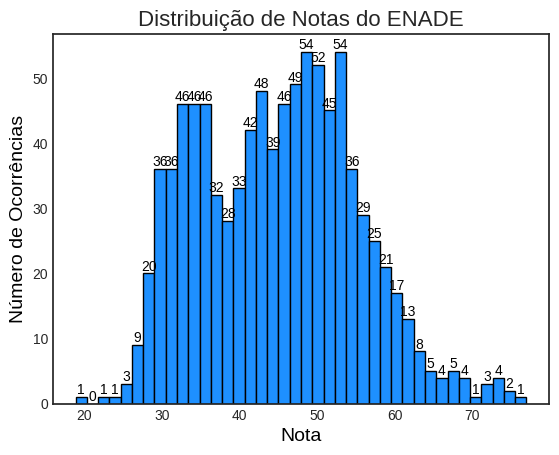

In [ ]:
# Histograma notas

plt.style.use('seaborn-v0_8-white')

ax = base_notas['MEDIA_NOTA_ENADE'].hist(
    bins=40,
    color='dodgerblue',  # Cor das barras
    edgecolor='black',  # Cor da borda das barras
    #alpha=0.7           # Transparência das barras
)

plt.title('Distribuição de Notas do ENADE', fontsize=16)
plt.xlabel('Nota', fontsize=14, color='black')
plt.ylabel('Número de Ocorrências', fontsize=14, color='black')
plt.grid(False)

for rect in ax.patches:
    height = rect.get_height()  # Altura da barra (número de ocorrências)
    width = rect.get_width()    # Largura da barra
    x_position = rect.get_x() + width / 2  # Posição x da barra
    y_position = height        # Posição y da barra

    # Adicionando o número de ocorrências (height) em cima da barra
    plt.text(x_position, y_position, str(int(height)), ha='center', va='bottom', fontsize=10, color='black')

# Ajustando a aparência do grid


# Exibindo o gráfico
plt.show()


### Analisando quantidade de grupos possíveis e pontos de corte

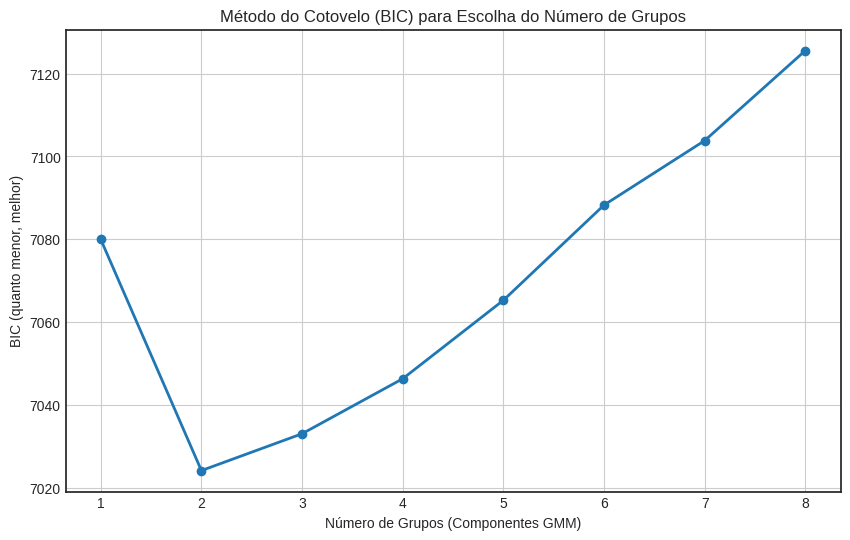

In [ ]:
from sklearn.mixture import GaussianMixture
import numpy as np
import matplotlib.pyplot as plt

# Pegando os dados como array 2D (exigência do GMM)
X = base_notas['MEDIA_NOTA_ENADE'].dropna().values.reshape(-1, 1)

bic_values = []
n_components_range = range(1, 9)  # testando de 1 a 8 grupos

for n in n_components_range:
    gmm = GaussianMixture(n_components=n, random_state=42)
    gmm.fit(X)
    bic_values.append(gmm.bic(X))

# Plotando o método do cotovelo
plt.figure(figsize=(10, 6))
plt.plot(n_components_range, bic_values, marker='o', linewidth=2)
plt.title('Método do Cotovelo (BIC) para Escolha do Número de Grupos')
plt.xlabel('Número de Grupos (Componentes GMM)')
plt.ylabel('BIC (quanto menor, melhor)')
plt.grid(True)
plt.show()

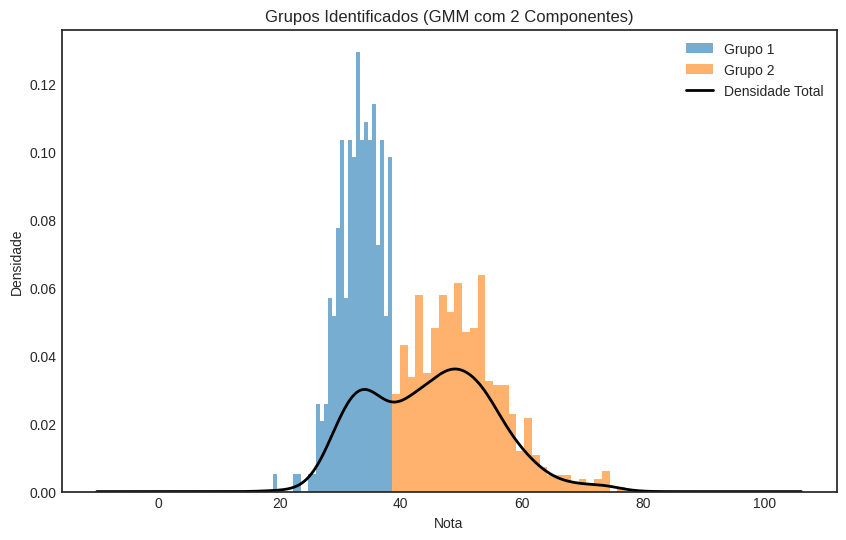

In [ ]:
from sklearn.mixture import GaussianMixture
import numpy as np
import matplotlib.pyplot as plt

X = base_notas['MEDIA_NOTA_ENADE'].dropna().values.reshape(-1, 1)

# Treina o GMM com 2 grupos (resultado do BIC)
gmm = GaussianMixture(n_components=2, random_state=42)
gmm.fit(X)

# Probabilidade de cada ponto pertencer a cada grupo
labels = gmm.predict(X)

# Plotando
plt.figure(figsize=(10, 6))

for group in np.unique(labels):
    plt.hist(X[labels == group], bins=30, alpha=0.6, density=True, label=f'Grupo {group+1}')

# KDE para visualização geral
base_notas['MEDIA_NOTA_ENADE'].plot(kind='kde', color='black', linewidth=2, label='Densidade Total')

plt.title('Grupos Identificados (GMM com 2 Componentes)')
plt.xlabel('Nota')
plt.ylabel('Densidade')
plt.legend()
plt.show()

In [ ]:
from sklearn.mixture import GaussianMixture
import numpy as np
from scipy.stats import norm

# Dados
X = base_notas['MEDIA_NOTA_ENADE'].dropna().values.reshape(-1, 1)

# Ajusta o modelo
gmm = GaussianMixture(n_components=2, random_state=42).fit(X)

means = gmm.means_.flatten()
stds = np.sqrt(gmm.covariances_.flatten())
weights = gmm.weights_

# Ordena para garantir (grupo baixo, grupo alto)
idx = np.argsort(means)
means = means[idx]
stds = stds[idx]
weights = weights[idx]

# Funções densidade dos dois grupos
def f1(x):
    return weights[0] * norm.pdf(x, means[0], stds[0])

def f2(x):
    return weights[1] * norm.pdf(x, means[1], stds[1])

# Busca o ponto de cruzamento
xs = np.linspace(min(X), max(X), 1000)
diff = np.abs(f1(xs) - f2(xs))
cut = xs[np.argmin(diff)]

print(f"Ponto de corte entre os grupos ≈ {cut[0]:.2f}")

Ponto de corte entre os grupos ≈ 38.55


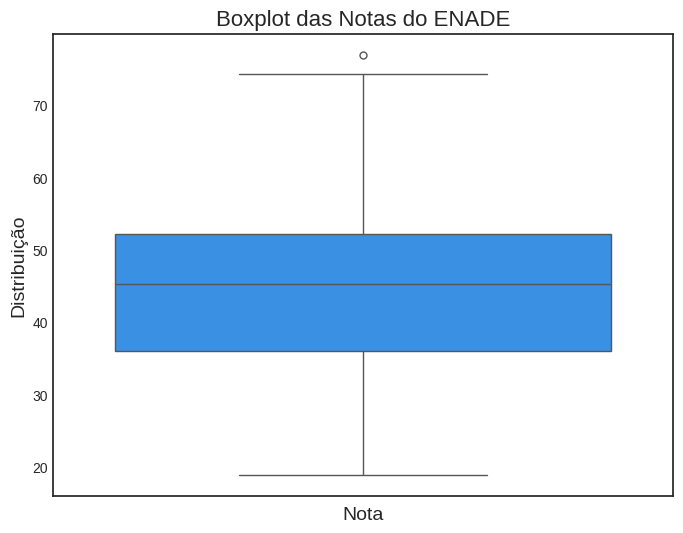

In [ ]:
# Usando o estilo seaborn para melhorar a aparência
plt.style.use('seaborn-v0_8-white')

# Criando o boxplot
plt.figure(figsize=(8, 6))
ax = sns.boxplot(data=base_notas, y='MEDIA_NOTA_ENADE', color='dodgerblue', fliersize=5)

# Adicionando os valores dos quartis no gráfico
Q1 = np.percentile(base_notas['MEDIA_NOTA_ENADE'], 25)
Q2 = np.percentile(base_notas['MEDIA_NOTA_ENADE'], 50)
Q3 = np.percentile(base_notas['MEDIA_NOTA_ENADE'], 75)
min_val = base_notas['MEDIA_NOTA_ENADE'].min()
max_val = base_notas['MEDIA_NOTA_ENADE'].max()

# Adicionando título e rótulos
plt.title('Boxplot das Notas do ENADE', fontsize=16)
plt.xlabel('Nota', fontsize=14)
plt.ylabel('Distribuição', fontsize=14)

# Exibindo o gráfico
plt.show()


In [ ]:
import pandas as pd

# Calcular as medidas centrais
media = base_notas['MEDIA_NOTA_ENADE'].mean()
mediana = base_notas['MEDIA_NOTA_ENADE'].median()
moda = base_notas['MEDIA_NOTA_ENADE'].mode()[0]
desvio_padrao = base_notas['MEDIA_NOTA_ENADE'].std()
maximo = base_notas['MEDIA_NOTA_ENADE'].max()
minimo = base_notas['MEDIA_NOTA_ENADE'].min()

# Calcular os quartis
Q1 = base_notas['MEDIA_NOTA_ENADE'].quantile(0.25)
Q3 = base_notas['MEDIA_NOTA_ENADE'].quantile(0.75)

# Calcular os quantis de 33% em 33%
q33 = base_notas['MEDIA_NOTA_ENADE'].quantile(0.33)
q66 = base_notas['MEDIA_NOTA_ENADE'].quantile(0.66)

# Mostrar os resultados organizados em 3 colunas
print(f"{'Estatística':<20}{'Valor':<25}")
print(f"{'Mínimo':<20}{minimo:<25.2f}")
print(f"{'1º Quartil (Q1)':<20}{Q1:<25.2f}")
print(f"{'Quantil 33%':<20}{q33:<25.2f}")
print(f"{'Mediana':<20}{mediana:<25.2f}")
print(f"{'Quantil 66%':<20}{q66:<25.2f}")
print(f"{'3º Quartil (Q3)':<20}{Q3:<25.2f}")
print(f"{'Máximo':<20}{maximo:<25.2f}")
print("-------------------------")
print(f"{'Média':<20}{media:<25.2f}")
print(f"{'Moda':<20}{moda:<25.2f}")
print(f"{'Desvio Padrão':<20}{desvio_padrao:<25.2f}")


Estatística         Valor                    
Mínimo              18.90                    
1º Quartil (Q1)     35.95                    
Quantil 33%         39.65                    
Mediana             45.30                    
Quantil 66%         49.57                    
3º Quartil (Q3)     52.21                    
Máximo              76.99                    
-------------------------
Média               44.86                    
Moda                40.97                    
Desvio Padrão       10.18                    


In [ ]:
base_infra.columns

Index(['CO_IES', 'NO_IES', 'NO_CURSO', 'NO_MUNICIPIO', 'MEDIA_NOTA_ENADE',
       'NU_ANO_CENSO', 'NO_REGIAO_IES', 'CO_REGIAO_IES', 'NO_UF_IES',
       'SG_UF_IES', 'CO_UF_IES', 'NO_MUNICIPIO_IES', 'CO_MUNICIPIO_IES',
       'IN_CAPITAL_IES', 'NO_MESORREGIAO_IES', 'CO_MESORREGIAO_IES',
       'NO_MICRORREGIAO_IES', 'CO_MICRORREGIAO_IES',
       'TP_ORGANIZACAO_ACADEMICA', 'TP_REDE', 'TP_CATEGORIA_ADMINISTRATIVA',
       'IN_COMUNITARIA', 'IN_CONFESSIONAL', 'NO_MANTENEDORA', 'CO_MANTENEDORA',
       'SG_IES', 'DS_ENDERECO_IES', 'DS_NUMERO_ENDERECO_IES',
       'DS_COMPLEMENTO_ENDERECO_IES', 'NO_BAIRRO_IES', 'NU_CEP_IES',
       'QT_TEC_TOTAL', 'QT_TEC_FUNDAMENTAL_INCOMP_FEM',
       'QT_TEC_FUNDAMENTAL_INCOMP_MASC', 'QT_TEC_FUNDAMENTAL_COMP_FEM',
       'QT_TEC_FUNDAMENTAL_COMP_MASC', 'QT_TEC_MEDIO_FEM', 'QT_TEC_MEDIO_MASC',
       'QT_TEC_SUPERIOR_FEM', 'QT_TEC_SUPERIOR_MASC',
       'QT_TEC_ESPECIALIZACAO_FEM', 'QT_TEC_ESPECIALIZACAO_MASC',
       'QT_TEC_MESTRADO_FEM', 'QT_TEC_MESTRA

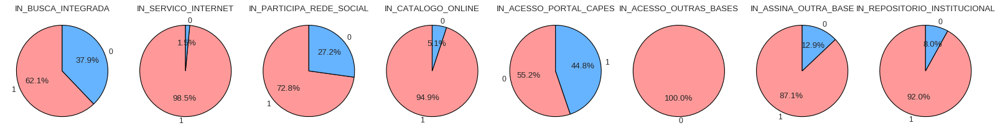

In [ ]:

plt.style.use('seaborn-v0_8-white')  # Estilo para o gráfico

# Lista das colunas
colunas = [
    'IN_BUSCA_INTEGRADA',
    'IN_SERVICO_INTERNET',
    'IN_PARTICIPA_REDE_SOCIAL',
    'IN_CATALOGO_ONLINE',
    'IN_ACESSO_PORTAL_CAPES',
    'IN_ACESSO_OUTRAS_BASES',
    'IN_ASSINA_OUTRA_BASE',
    'IN_REPOSITORIO_INSTITUCIONAL'
]

# Calcular a contagem para cada coluna
contagem_colunas = {}

for coluna in colunas:
    contagem_colunas[coluna] = base_infra[coluna].value_counts()

# Plotando os gráficos de pizza
fig, axes = plt.subplots(nrows=1, ncols=len(colunas), figsize=(20, 5))

# Caso haja apenas um eixo, ajusta para ser iterable
if len(colunas) == 1:
    axes = [axes]

# Gerando os gráficos de pizza
for ax, coluna in zip(axes, colunas):
    # Gerando o gráfico de pizza
    ax.pie(contagem_colunas[coluna], labels=contagem_colunas[coluna].index, autopct='%1.1f%%',
           startangle=90, colors=['#ff9999','#66b3ff','#99ff99','#ffcc99'], wedgeprops={'edgecolor': 'black'})
    ax.set_title(f'{coluna}', fontsize=12)

# Ajustando o layout
plt.tight_layout()
plt.show()


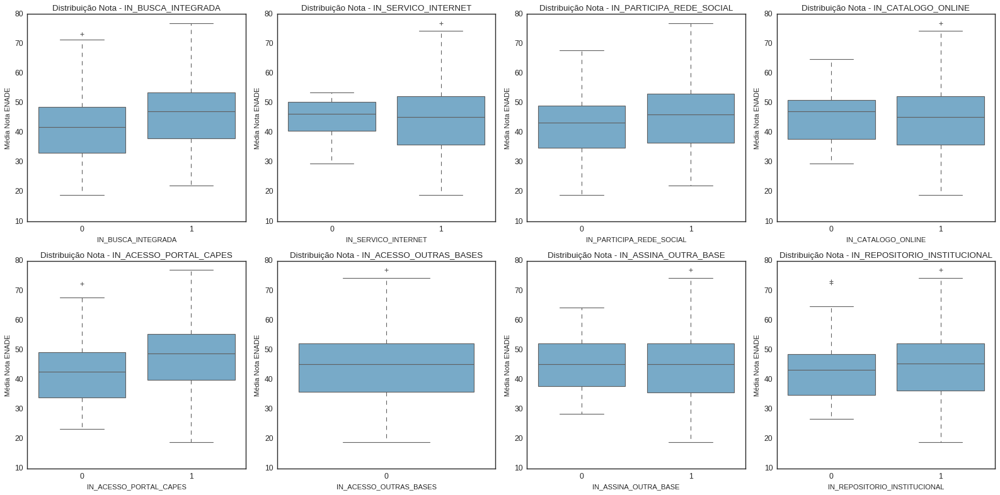

In [ ]:

plt.style.use('seaborn-v0_8-white')

# Lista das colunas a serem cruzadas com a nota
colunas = [
    'IN_BUSCA_INTEGRADA', 'IN_SERVICO_INTERNET', 'IN_PARTICIPA_REDE_SOCIAL',
    'IN_CATALOGO_ONLINE','IN_ACESSO_PORTAL_CAPES', 'IN_ACESSO_OUTRAS_BASES',
    'IN_ASSINA_OUTRA_BASE', 'IN_REPOSITORIO_INSTITUCIONAL'
]

# Criando os subgráficos - 2 linhas e 4 colunas
n_cols = 4  # Definindo 4 colunas
n_rows = 2  # Definindo 2 linhas

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 10))

# Caso haja apenas um eixo, ajusta para ser iterable
if len(colunas) == 1:
    axes = [axes]

# Garantir que o eixo não tenha mais gráficos do que o necessário
axes = axes.flatten()  # Para garantir que seja iterable, mesmo que tenha 1 ou 2 eixos

# Gerando os gráficos de boxplot
for i, coluna in enumerate(colunas):
    ax = axes[i]
    sns.boxplot(x=base_infra[coluna], y=base_infra['MEDIA_NOTA_ENADE'], ax=ax, palette='Blues', legend=False, hue=ax)
    ax.set_title(f'Distribuição Nota - {coluna}', fontsize=12)
    ax.set_xlabel(coluna, fontsize=10)
    ax.set_ylabel('Média Nota ENADE', fontsize=10)

# Ajustando o layout
plt.tight_layout()
plt.show()


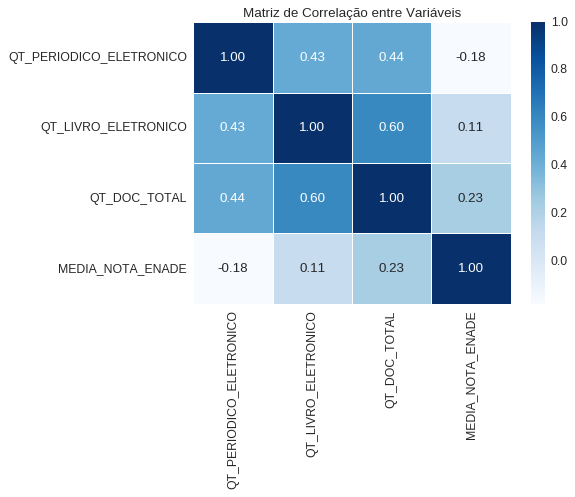

In [ ]:
# Seleciona as colunas relevantes para análise
corr_cols = ['QT_PERIODICO_ELETRONICO', 'QT_LIVRO_ELETRONICO', 'QT_DOC_TOTAL', 'MEDIA_NOTA_ENADE']
corr_matrix = base_infra[corr_cols].corr()

# Heatmap para ver a correlação
sns.heatmap(corr_matrix, annot=True, cmap='Blues', fmt=".2f", linewidths=0.5)
plt.title('Matriz de Correlação entre Variáveis')
plt.show()


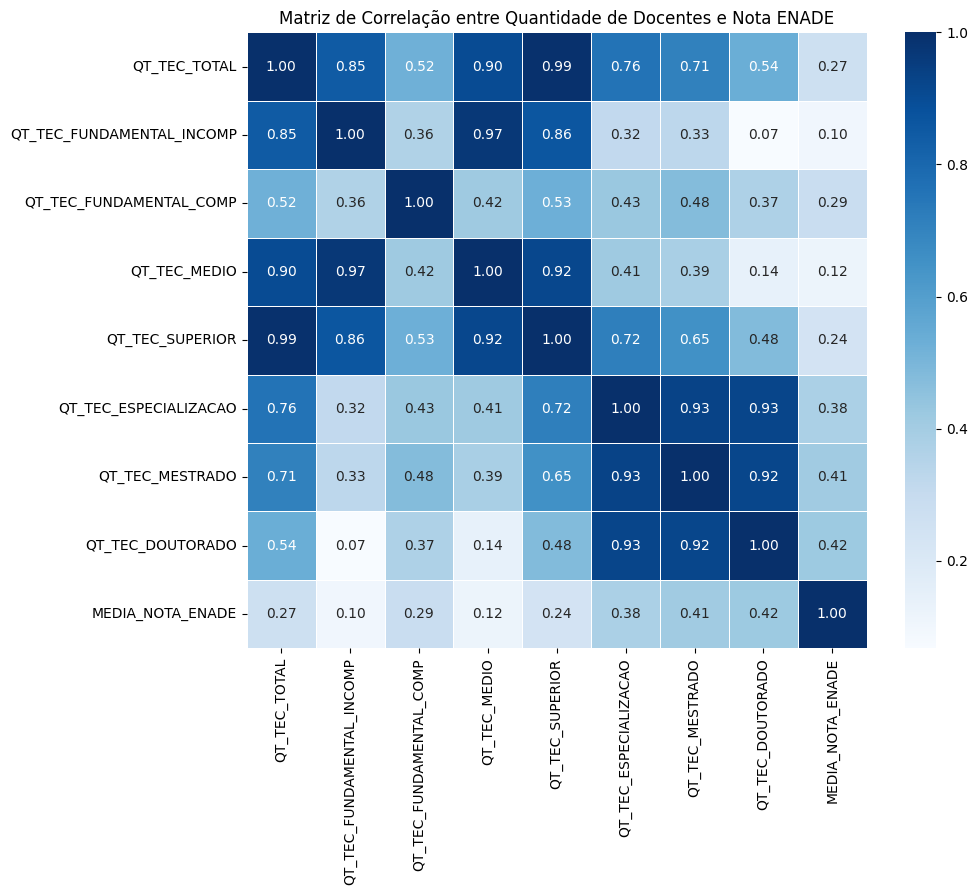

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Lista das colunas de docentes que vamos somar
colunas_docentes = [
    "QT_TEC_TOTAL",
    "QT_TEC_FUNDAMENTAL_INCOMP_FEM", "QT_TEC_FUNDAMENTAL_INCOMP_MASC",
    "QT_TEC_FUNDAMENTAL_COMP_FEM", "QT_TEC_FUNDAMENTAL_COMP_MASC",
    "QT_TEC_MEDIO_FEM", "QT_TEC_MEDIO_MASC",
    "QT_TEC_SUPERIOR_FEM", "QT_TEC_SUPERIOR_MASC",
    "QT_TEC_ESPECIALIZACAO_FEM", "QT_TEC_ESPECIALIZACAO_MASC",
    "QT_TEC_MESTRADO_FEM", "QT_TEC_MESTRADO_MASC",
    "QT_TEC_DOUTORADO_FEM", "QT_TEC_DOUTORADO_MASC"
]

# Criar novas colunas somando fem + masc
base_infra["QT_TEC_FUNDAMENTAL_INCOMP"] = base_infra["QT_TEC_FUNDAMENTAL_INCOMP_FEM"] + base_infra["QT_TEC_FUNDAMENTAL_INCOMP_MASC"]
base_infra["QT_TEC_FUNDAMENTAL_COMP"] = base_infra["QT_TEC_FUNDAMENTAL_COMP_FEM"] + base_infra["QT_TEC_FUNDAMENTAL_COMP_MASC"]
base_infra["QT_TEC_MEDIO"] = base_infra["QT_TEC_MEDIO_FEM"] + base_infra["QT_TEC_MEDIO_MASC"]
base_infra["QT_TEC_SUPERIOR"] = base_infra["QT_TEC_SUPERIOR_FEM"] + base_infra["QT_TEC_SUPERIOR_MASC"]
base_infra["QT_TEC_ESPECIALIZACAO"] = base_infra["QT_TEC_ESPECIALIZACAO_FEM"] + base_infra["QT_TEC_ESPECIALIZACAO_MASC"]
base_infra["QT_TEC_MESTRADO"] = base_infra["QT_TEC_MESTRADO_FEM"] + base_infra["QT_TEC_MESTRADO_MASC"]
base_infra["QT_TEC_DOUTORADO"] = base_infra["QT_TEC_DOUTORADO_FEM"] + base_infra["QT_TEC_DOUTORADO_MASC"]

# Lista final de colunas para correlação
corr_cols = [
    "QT_TEC_TOTAL",
    "QT_TEC_FUNDAMENTAL_INCOMP",
    "QT_TEC_FUNDAMENTAL_COMP",
    "QT_TEC_MEDIO",
    "QT_TEC_SUPERIOR",
    "QT_TEC_ESPECIALIZACAO",
    "QT_TEC_MESTRADO",
    "QT_TEC_DOUTORADO",
    "MEDIA_NOTA_ENADE"
]

# Matriz de correlação
corr_matrix = base_infra[corr_cols].corr()

# Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='Blues', fmt=".2f", linewidths=0.5)
plt.title('Matriz de Correlação entre Quantidade de Docentes e Nota ENADE')
plt.show()


/tmp/ipython-input-1529606000.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


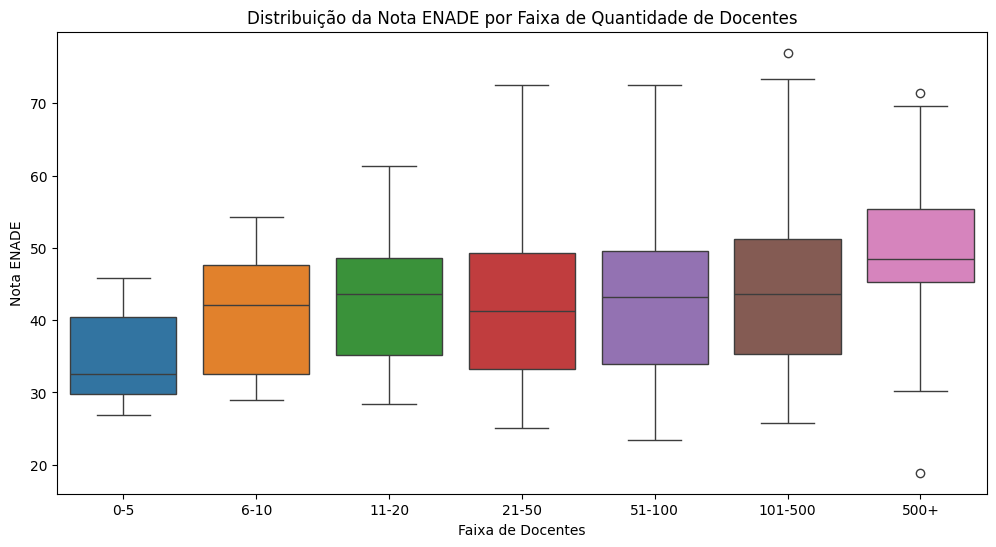

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Definir faixas de quantidade de docentes
bins = [0, 5, 10, 20, 50, 100, 500, 1000]
labels = ["0-5", "6-10", "11-20", "21-50", "51-100", "101-500", "500+"]

# Criar coluna categórica com faixas
base_infra["QT_TEC_TOTAL_FAIXA"] = pd.cut(
    base_infra["QT_TEC_TOTAL"],
    bins=bins,
    labels=labels,
    include_lowest=True
)

# Boxplot da nota ENADE por faixa de docentes
plt.figure(figsize=(12, 6))
sns.boxplot(
    data=base_infra,
    x="QT_TEC_TOTAL_FAIXA",
    y="MEDIA_NOTA_ENADE",
    palette="tab10"
)
plt.title("Distribuição da Nota ENADE por Faixa de Quantidade de Docentes")
plt.xlabel("Faixa de Docentes")
plt.ylabel("Nota ENADE")
plt.show()


/tmp/ipython-input-1435369620.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1435369620.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1435369620.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1435369620.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1435369620.py:20: FutureWarning: 

Passin

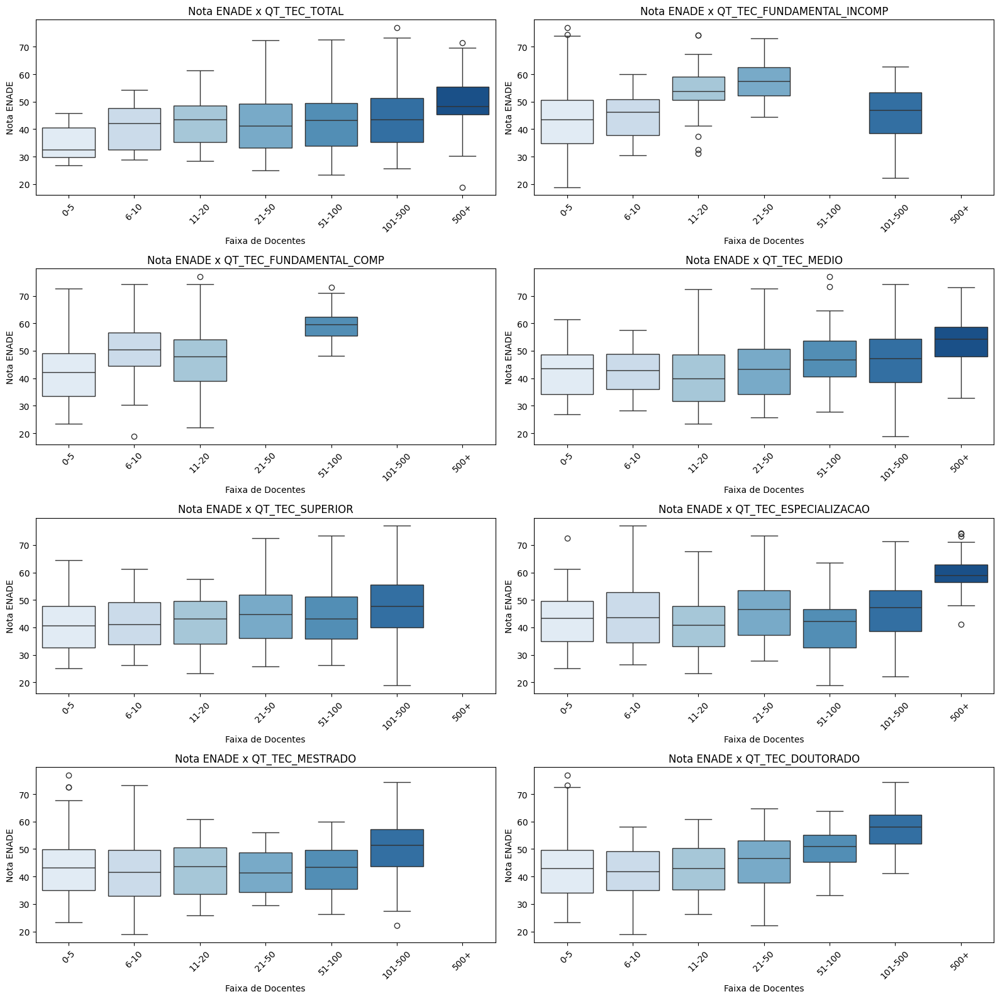

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Definir faixas
bins = [0, 5, 10, 20, 50, 100, 500, 1000]
labels = ["0-5", "6-10", "11-20", "21-50", "51-100", "101-500", "500+"]

# Criar colunas de faixa para cada nível de docente
for col in corr_cols[:-1]:  # exceto MEDIA_NOTA_ENADE
    base_infra[f"{col}_FAIXA"] = pd.cut(base_infra[col], bins=bins, labels=labels, include_lowest=True)

# Grid de boxplots
n_cols = 2
n_rows = (len(corr_cols)-1 + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows*4))
axes = axes.flatten()

for i, col in enumerate(corr_cols[:-1]):
    sns.boxplot(
        data=base_infra,
        x=f"{col}_FAIXA",
        y="MEDIA_NOTA_ENADE",
        palette="Blues",
        ax=axes[i]
    )
    axes[i].set_title(f"Nota ENADE x {col}")
    axes[i].set_xlabel("Faixa de Docentes")
    axes[i].set_ylabel("Nota ENADE")
    axes[i].tick_params(axis='x', rotation=45)

# Remover axes extras
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


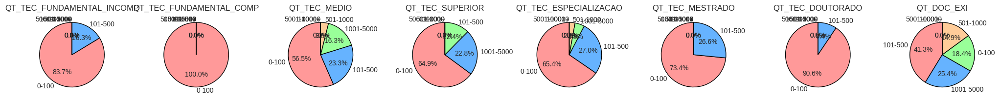

In [ ]:
# Estilo para o gráfico
plt.style.use('seaborn-v0_8-white')

# Colunas masculinas e femininas para somar
colunas_fem = [
    'QT_TEC_FUNDAMENTAL_INCOMP_FEM',
    'QT_TEC_FUNDAMENTAL_COMP_FEM',
    'QT_TEC_MEDIO_FEM',
    'QT_TEC_SUPERIOR_FEM',
    'QT_TEC_ESPECIALIZACAO_FEM',
    'QT_TEC_MESTRADO_FEM',
    'QT_TEC_DOUTORADO_FEM',
    'QT_DOC_EX_FEMI'
]

colunas_masc = [
    'QT_TEC_FUNDAMENTAL_INCOMP_MASC',
    'QT_TEC_FUNDAMENTAL_COMP_MASC',
    'QT_TEC_MEDIO_MASC',
    'QT_TEC_SUPERIOR_MASC',
    'QT_TEC_ESPECIALIZACAO_MASC',
    'QT_TEC_MESTRADO_MASC',
    'QT_TEC_DOUTORADO_MASC',
    'QT_DOC_EX_MASC'
]

# Calcular a soma de cada par de colunas (masculinas + femininas)
colunas_totais_combinadas = {}

for fem, masc in zip(colunas_fem, colunas_masc):
    # Somando as colunas femininas e masculinas
    soma = base_infra[fem] + base_infra[masc]
    colunas_totais_combinadas[fem.replace('_FEM', '')] = soma

# Agora, vamos discretizar as colunas somadas em faixas

# Definir os limites das faixas (bins) manualmente ou usar uma abordagem automática
bins = [0, 100, 500, 1000, 5000, 10000, 50000]  # Exemplo de faixas
labels = ['0-100', '101-500', '501-1000', '1001-5000', '5001-10000', '10001+']

# Discretizar os valores em faixas
colunas_discretizadas = {}

for coluna, soma in colunas_totais_combinadas.items():
    # Criando as faixas com pd.cut
    colunas_discretizadas[coluna] = pd.cut(soma, bins=bins, labels=labels, right=False)

# Contar a frequência de cada faixa
contagem_faixas = {}
for coluna, faixas in colunas_discretizadas.items():
    contagem_faixas[coluna] = faixas.value_counts()

# Plotando os gráficos de pizza
fig, axes = plt.subplots(nrows=1, ncols=len(colunas_discretizadas), figsize=(20, 5))

# Caso haja apenas um eixo, ajusta para ser iterable
if len(colunas_discretizadas) == 1:
    axes = [axes]

# Gerando os gráficos de pizza
for ax, (coluna, contagem) in zip(axes, contagem_faixas.items()):
    # Gerando o gráfico de pizza
    ax.pie(contagem, labels=contagem.index, autopct='%1.1f%%',
           startangle=90, colors=['#ff9999','#66b3ff','#99ff99','#ffcc99','#c2c2f0'], wedgeprops={'edgecolor': 'black'})
    ax.set_title(f'{coluna}', fontsize=12)

# Ajustando o layout
plt.tight_layout()
plt.show()


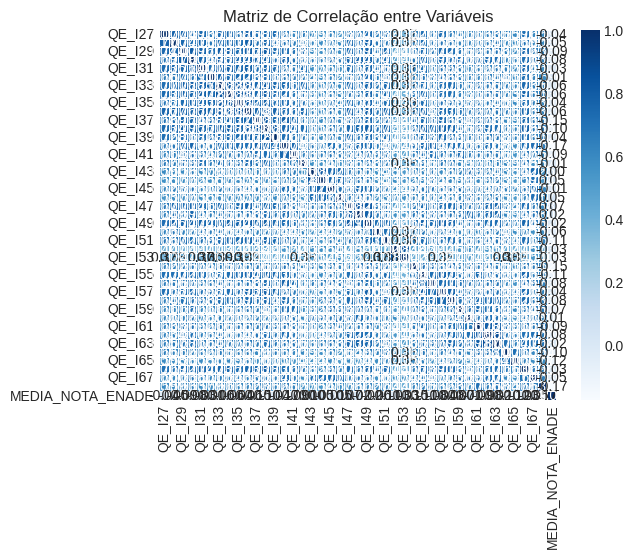

In [ ]:
# Seleciona as colunas relevantes para análise
corr_cols = ['QE_I27', 'QE_I28', 'QE_I29', 'QE_I30', 'QE_I31', 'QE_I32', 'QE_I33', 'QE_I34', 'QE_I35', 'QE_I36',
 'QE_I37', 'QE_I38', 'QE_I39', 'QE_I40', 'QE_I41', 'QE_I42', 'QE_I43', 'QE_I44', 'QE_I45', 'QE_I46',
 'QE_I47', 'QE_I48', 'QE_I49', 'QE_I50', 'QE_I51', 'QE_I52', 'QE_I53', 'QE_I54', 'QE_I55', 'QE_I56',
 'QE_I57', 'QE_I58', 'QE_I59', 'QE_I60', 'QE_I61', 'QE_I62', 'QE_I63', 'QE_I64', 'QE_I65', 'QE_I66',
 'QE_I67', 'QE_I68', 'MEDIA_NOTA_ENADE']


corr_matrix = base_percepcao[corr_cols].corr()

# Heatmap para ver a correlação
sns.heatmap(corr_matrix, annot=True, cmap='Blues', fmt=".2f", linewidths=0.5)
plt.title('Matriz de Correlação entre Variáveis')
plt.show()

/tmp/ipython-input-3357051085.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=corr_media_sorted.values, y=corr_media_sorted.index, palette="Blues_d")


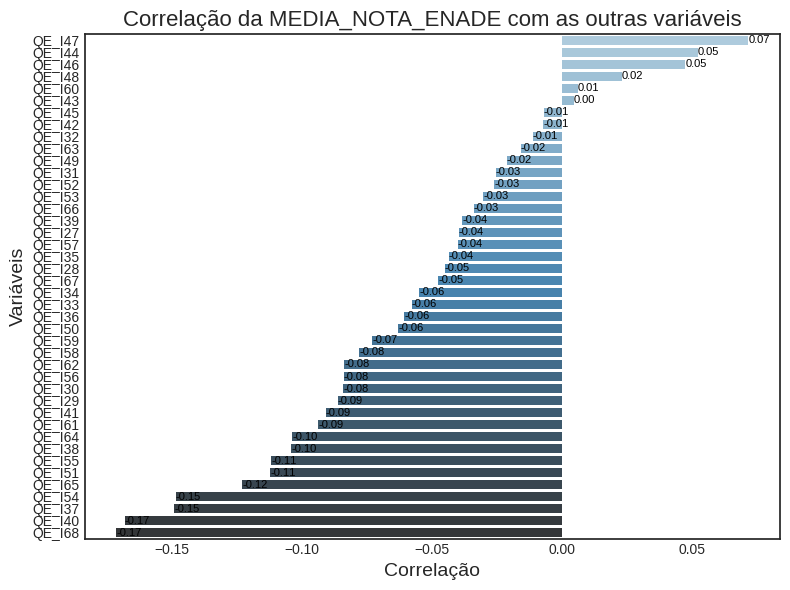

In [ ]:
corr_matrix = base_percepcao[corr_cols].corr()

# Selecionar a correlação da 'MEDIA_NOTA_ENADE' com as outras variáveis
corr_media = corr_matrix['MEDIA_NOTA_ENADE'].drop('MEDIA_NOTA_ENADE')  # Remove a correlação de 'MEDIA_NOTA_ENADE' consigo mesma

# Ordenar pela correlação, de forma decrescente
corr_media_sorted = corr_media.sort_values(ascending=False)

# Plotando o gráfico
plt.figure(figsize=(8, 6))
sns.barplot(x=corr_media_sorted.values, y=corr_media_sorted.index, palette="Blues_d")

# Adicionar os valores absolutos (correlações) ao lado das barras
for i, value in enumerate(corr_media_sorted.values):
    plt.text(value, i, f'{value:.2f}', va='center', ha='left', fontsize=8, color='black')

# Ajustar título e etiquetas
plt.title('Correlação da MEDIA_NOTA_ENADE com as outras variáveis', fontsize=16)
plt.xlabel('Correlação', fontsize=14)
plt.ylabel('Variáveis', fontsize=14)

# Aumentando a espessura das barras e exibindo o gráfico
plt.tight_layout()
plt.show()


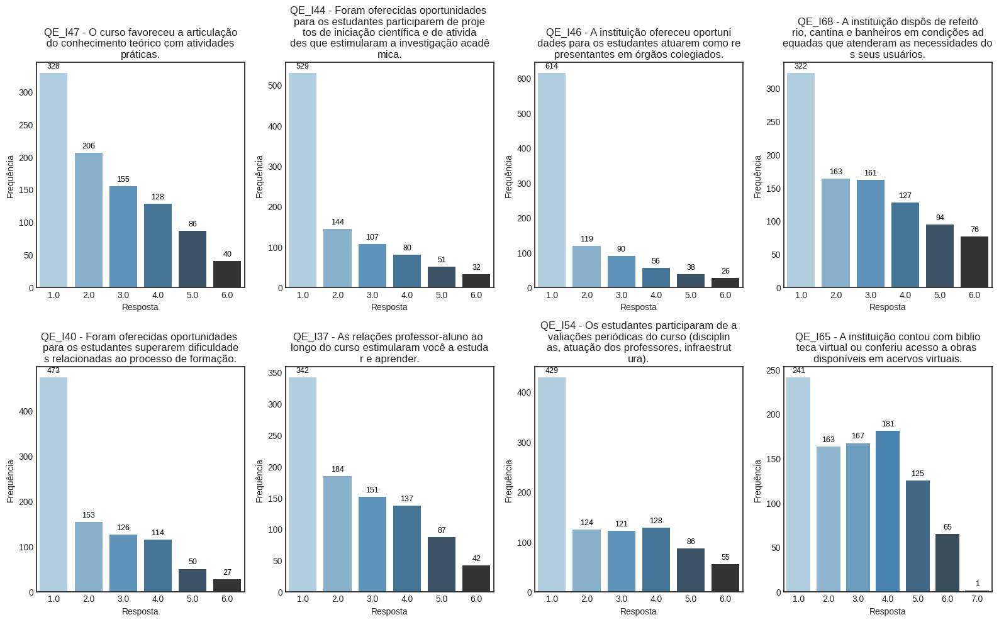

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Mapeamento das variáveis para seus respectivos títulos
titulos = {
    'QE_I47': 'O curso favoreceu a articulação do conhecimento teórico com atividades práticas.',
    'QE_I44': 'Foram oferecidas oportunidades para os estudantes participarem de projetos de iniciação científica e de atividades que estimularam a investigação acadêmica.',
    'QE_I46': 'A instituição ofereceu oportunidades para os estudantes atuarem como representantes em órgãos colegiados.',
    'QE_I68': 'A instituição dispôs de refeitório, cantina e banheiros em condições adequadas que atenderam as necessidades dos seus usuários.',
    'QE_I40': 'Foram oferecidas oportunidades para os estudantes superarem dificuldades relacionadas ao processo de formação.',
    'QE_I37': 'As relações professor-aluno ao longo do curso estimularam você a estudar e aprender.',
    'QE_I54': 'Os estudantes participaram de avaliações periódicas do curso (disciplinas, atuação dos professores, infraestrutura).',
    'QE_I65': 'A instituição contou com biblioteca virtual ou conferiu acesso a obras disponíveis em acervos virtuais.'
}

# Lista das colunas de interesse
colunas_interesse = ['QE_I47', 'QE_I44', 'QE_I46', 'QE_I68', 'QE_I40', 'QE_I37', 'QE_I54', 'QE_I65']

# Criando o gráfico de distribuição para as variáveis selecionadas
plt.figure(figsize=(16, 10))

# Loop para gerar um gráfico de distribuição para cada variável
for i, coluna in enumerate(colunas_interesse, 1):
    plt.subplot(2, 4, i)  # Ajuste o número de linhas e colunas conforme necessário
    ax = sns.countplot(data=base_percepcao, x=coluna, palette='Blues_d', hue=coluna, legend=False)

    # Quebra o título em duas linhas se for muito longo
    titulo = f"{coluna} - {titulos[coluna]}"  # Incluindo o número da questão no título
    if len(titulo) > 40:
        titulo = '\n'.join([titulo[i:i+40] for i in range(0, len(titulo), 40)])  # Divide o título a cada 40 caracteres

    plt.title(titulo)  # Usando o título modificado
    plt.xlabel('Resposta')
    plt.ylabel('Frequência')

    # Adicionando os rótulos com a frequência em cima das barras
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}',
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center',
                    fontsize=9, color='black',
                    xytext=(0, 8), textcoords='offset points')

# Ajustando o layout para evitar sobreposição
plt.subplots_adjust(hspace=0.4, wspace=3.2)  # Ajusta o espaçamento entre os subgráficos
plt.tight_layout()  # Ajusta o layout automaticamente
plt.show()


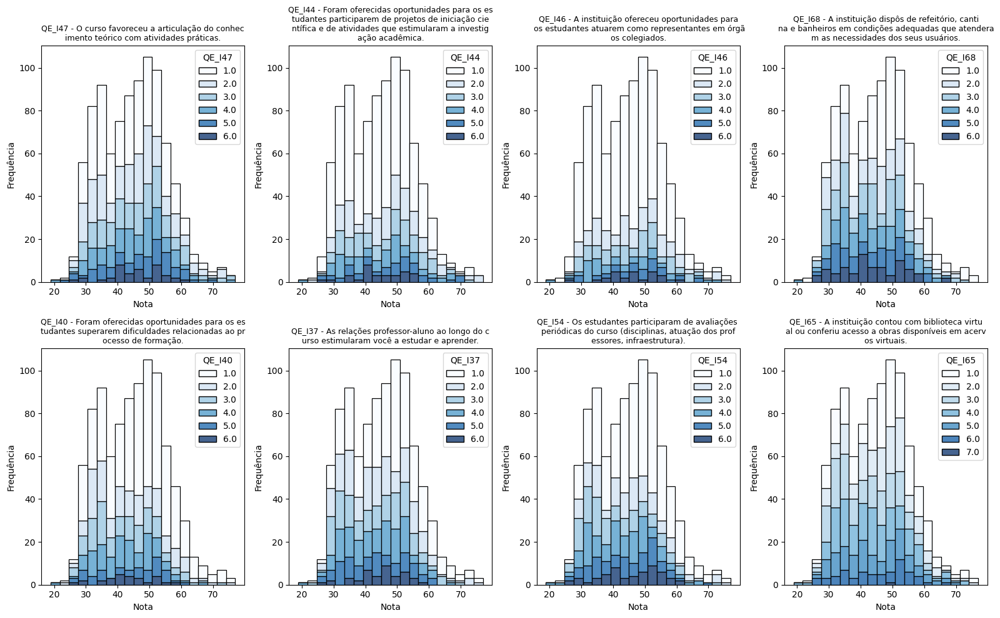

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(16, 10))

for i, coluna in enumerate(colunas_interesse, 1):
    plt.subplot(2, 4, i)

    ax = sns.histplot(
        data=base_percepcao,
        x="MEDIA_NOTA_ENADE",   # ajuste para o nome real da coluna de nota
        hue=coluna,       # as respostas da questão
        bins=20,          # número de intervalos da nota
        kde=False,        # pode colocar True se quiser a curva de densidade
        multiple="stack", # pode trocar para "dodge" (lado a lado) ou "fill" (%)
        palette="Blues"
    )

    titulo = f"{coluna} - {titulos[coluna]}"
    if len(titulo) > 50:
        titulo = '\n'.join([titulo[i:i+50] for i in range(0, len(titulo), 50)])

    plt.title(titulo, fontsize=9)
    plt.xlabel("Nota")
    plt.ylabel("Frequência")

plt.tight_layout()
plt.show()


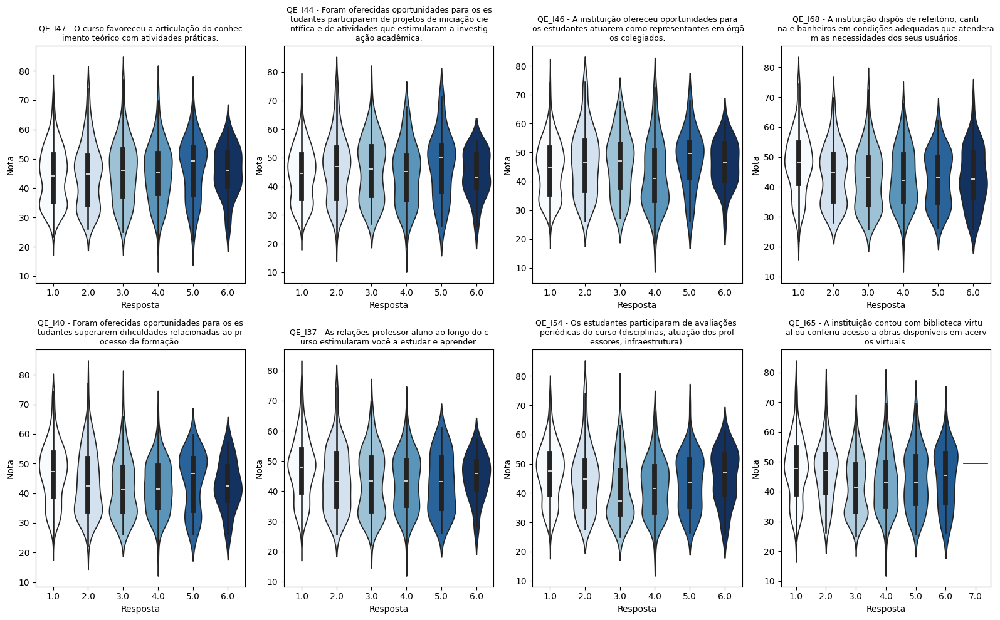

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(16, 10))

for i, coluna in enumerate(colunas_interesse, 1):
    plt.subplot(2, 4, i)

    ax = sns.violinplot(
            data=base_percepcao,
            x=coluna,
            y="MEDIA_NOTA_ENADE",
            palette="Blues",
            hue = coluna,
            legend=False
)

    titulo = f"{coluna} - {titulos[coluna]}"
    if len(titulo) > 50:
        titulo = '\n'.join([titulo[i:i+50] for i in range(0, len(titulo), 50)])

    plt.title(titulo, fontsize=9)
    plt.xlabel("Resposta")
    plt.ylabel("Nota")

plt.tight_layout()
plt.show()


ValueError: arange: cannot compute length

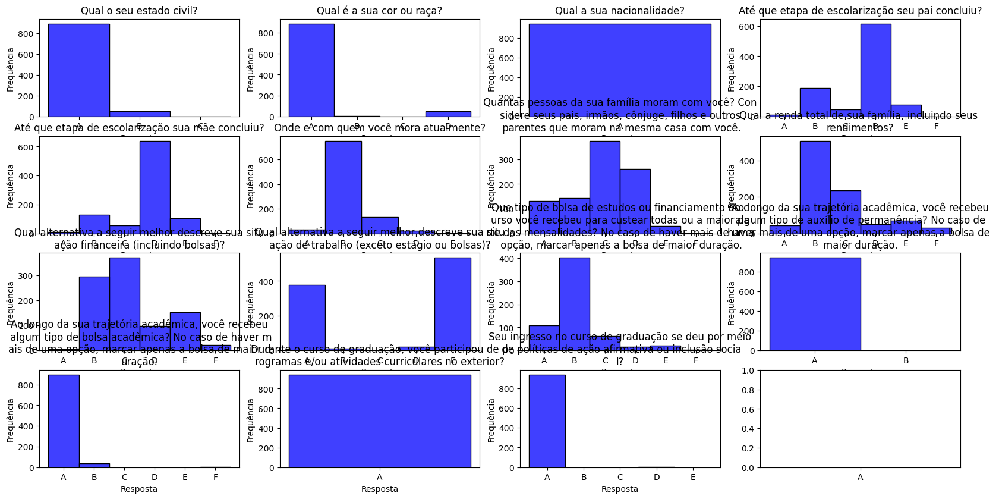

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Mapeamento das variáveis para seus respectivos títulos
titulos_socioec = {
    'QE_I01': 'Qual o seu estado civil?',
    'QE_I02': 'Qual é a sua cor ou raça?',
    'QE_I03': 'Qual a sua nacionalidade?',
    'QE_I04': 'Até que etapa de escolarização seu pai concluiu?',
    'QE_I05': 'Até que etapa de escolarização sua mãe concluiu?',
    'QE_I06': 'Onde e com quem você mora atualmente?',
    'QE_I07': 'Quantas pessoas da sua família moram com você? Considere seus pais, irmãos, cônjuge, filhos e outros parentes que moram na mesma casa com você.',
    'QE_I08': 'Qual a renda total de sua família, incluindo seus rendimentos?',
    'QE_I09': 'Qual alternativa a seguir melhor descreve sua situação financeira (incluindo bolsas)?',
    'QE_I10': 'Qual alternativa a seguir melhor descreve sua situação de trabalho (exceto estágio ou bolsas)?',
    'QE_I11': 'Que tipo de bolsa de estudos ou financiamento do curso você recebeu para custear todas ou a maior parte das mensalidades? No caso de haver mais de uma opção, marcar apenas a bolsa de maior duração.',
    'QE_I12': 'Ao longo da sua trajetória acadêmica, você recebeu algum tipo de auxílio de permanência? No caso de haver mais de uma opção, marcar apenas a bolsa de maior duração.',
    'QE_I13': 'Ao longo da sua trajetória acadêmica, você recebeu algum tipo de bolsa acadêmica? No caso de haver mais de uma opção, marcar apenas a bolsa de maior duração.',
    'QE_I14': 'Durante o curso de graduação, você participou de programas e/ou atividades curriculares no exterior?',
    'QE_I15': 'Seu ingresso no curso de graduação se deu por meio de políticas de ação afirmativa ou inclusão social?',
    'QE_I16': 'Em que unidade da Federação você concluiu o ensino médio?',
    'QE_I17': 'Em que tipo de escola você cursou o ensino médio?',
    'QE_I18': 'Qual modalidade de ensino médio você concluiu?',
    'QE_I19': 'Quem lhe deu maior incentivo para cursar a graduação?',
    'QE_I20': 'Algum dos grupos abaixo foi determinante para você enfrentar dificuldades durante seu curso superior e concluí-lo?',
    'QE_I21': 'Alguém em sua família concluiu um curso superior?',
    'QE_I22': 'Excetuando-se os livros indicados na bibliografia do seu curso, quantos livros você leu neste ano?',
    'QE_I23': 'Quantas horas por semana, aproximadamente, você dedicou aos estudos, excetuando as horas de aula?',
    'QE_I24': 'Você teve oportunidade de aprendizado de idioma estrangeiro na Instituição?',
    'QE_I25': 'Qual o principal motivo para você ter escolhido este curso?',
    'QE_I26': 'Qual a principal razão para você ter escolhido a sua instituição de educação superior?'
}

# Lista das colunas de interesse
colunas_interesse = ['QE_I01', 'QE_I02', 'QE_I03', 'QE_I04', 'QE_I05', 'QE_I06', 'QE_I07', 'QE_I08', 'QE_I09',
                     'QE_I10', 'QE_I11', 'QE_I12', 'QE_I13', 'QE_I14', 'QE_I15', 'QE_I16', 'QE_I17', 'QE_I18',
                     'QE_I19', 'QE_I20', 'QE_I21', 'QE_I22', 'QE_I23', 'QE_I24', 'QE_I25', 'QE_I26']

# Criando o gráfico de distribuição para as variáveis selecionadas
plt.figure(figsize=(20, 20))

# Loop para gerar um gráfico de distribuição (histograma) para cada variável
for i, coluna in enumerate(colunas_interesse, 1):
    plt.subplot(8, 4, i)  # Ajuste o número de linhas e colunas conforme necessário
    sns.histplot(base_socioec[coluna], kde=False, color='blue', bins=10)  # histograma para variáveis numéricas

    # Quebra o título em duas linhas se for muito longo
    titulo = titulos_socioec[coluna]
    if len(titulo) > 50:
        titulo = '\n'.join([titulo[i:i+50] for i in range(0, len(titulo), 50)])  # Divide o título a cada 50 caracteres

    plt.title(titulo)  # Usando o título modificado
    plt.xlabel('Resposta')
    plt.ylabel('Frequência')

# Ajustando o layout para evitar sobreposição
plt.subplots_adjust(hspace=0.4, wspace=0.4)  # Ajusta o espaçamento entre os subgráficos
plt.tight_layout()  # Ajusta o layout automaticamente
plt.show()


In [ ]:
base_socioec.columns

Index(['CO_IES', 'NO_IES', 'NO_CURSO', 'NO_MUNICIPIO', 'MEDIA_NOTA_ENADE',
       'SEXO', 'IDADE', 'QE_I01', 'QE_I02', 'QE_I03', 'QE_I04', 'QE_I05',
       'QE_I06', 'QE_I07', 'QE_I08', 'QE_I09', 'QE_I10', 'QE_I11', 'QE_I12',
       'QE_I13', 'QE_I14', 'QE_I15', 'QE_I16', 'QE_I17', 'QE_I18', 'QE_I19',
       'QE_I20', 'QE_I21', 'QE_I22', 'QE_I23', 'QE_I24', 'QE_I25', 'QE_I26'],
      dtype='object')

<Figure size 2000x3500 with 0 Axes>

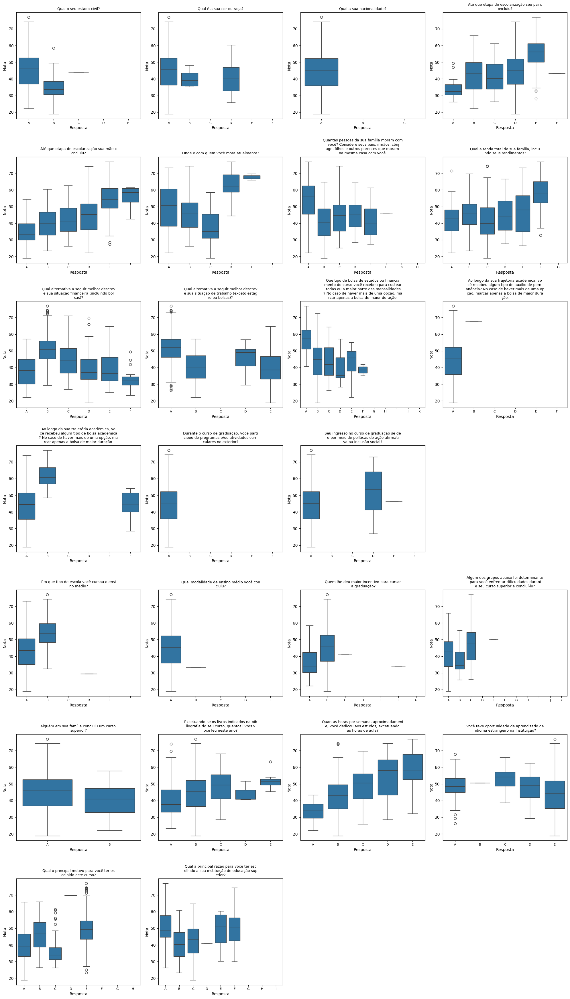

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

titulos_socioec = {
    'QE_I01': 'Qual o seu estado civil?',
    'QE_I02': 'Qual é a sua cor ou raça?',
    'QE_I03': 'Qual a sua nacionalidade?',
    'QE_I04': 'Até que etapa de escolarização seu pai concluiu?',
    'QE_I05': 'Até que etapa de escolarização sua mãe concluiu?',
    'QE_I06': 'Onde e com quem você mora atualmente?',
    'QE_I07': 'Quantas pessoas da sua família moram com você? Considere seus pais, irmãos, cônjuge, filhos e outros parentes que moram na mesma casa com você.',
    'QE_I08': 'Qual a renda total de sua família, incluindo seus rendimentos?',
    'QE_I09': 'Qual alternativa a seguir melhor descreve sua situação financeira (incluindo bolsas)?',
    'QE_I10': 'Qual alternativa a seguir melhor descreve sua situação de trabalho (exceto estágio ou bolsas)?',
    'QE_I11': 'Que tipo de bolsa de estudos ou financiamento do curso você recebeu para custear todas ou a maior parte das mensalidades? No caso de haver mais de uma opção, marcar apenas a bolsa de maior duração.',
    'QE_I12': 'Ao longo da sua trajetória acadêmica, você recebeu algum tipo de auxílio de permanência? No caso de haver mais de uma opção, marcar apenas a bolsa de maior duração.',
    'QE_I13': 'Ao longo da sua trajetória acadêmica, você recebeu algum tipo de bolsa acadêmica? No caso de haver mais de uma opção, marcar apenas a bolsa de maior duração.',
    'QE_I14': 'Durante o curso de graduação, você participou de programas e/ou atividades curriculares no exterior?',
    'QE_I15': 'Seu ingresso no curso de graduação se deu por meio de políticas de ação afirmativa ou inclusão social?',
    'QE_I16': 'Em que unidade da Federação você concluiu o ensino médio?',
    'QE_I17': 'Em que tipo de escola você cursou o ensino médio?',
    'QE_I18': 'Qual modalidade de ensino médio você concluiu?',
    'QE_I19': 'Quem lhe deu maior incentivo para cursar a graduação?',
    'QE_I20': 'Algum dos grupos abaixo foi determinante para você enfrentar dificuldades durante seu curso superior e concluí-lo?',
    'QE_I21': 'Alguém em sua família concluiu um curso superior?',
    'QE_I22': 'Excetuando-se os livros indicados na bibliografia do seu curso, quantos livros você leu neste ano?',
    'QE_I23': 'Quantas horas por semana, aproximadamente, você dedicou aos estudos, excetuando as horas de aula?',
    'QE_I24': 'Você teve oportunidade de aprendizado de idioma estrangeiro na Instituição?',
    'QE_I25': 'Qual o principal motivo para você ter escolhido este curso?',
    'QE_I26': 'Qual a principal razão para você ter escolhido a sua instituição de educação superior?'
}

# Lista das colunas de interesse
colunas_interesse = ['QE_I01', 'QE_I02', 'QE_I03', 'QE_I04', 'QE_I05', 'QE_I06', 'QE_I07', 'QE_I08', 'QE_I09',
                     'QE_I10', 'QE_I11', 'QE_I12', 'QE_I13', 'QE_I14', 'QE_I15', 'QE_I16', 'QE_I17', 'QE_I18',
                     'QE_I19', 'QE_I20', 'QE_I21', 'QE_I22', 'QE_I23', 'QE_I24', 'QE_I25', 'QE_I26']

# Garantir que a nota seja numérica
base_socioec["MEDIA_NOTA_ENADE"] = pd.to_numeric(base_socioec["MEDIA_NOTA_ENADE"], errors='coerce')

plt.figure(figsize=(20, 35))

# Definir categorias específicas para cada coluna (baseado nas perguntas)
categorias_por_coluna = {
    "QE_I01": ["A","B","C","D","E"],
    "QE_I02": ["A","B","C","D","E","F"],
    "QE_I03": ["A","B","C"],
    "QE_I04": ["A","B","C","D","E","F"],
    "QE_I05": ["A","B","C","D","E","F"],
    "QE_I06": ["A","B","C","D","E","F"],
    "QE_I07": ["A","B","C","D","E","F","G","H"],
    "QE_I08": ["A","B","C","D","E","F","G"],
    "QE_I09": ["A","B","C","D","E","F"],
    "QE_I10": ["A","B","C","D","E"],
    "QE_I11": ["A","B","C","D","E","F","G","H","I","J","K"],
    "QE_I12": ["A","B","C","D","E","F"],
    "QE_I13": ["A","B","C","D","E","F"],
    "QE_I14": ["A","B","C","D","E","F"],
    "QE_I15": ["A","B","C","D","E","F"],
    "QE_I16": ["AC","AL","AM","AP","BA","CE","DF","ES","GO","MA","MG","MS",
                         "MT","PA","PB","PE","PI","PR","RJ","RN","RO","RR","RS","SC",
                         "SE","SP","TO","Não se aplica"],
    "QE_I17": ["A","B","C","D","E","F"],
    "QE_I18": ["A","B","C","D","E"],
    "QE_I19": ["A","B","C","D","E","F","G"],
    "QE_I20": ["A","B","C","D","E","F","G","H","I","J","K"],
    "QE_I21": ["A","B"],
    "QE_I22": ["A","B","C","D","E"],
    "QE_I23": ["A","B","C","D","E"],
    "QE_I24": ["A","B","C","D","E"],
    "QE_I25": ["A","B","C","D","E","F","G","H"],
    "QE_I26": ["A","B","C","D","E","F","G","H","I"]
}
# Garantir que a nota seja numérica
base_socioec["MEDIA_NOTA_ENADE"] = pd.to_numeric(base_socioec["MEDIA_NOTA_ENADE"], errors='coerce')

plt.figure(figsize=(20, 35))

for i, coluna in enumerate(colunas_interesse, 1):
    if coluna == "QE_I16":
        continue  # pula esta coluna

    df_plot = base_socioec[[coluna, "MEDIA_NOTA_ENADE"]].dropna(subset=["MEDIA_NOTA_ENADE"])

    # Definir a coluna como categórica com todas as opções da pergunta
    df_plot[coluna] = pd.Categorical(df_plot[coluna],
                                     categories=categorias_por_coluna[coluna],
                                     ordered=True)

    plt.subplot(7, 4, i)
    sns.boxplot(
        data=df_plot,
        x=coluna,
        y="MEDIA_NOTA_ENADE",
        order=categorias_por_coluna[coluna]
    )

    # Título da pergunta
    titulo = titulos_socioec.get(coluna, coluna)
    if len(titulo) > 40:
        titulo = '\n'.join([titulo[j:j+40] for j in range(0, len(titulo), 40)])
    plt.title(titulo, fontsize=9)

    plt.xticks(fontsize=8)
    plt.xlabel("Resposta")
    plt.ylabel("Nota")

plt.tight_layout()
#plt.subplots_adjust(hspace=1.2)
plt.show()



In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib.backends.backend_pdf import PdfPages

# Garantir que a nota seja numérica
base_socioec["MEDIA_NOTA_ENADE"] = pd.to_numeric(base_socioec["MEDIA_NOTA_ENADE"], errors='coerce')

# Criar o PDF
with PdfPages("graficos_socioeconomicos.pdf") as pdf:
    plt.figure(figsize=(20, 35))

    for i, coluna in enumerate(colunas_interesse, 1):
        if coluna == "QE_I16":  # pular a QE_I16
            continue

        df_plot = base_socioec[[coluna, "MEDIA_NOTA_ENADE"]].dropna(subset=["MEDIA_NOTA_ENADE"])

        # Definir a coluna como categórica com todas as opções da pergunta
        df_plot[coluna] = pd.Categorical(df_plot[coluna],
                                         categories=categorias_por_coluna[coluna],
                                         ordered=True)

        plt.subplot(7, 4, i)
        sns.boxplot(
            data=df_plot,
            x=coluna,
            y="MEDIA_NOTA_ENADE",
            order=categorias_por_coluna[coluna]
        )

        # Título da pergunta
        titulo = titulos_socioec.get(coluna, coluna)
        if len(titulo) > 40:
            titulo = '\n'.join([titulo[j:j+40] for j in range(0, len(titulo), 40)])
        plt.title(titulo, fontsize=9)

        plt.xticks(fontsize=8)
        plt.xlabel("Resposta")
        plt.ylabel("Nota")

    plt.tight_layout()
    plt.subplots_adjust(hspace=1.2)

    # Salva a figura atual no PDF
    pdf.savefig()
    plt.close()


# **Estudo com dois grupos - Resultado Final**

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

base_infra = pd.read_csv("/content/drive/MyDrive/ETL RP II/etl_v3/infra_desempenho.csv", sep=";")
base_percepcao = pd.read_csv("/content/drive/MyDrive/ETL RP II/etl_v3/df_percepcao_desempenho.csv", sep=";")
base_notas = pd.read_csv("/content/drive/MyDrive/ETL RP II/etl_v3/df_media_desempenho.csv", sep=";")
base_socioec = pd.read_csv("/content/drive/MyDrive/ETL RP II/etl_v3/df_socioec_desempenho.csv", sep=";")

**Estudo das correlações na base de infra**

In [ ]:
# Inserir coluna referente à nota tratada.

'''
MEDIA_NOTA_ENADE

Estatística         Valor
Mínimo              18.90
1º Quartil (Q1)     35.95
Quantil 33%         39.65
Mediana             45.30
Quantil 66%         49.57
3º Quartil (Q3)     52.21
Máximo              76.99
-------------------------
Média               44.86
Moda                40.97
Desvio Padrão       10.18
.
'''

base_infra_tratada_3 = base_infra.copy()
base_infra_tratada_3["MEDIA_NOTA_ENADE_tratada"] = np.select([base_infra_tratada_3["MEDIA_NOTA_ENADE"] <= 38.55, base_infra_tratada_3["MEDIA_NOTA_ENADE"] <= 76.99]
                                                           , ["baixo", "alto"]
                                                           , default="erro")

base_infra_tratada_3["MEDIA_NOTA_ENADE_tratada_num"] = np.select([base_infra_tratada_3["MEDIA_NOTA_ENADE_tratada"] == "baixo", base_infra_tratada_3["MEDIA_NOTA_ENADE_tratada"] == "alto"]
                                                           , [1, 2]
                                                           , default=0)

In [ ]:
# Categóricas.

variaveis_categoricas = ['NO_CURSO', 'NO_MUNICIPIO', 'NO_MUNICIPIO_IES', 'NO_MESORREGIAO_IES', 'NO_MICRORREGIAO_IES', 'NO_MANTENEDORA', 'NO_BAIRRO_IES', 'IN_CAPITAL_IES', 'TP_ORGANIZACAO_ACADEMICA', 'TP_REDE', 'TP_CATEGORIA_ADMINISTRATIVA', 'IN_ACESSO_PORTAL_CAPES', 'IN_ASSINA_OUTRA_BASE', 'IN_REPOSITORIO_INSTITUCIONAL', 'IN_BUSCA_INTEGRADA', 'IN_SERVICO_INTERNET', 'IN_PARTICIPA_REDE_SOCIAL', 'IN_CATALOGO_ONLINE']

# Técnica utilizada: Cramér de V

from scipy.stats import chi2_contingency

for col in variaveis_categoricas:
  tabela = pd.crosstab(base_infra_tratada_3['MEDIA_NOTA_ENADE_tratada'], base_infra_tratada_3[col])
  chi2, p, dof, expected = chi2_contingency(tabela)

  n = tabela.sum().sum()  # total de observações
  r, k = tabela.shape     # linhas e colunas

  cramers_v = np.sqrt(chi2 / (n * (min(k-1, r-1))))
  if cramers_v > 0.25 and p < 0.05:
    print(f"{col} / Cramér's V: {cramers_v} / P-value: {p}")

# Devolve um valor entre 0 e 1.
  # 0 → nenhuma associação
  # 1 → associação perfeita

NO_CURSO / Cramér's V: 0.7569344783970057 / P-value: 1.81185181418196e-91
NO_MUNICIPIO / Cramér's V: 0.35835716822900854 / P-value: 0.003112475258514121
NO_MUNICIPIO_IES / Cramér's V: 0.3631092089030674 / P-value: 0.00011954366212811776
NO_MICRORREGIAO_IES / Cramér's V: 0.27818464213348687 / P-value: 0.0007583499896445369
NO_MANTENEDORA / Cramér's V: 0.4782549778123324 / P-value: 6.892824604214142e-11
NO_BAIRRO_IES / Cramér's V: 0.44254979567525693 / P-value: 5.639731614954725e-06
TP_CATEGORIA_ADMINISTRATIVA / Cramér's V: 0.2542559945895645 / P-value: 3.437317060178188e-13


/tmp/ipython-input-3173437871.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y="MEDIA_NOTA_ENADE", data=base_infra_tratada_3, palette=cores)
/tmp/ipython-input-3173437871.py:22: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


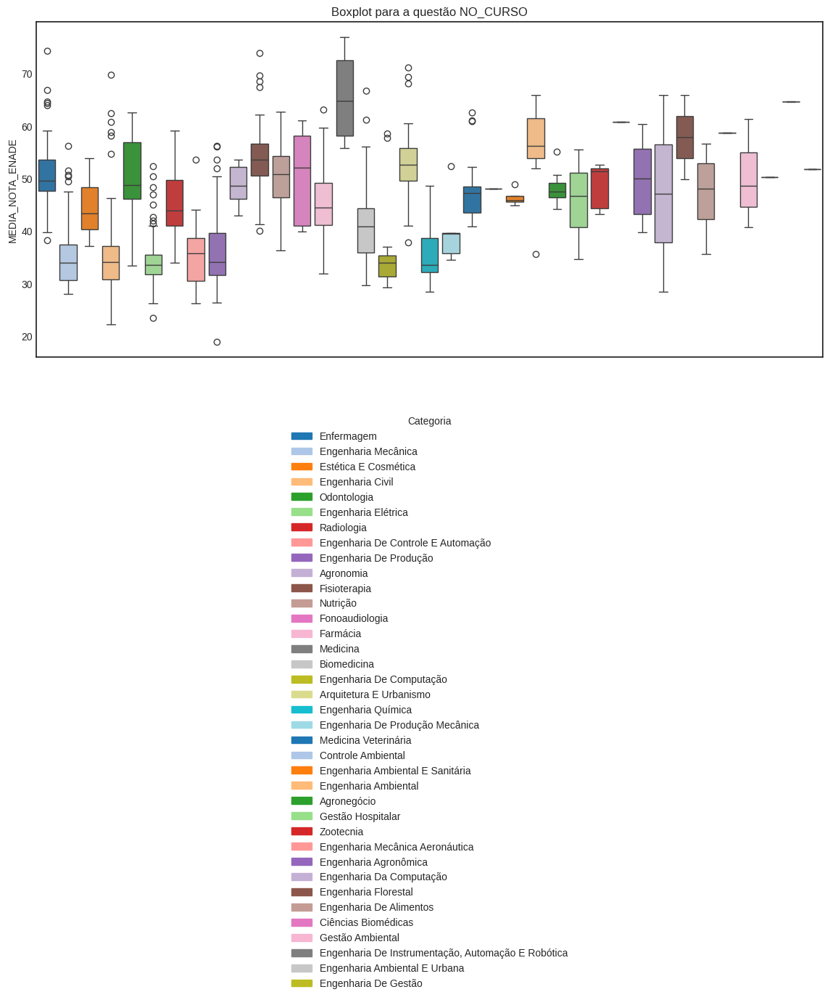

/tmp/ipython-input-3173437871.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y="MEDIA_NOTA_ENADE", data=base_infra_tratada_3, palette=cores)
/tmp/ipython-input-3173437871.py:22: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


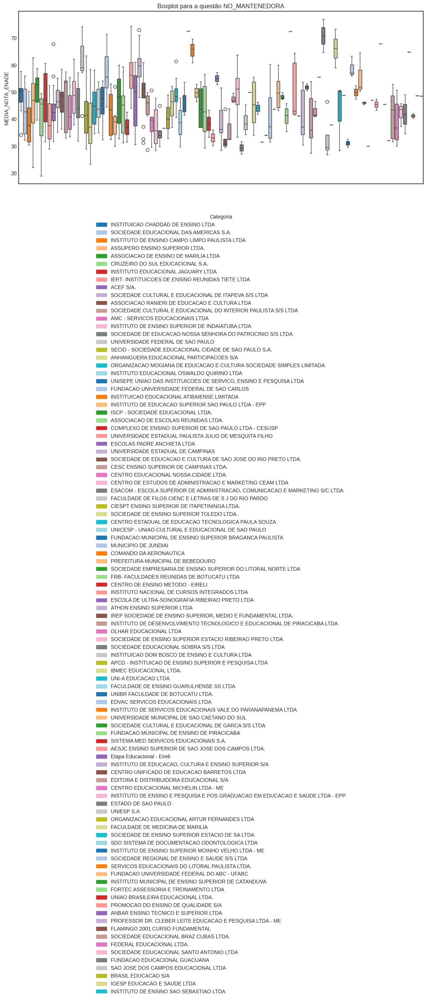

/tmp/ipython-input-3173437871.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y="MEDIA_NOTA_ENADE", data=base_infra_tratada_3, palette=cores)
/tmp/ipython-input-3173437871.py:22: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


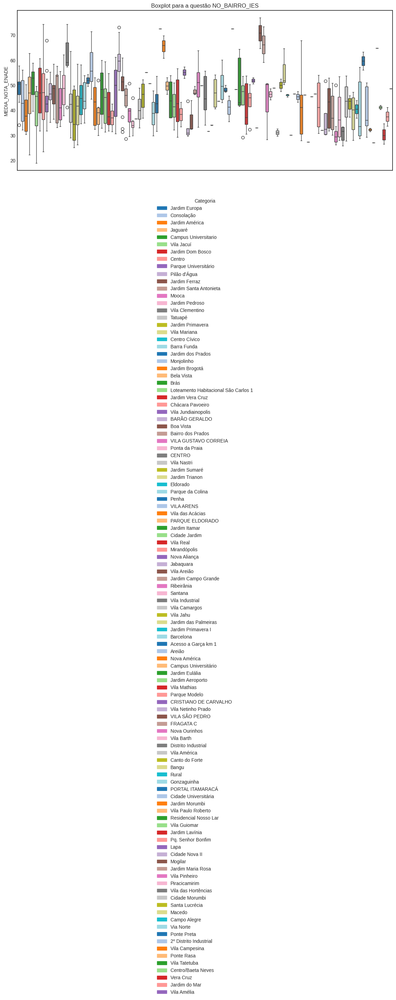

/tmp/ipython-input-3173437871.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y="MEDIA_NOTA_ENADE", data=base_infra_tratada_3, palette=cores)
/tmp/ipython-input-3173437871.py:22: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


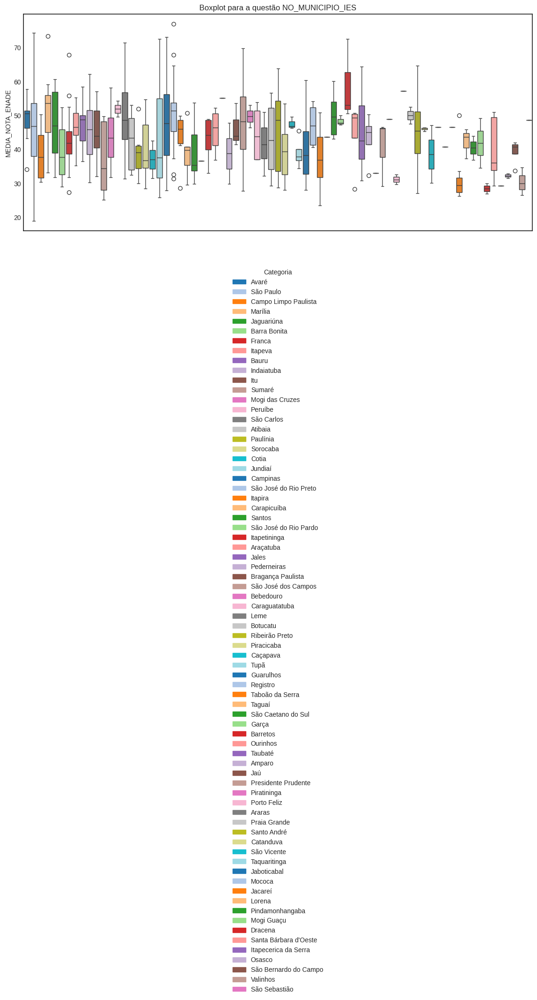

/tmp/ipython-input-3173437871.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y="MEDIA_NOTA_ENADE", data=base_infra_tratada_3, palette=cores)
/tmp/ipython-input-3173437871.py:22: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


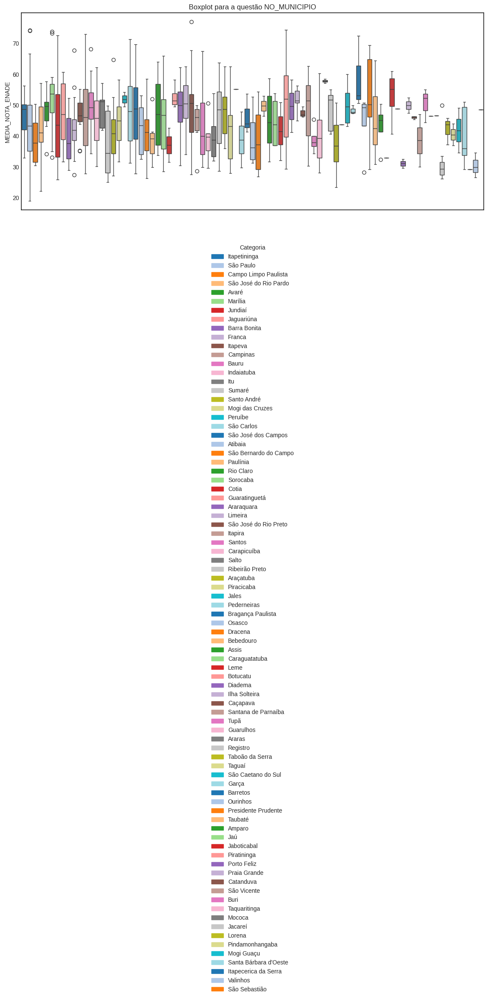

/tmp/ipython-input-3173437871.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y="MEDIA_NOTA_ENADE", data=base_infra_tratada_3, palette=cores)
/tmp/ipython-input-3173437871.py:22: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


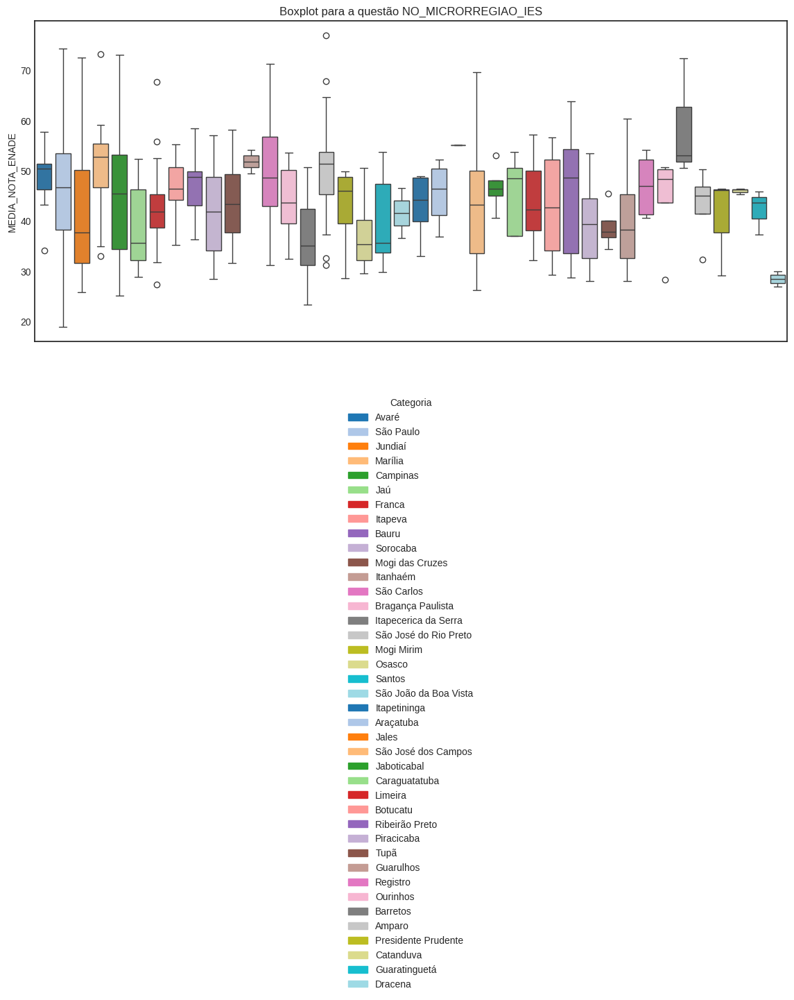

/tmp/ipython-input-3173437871.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=col, y="MEDIA_NOTA_ENADE", data=base_infra_tratada_3, palette=cores)


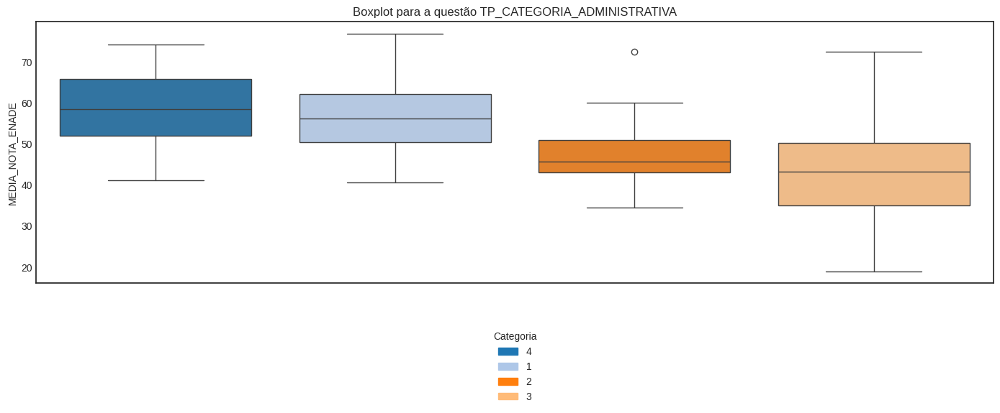

In [ ]:
import matplotlib.patches as mpatches

variaveis_relevantes = ['NO_CURSO', 'NO_MANTENEDORA', 'NO_BAIRRO_IES', 'NO_MUNICIPIO_IES', 'NO_MUNICIPIO', 'NO_MICRORREGIAO_IES', 'TP_CATEGORIA_ADMINISTRATIVA']

for col in variaveis_relevantes:
  plt.figure(figsize=(14,6))

  categorias = base_infra_tratada_3[col].unique()

  cores = sns.color_palette("tab20", len(categorias))

  sns.boxplot(x=col, y="MEDIA_NOTA_ENADE", data=base_infra_tratada_3, palette=cores)

  plt.xlabel('')
  plt.xticks([])
  plt.title(f"Boxplot para a questão {col}")

  patches = [mpatches.Patch(color=cores[i], label=categorias[i]) for i in range(len(categorias))]

  plt.legend(handles=patches, title='Categoria', loc='upper center', bbox_to_anchor=(0.5, -0.15))

  plt.tight_layout()
  plt.show()

In [ ]:
variaveis_relevantes = ['NO_CURSO', 'NO_MANTENEDORA', 'NO_BAIRRO_IES', 'NO_MUNICIPIO_IES', 'NO_MUNICIPIO', 'NO_MICRORREGIAO_IES', 'TP_CATEGORIA_ADMINISTRATIVA']

for col in variaveis_relevantes:
  medias = base_infra_tratada_3.groupby(col)['MEDIA_NOTA_ENADE'].mean()
  modas = base_infra_tratada_3.groupby(col)['MEDIA_NOTA_ENADE_tratada'].agg(lambda x: x.mode().iloc[0])

  resumo = pd.DataFrame({
        'Media': medias,
        'Moda': modas
    }).reset_index()

  pd.set_option('display.max_rows', None)
  pd.set_option('display.max_columns', None)

  print(f"\nResumo para {col}:\n")
  print(resumo)


Resumo para NO_CURSO:

                                             NO_CURSO      Media   Moda
0                                         Agronegócio  48.253750   alto
1                                           Agronomia  48.785000   alto
2                             Arquitetura E Urbanismo  52.520758   alto
3                                         Biomedicina  41.165937   alto
4                                 Ciências Biomédicas  58.690000   alto
5                                  Controle Ambiental  48.050000   alto
6                                          Enfermagem  50.820814   alto
7                               Engenharia Agronômica  49.556667   alto
8                                Engenharia Ambiental  55.859000   alto
9                    Engenharia Ambiental E Sanitária  46.362500   alto
10                      Engenharia Ambiental E Urbana  64.670000   alto
11                                   Engenharia Civil  35.611290  baixo
12                           Engenharia 

In [ ]:
# Quantitativas.
variaveis_quant = ['QT_TEC_TOTAL', 'QT_TEC_FUNDAMENTAL_INCOMP_FEM', 'QT_TEC_FUNDAMENTAL_INCOMP_MASC', 'QT_TEC_FUNDAMENTAL_COMP_FEM', 'QT_TEC_FUNDAMENTAL_COMP_MASC', 'QT_TEC_MEDIO_FEM', 'QT_TEC_MEDIO_MASC', 'QT_TEC_SUPERIOR_FEM', 'QT_TEC_SUPERIOR_MASC', 'QT_TEC_ESPECIALIZACAO_FEM', 'QT_TEC_ESPECIALIZACAO_MASC', 'QT_TEC_MESTRADO_FEM', 'QT_TEC_MESTRADO_MASC', 'QT_TEC_DOUTORADO_FEM', 'QT_TEC_DOUTORADO_MASC', 'QT_PERIODICO_ELETRONICO', 'QT_LIVRO_ELETRONICO', 'QT_DOC_TOTAL', 'QT_DOC_EXE', 'QT_DOC_EX_FEMI', 'QT_DOC_EX_MASC', 'QT_DOC_EX_SEM_GRAD', 'QT_DOC_EX_GRAD', 'QT_DOC_EX_ESP', 'QT_DOC_EX_MEST', 'QT_DOC_EX_DOUT', 'QT_DOC_EX_INT', 'QT_DOC_EX_INT_DE', 'QT_DOC_EX_INT_SEM_DE', 'QT_DOC_EX_PARC', 'QT_DOC_EX_HOR', 'QT_DOC_EX_0_29', 'QT_DOC_EX_30_34', 'QT_DOC_EX_35_39', 'QT_DOC_EX_40_44', 'QT_DOC_EX_45_49', 'QT_DOC_EX_50_54', 'QT_DOC_EX_55_59', 'QT_DOC_EX_60_MAIS', 'QT_DOC_EX_BRANCA', 'QT_DOC_EX_PRETA', 'QT_DOC_EX_PARDA', 'QT_DOC_EX_AMARELA', 'QT_DOC_EX_INDIGENA', 'QT_DOC_EX_COR_ND', 'QT_DOC_EX_BRA', 'QT_DOC_EX_EST', 'QT_DOC_EX_COM_DEFICIENCIA']

# Spearman
from scipy.stats import spearmanr

for col in variaveis_quant:
  coef, p_value = spearmanr(base_infra_tratada_3[col], base_infra_tratada_3["MEDIA_NOTA_ENADE_tratada"])

  if abs(coef) > 0.2 and p_value < 0.05:
    print(f"{col} / Coeficiente de Spearman: {coef} / p-value: {p_value}")

QT_TEC_FUNDAMENTAL_COMP_MASC / Coeficiente de Spearman: -0.2082803662145301 / p-value: 1.0111587948387232e-10
QT_TEC_SUPERIOR_MASC / Coeficiente de Spearman: -0.2023089482283367 / p-value: 3.475630706167559e-10
QT_DOC_EX_GRAD / Coeficiente de Spearman: -0.20661282981729787 / p-value: 1.4328371163507652e-10
QT_DOC_EX_INT / Coeficiente de Spearman: -0.20179768167969386 / p-value: 3.85646167384105e-10
QT_DOC_EX_EST / Coeficiente de Spearman: -0.2171352050552703 / p-value: 1.5120479449270377e-11


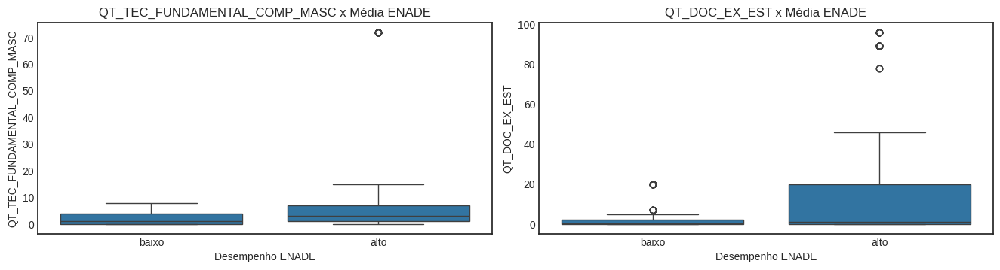

In [ ]:
# Nenhuma variável numérica possui o coeficiente maior que as 7 variáveis categóricas mais relevantes
# Moda da nota para cada categoria das variáveis relevantes.
variaveis = ['QT_TEC_FUNDAMENTAL_COMP_MASC','QT_DOC_EX_EST']

plt.style.use('seaborn-v0_8-white')

n_cols = 3
n_rows = 6
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20,20))
axes = axes.flatten()

for i, col in enumerate(variaveis):
    ax = axes[i]
    sns.boxplot(x='MEDIA_NOTA_ENADE_tratada', y=col, data=base_infra_tratada_3, ax=ax, order=["baixo", "alto"])
    ax.set_title(f'{col} x Média ENADE')
    ax.set_xlabel('Desempenho ENADE')
    ax.set_ylabel(col)

# Remove eixos extras, caso existam
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [ ]:
base_infra_variaveis_principais_3 = base_infra_tratada_3[['NO_CURSO', 'NO_MANTENEDORA', 'NO_BAIRRO_IES', 'NO_MUNICIPIO_IES', 'NO_MUNICIPIO', 'NO_MICRORREGIAO_IES', 'TP_CATEGORIA_ADMINISTRATIVA', 'MEDIA_NOTA_ENADE', 'MEDIA_NOTA_ENADE_tratada']]

In [ ]:
import os

caminho_pasta = "/content/drive/MyDrive/ETL RP II/etl_v5/"
caminho_arquivo = os.path.join(caminho_pasta, "base_infra_variaveis_principais_3.csv")

# Criar a pasta, se não existir
os.makedirs(caminho_pasta, exist_ok=True)

# Agora salvar
base_infra_variaveis_principais_3.to_csv(
    caminho_arquivo,
    sep=";",
    index=False,
    encoding="utf-8"
)

print("Arquivo salvo em:", caminho_arquivo)

Arquivo salvo em: /content/drive/MyDrive/ETL RP II/etl_v5/base_infra_variaveis_principais_3.csv


#### Adicionando a chave e salvando o conjunto para que seja possível diferenciar cada um dos registros:

In [ ]:
# 1. Cria uma cópia só com as colunas principais
base_infra_variaveis_principais_com_chave_3 = base_infra_tratada_3[[
    'NO_CURSO',
    'NO_MANTENEDORA',
    'NO_BAIRRO_IES',
    'NO_MUNICIPIO_IES',
    'NO_MUNICIPIO',
    'NO_MICRORREGIAO_IES',
    'TP_CATEGORIA_ADMINISTRATIVA',
    'MEDIA_NOTA_ENADE',
    'MEDIA_NOTA_ENADE_tratada',
    'NO_IES',
    'CO_IES'
]].copy()

# 2. Cria a chave concatenada
base_infra_variaveis_principais_com_chave_3['chave'] = (
    base_infra_variaveis_principais_com_chave_3['NO_IES'].astype(str) + "_" +
    base_infra_variaveis_principais_com_chave_3['NO_CURSO'].astype(str) + "_" +
    base_infra_variaveis_principais_com_chave_3['NO_MUNICIPIO'].astype(str) + "_" +
    base_infra_variaveis_principais_com_chave_3['CO_IES'].astype(str)
)

# 3. Seleciona apenas as variáveis principais + chave
base_infra_variaveis_principais_com_chave_3 = base_infra_variaveis_principais_com_chave_3[[
    'chave',
    'NO_CURSO',
    'NO_MANTENEDORA',
    'NO_BAIRRO_IES',
    'NO_MUNICIPIO_IES',
    'NO_MUNICIPIO',
    'NO_MICRORREGIAO_IES',
    'TP_CATEGORIA_ADMINISTRATIVA',
    'MEDIA_NOTA_ENADE',
    'MEDIA_NOTA_ENADE_tratada'
]]


Salvando a base, mas desta vez com a chave

In [ ]:
import os

caminho_pasta = "/content/drive/MyDrive/ETL RP II/etl_v5/"
caminho_arquivo = os.path.join(caminho_pasta, "base_infra_variaveis_principais_com_chave_3.csv")

# Criar a pasta, se não existir
os.makedirs(caminho_pasta, exist_ok=True)

# Agora salvar
base_infra_variaveis_principais_com_chave_3.to_csv(
    caminho_arquivo,
    sep=";",
    index=False,
    encoding="utf-8"
)

print("Arquivo salvo em:", caminho_arquivo)

Arquivo salvo em: /content/drive/MyDrive/ETL RP II/etl_v5/base_infra_variaveis_principais_com_chave_3.csv


**Estudo da correlação na base de percepção**

In [ ]:
dic_questoes_percepcao = {
  'QE_I27': 'As disciplinas cursadas contribuíram para sua formação integral, como cidadão e profissional',
  'QE_I28': 'Os conteúdos abordados nas disciplinas do curso favoreceram sua atuação em estágios ou em atividades de iniciação profissional',
  'QE_I29': 'As metodologias de ensino utilizadas no curso desafiaram você a aprofundar conhecimentos e desenvolver competências reflexivas e críticas',
  'QE_I30': 'O curso propiciou experiências de aprendizagem inovadoras',
  'QE_I31': 'O curso contribuiu para o desenvolvimento da sua consciência ética para o exercício profissional',
  'QE_I32': 'No curso você teve oportunidade de aprender a trabalhar em equipe',
  'QE_I33': 'O curso possibilitou aumentar sua capacidade de reflexão e argumentação',
  'QE_I34': 'O curso promoveu o desenvolvimento da sua capacidade de pensar criticamente, analisar e refletir sobre soluções para problemas da sociedade',
  'QE_I35': 'O curso contribuiu para você ampliar sua capacidade de comunicação nas formas oral e escrita',
  'QE_I36': 'O curso contribuiu para o desenvolvimento da sua capacidade de aprender e atualizar-se permanentemente',
  'QE_I37': 'As relações professor-aluno ao longo do curso estimularam você a estudar e aprender',
  'QE_I38': 'Os planos de ensino apresentados pelos professores contribuíram para o desenvolvimento das atividades acadêmicas e para seus estudos',
  'QE_I39': 'As referências bibliográficas indicadas pelos professores nos planos de ensino contribuíram para seus estudos e aprendizagens',
  'QE_I40': 'Foram oferecidas oportunidades para os estudantes superarem dificuldades relacionadas ao processo de formação',
  'QE_I41': 'A coordenação do curso esteve disponível para orientação acadêmica dos estudantes',
  'QE_I42': 'O curso exigiu de você organização e dedicação frequente aos estudos',
  'QE_I43': 'Foram oferecidas oportunidades para os estudantes participarem de programas, projetos ou atividades de extensão universitária',
  'QE_I44': 'Foram oferecidas oportunidades para os estudantes participarem de projetos de iniciação científica e de atividades que estimularam a investigação acadêmica',
  'QE_I45': 'O curso ofereceu condições para os estudantes participarem de eventos internos e/ou externos à instituição',
  'QE_I46': 'A instituição ofereceu oportunidades para os estudantes atuarem como representantes em órgãos colegiados',
  'QE_I47': 'O curso favoreceu a articulação do conhecimento teórico com atividades práticas',
  'QE_I48': 'As atividades práticas foram suficientes para relacionar os conteúdos do curso com a prática, contribuindo para sua formação profissional',
  'QE_I49': 'O curso propiciou acesso a conhecimentos atualizados e/ou contemporâneos em sua área de formação',
  'QE_I50': 'O estágio supervisionado proporcionou experiências diversificadas para a sua formação',
  'QE_I51': 'As atividades realizadas durante seu trabalho de conclusão de curso contribuíram para qualificar sua formação profissional',
  'QE_I52': 'Foram oferecidas oportunidades para os estudantes realizarem intercâmbios e/ou estágios no país',
  'QE_I53': 'Foram oferecidas oportunidades para os estudantes realizarem intercâmbios e/ou estágios fora do país',
  'QE_I54': 'Os estudantes participaram de avaliações periódicas do curso (disciplinas, atuação dos professores, infraestrutura)',
  'QE_I55': 'As avaliações de aprendizagem realizadas durante o curso foram compatíveis com os conteúdos ou temas trabalhados pelos professores',
  'QE_I56': 'Os professores apresentaram disponibilidade para atender os estudantes fora do horário das aulas',
  'QE_I57': 'Os professores demonstraram domínio dos conteúdos abordados nas disciplinas',
  'QE_I58': 'Os professores utilizaram tecnologias da informação e comunicação (TICs) como estratégia de ensino (projetor, multimídia, laboratório de informática, ambiente virtual de aprendizagem)',
  'QE_I59': 'A instituição dispôs de quantidade suficiente de funcionários para o apoio administrativo e acadêmico',
  'QE_I60': 'O curso disponibilizou monitores ou tutores para auxiliar os estudantes',
  'QE_I61': 'As condições de infraestrutura das salas de aula foram adequadas',
  'QE_I62': 'Os equipamentos e materiais disponíveis para as aulas práticas foram adequados para a quantidade de estudantes',
  'QE_I63': 'Os ambientes e equipamentos destinados às aulas práticas foram adequados ao curso',
  'QE_I64': 'A biblioteca dispôs das referências bibliográficas que os estudantes necessitaram',
  'QE_I65': 'A instituição contou com biblioteca virtual ou conferiu acesso a obras disponíveis em acervos virtuais',
  'QE_I66': 'As atividades acadêmicas desenvolvidas dentro e fora da sala de aula possibilitaram reflexão, convivência e respeito à diversidade',
  'QE_I67': 'A instituição promoveu atividades de cultura, de lazer e de interação social',
  'QE_I68': 'A instituição dispôs de refeitório, cantina e banheiros em condições adequadas que atenderam as necessidades dos seus usuários'
}


In [ ]:
# Inserir coluna referente à nota tratada.

'''
MEDIA_NOTA_ENADE

Estatística         Valor
Mínimo              18.90
1º Quartil (Q1)     35.95
Quantil 33%         39.65
Mediana             45.30
Quantil 66%         49.57
3º Quartil (Q3)     52.21
Máximo              76.99
-------------------------
Média               44.86
Moda                40.97
Desvio Padrão       10.18
.
'''

base_percepcao_tratada_3 = base_percepcao.copy()
base_percepcao_tratada_3["MEDIA_NOTA_ENADE_tratada"] = np.select([base_percepcao_tratada_3["MEDIA_NOTA_ENADE"] <= 38.55, base_percepcao_tratada_3["MEDIA_NOTA_ENADE"] <= 76.99]
                                                           , ["baixo", "alto"]
                                                           , default="erro")

base_percepcao_tratada_3["MEDIA_NOTA_ENADE_tratada_num"] = np.select([base_percepcao_tratada_3["MEDIA_NOTA_ENADE_tratada"] == "baixo", base_percepcao_tratada_3["MEDIA_NOTA_ENADE_tratada"] == "alto"]
                                                           , [1, 2]
                                                           , default=0)


In [ ]:
# Os valores 7 (não sei responder) e 8 (não se aplica) quebram a ordinalidade da variável → desconsiderá-los no cálculo da correlação.

variaveis = ['QE_I27', 'QE_I28', 'QE_I29', 'QE_I30', 'QE_I31', 'QE_I32', 'QE_I33', 'QE_I34', 'QE_I35', 'QE_I36', 'QE_I37', 'QE_I38', 'QE_I39', 'QE_I40', 'QE_I41', 'QE_I42', 'QE_I43', 'QE_I44', 'QE_I45', 'QE_I46', 'QE_I47', 'QE_I48', 'QE_I49', 'QE_I50', 'QE_I51', 'QE_I52', 'QE_I53', 'QE_I54', 'QE_I55', 'QE_I56', 'QE_I57', 'QE_I58', 'QE_I59', 'QE_I60', 'QE_I61', 'QE_I62', 'QE_I63', 'QE_I64', 'QE_I65', 'QE_I66', 'QE_I67', 'QE_I68']

In [ ]:
for col in variaveis:
  tamanho_inicial = len(base_percepcao_tratada_3)

  base_percepcao_tratada_3 = base_percepcao_tratada_3[~base_percepcao_tratada_3[col].isin([7, 8])]
  base_percepcao_tratada_3 = base_percepcao_tratada_3[base_percepcao_tratada_3[col].notna()]

  tamanho_agora = len(base_percepcao_tratada_3)

In [ ]:
for col in variaveis:
  valores_unicos = base_percepcao_tratada_3[col].unique()
  print(f"{col}: {valores_unicos}")

QE_I27: [5. 2. 1. 4. 3. 6.]
QE_I28: [5. 4. 3. 1. 2. 6.]
QE_I29: [5. 2. 1. 3. 4. 6.]
QE_I30: [5. 2. 1. 3. 4. 6.]
QE_I31: [5. 2. 1. 4. 3. 6.]
QE_I32: [5. 2. 1. 3. 4. 6.]
QE_I33: [5. 2. 1. 3. 4. 6.]
QE_I34: [5. 6. 2. 1. 4. 3.]
QE_I35: [5. 6. 1. 2. 4. 3.]
QE_I36: [5. 6. 2. 1. 3. 4.]
QE_I37: [1. 5. 3. 4. 6. 2.]
QE_I38: [5. 6. 2. 1. 4. 3.]
QE_I39: [5. 2. 1. 3. 4. 6.]
QE_I40: [4. 1. 3. 2. 5. 6.]
QE_I41: [5. 6. 2. 1. 3. 4.]
QE_I42: [5. 6. 4. 2. 1. 3.]
QE_I43: [5. 6. 1. 2. 3. 4.]
QE_I44: [4. 6. 1. 3. 2. 5.]
QE_I45: [5. 6. 2. 1. 4. 3.]
QE_I46: [3. 5. 1. 2. 4. 6.]
QE_I47: [5. 6. 1. 2. 3. 4.]
QE_I48: [5. 1. 3. 2. 4. 6.]
QE_I49: [5. 6. 2. 3. 1. 4.]
QE_I50: [5. 6. 3. 1. 4. 2.]
QE_I51: [5. 6. 2. 1. 4. 3.]
QE_I52: [2. 6. 1. 4. 5. 3.]
QE_I53: [1. 6. 2. 5. 4. 3.]
QE_I54: [5. 6. 1. 2. 3. 4.]
QE_I55: [5. 6. 2. 3. 1. 4.]
QE_I56: [4. 2. 1. 3. 6. 5.]
QE_I57: [5. 6. 3. 1. 2. 4.]
QE_I58: [5. 2. 1. 3. 4. 6.]
QE_I59: [5. 6. 1. 3. 2. 4.]
QE_I60: [5. 4. 1. 2. 6. 3.]
QE_I61: [5. 6. 1. 2. 3. 4.]
QE_I62: [5. 6. 2. 1.

In [ ]:
# Técnica utilizada: Cramér de V

# Spearman não atende a premissas:
  # Linearidade
  # Monotonicidade (à medida que uma cresce, a outra sempre cresce)

In [ ]:
# Cramér de V
from scipy.stats import chi2_contingency

for col in variaveis:
  tabela = pd.crosstab(base_percepcao_tratada_3['MEDIA_NOTA_ENADE_tratada'], base_percepcao_tratada_3[col])
#  print(tabela)
  chi2, p, dof, expected = chi2_contingency(tabela)

  n = tabela.sum().sum()  # total de observações
  r, k = tabela.shape     # linhas e colunas

  cramers_v = np.sqrt(chi2 / (n * (min(k-1, r-1))))
  if cramers_v > 0.1565 and p < 0.05:
    print(f"{col} / Cramér's V: {cramers_v} / P-value: {p}")

# Devolve um valor entre 0 e 1.
  # 0 → nenhuma associação
  # 1 → associação perfeita

QE_I40 / Cramér's V: 0.16810280368460875 / P-value: 7.205975671697898e-05
QE_I51 / Cramér's V: 0.17795245982464072 / P-value: 1.711060738246497e-05
QE_I54 / Cramér's V: 0.21666302853307748 / P-value: 2.33201124706142e-08
QE_I59 / Cramér's V: 0.15696127024413015 / P-value: 0.0003252065392871052
QE_I64 / Cramér's V: 0.16136031449648383 / P-value: 0.0001821204868381853
QE_I65 / Cramér's V: 0.17171704368992535 / P-value: 4.300751032938256e-05
QE_I68 / Cramér's V: 0.16662052209722522 / P-value: 8.870487817169648e-05


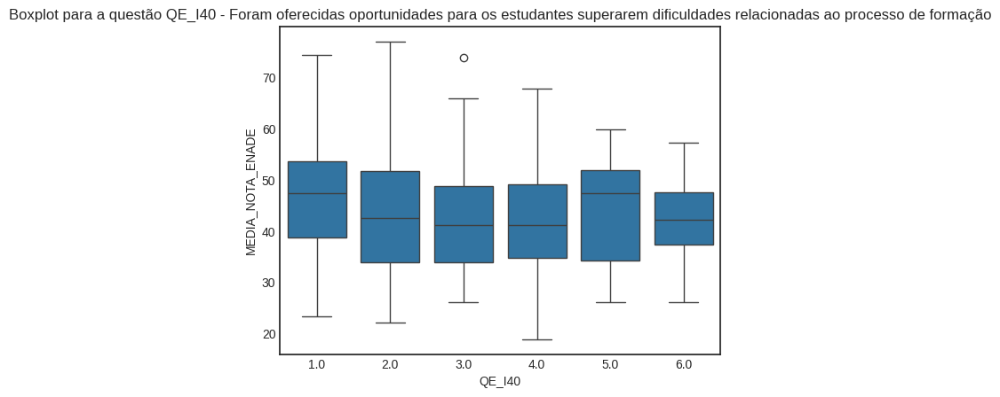

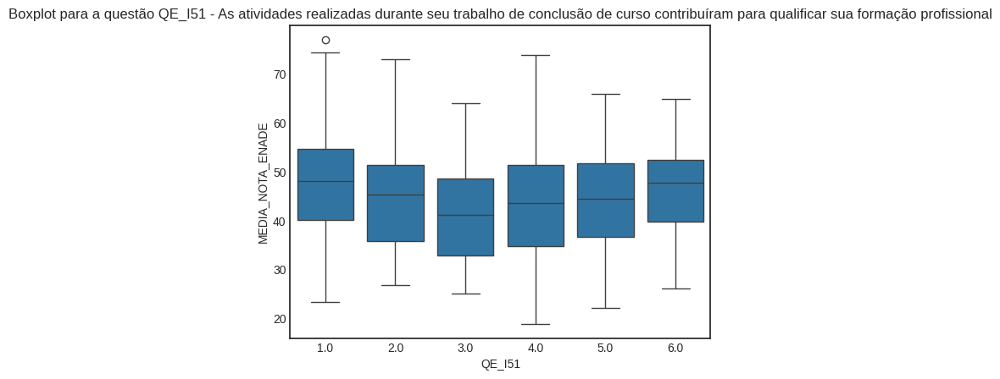

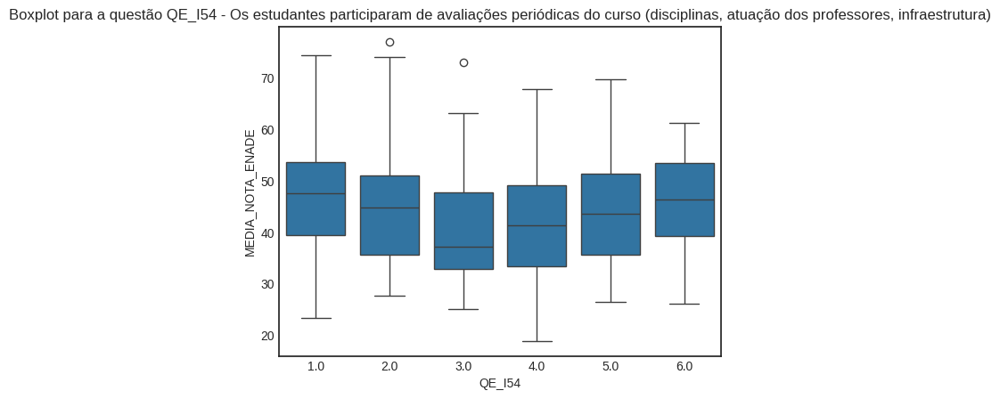

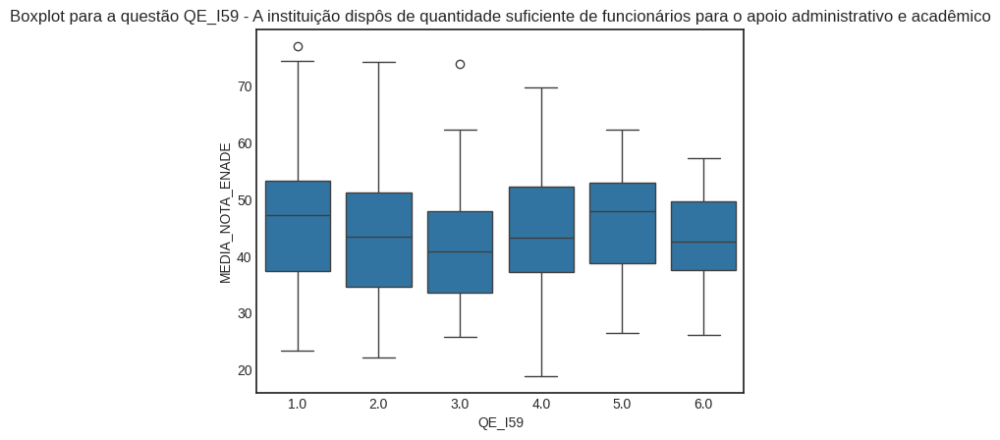

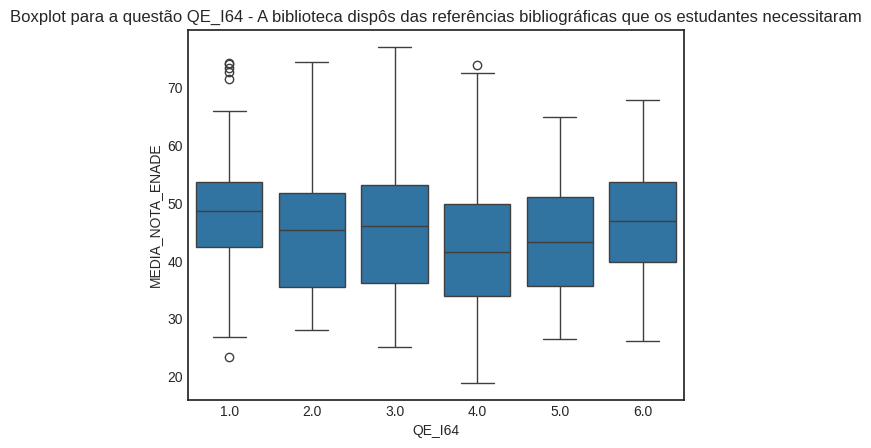

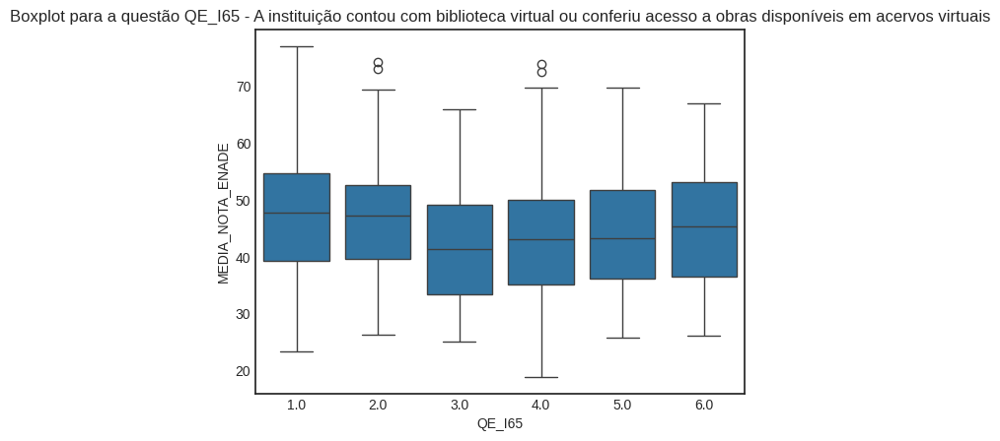

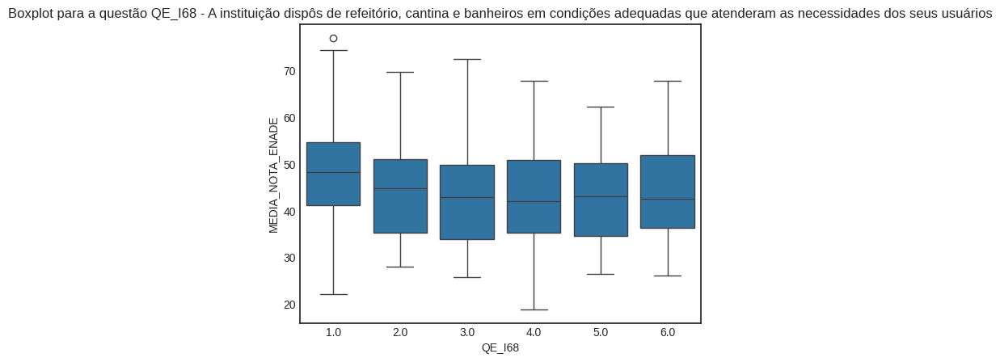

In [ ]:
#import matplotlib.pyplot as plt

variaveis_relevantes = ['QE_I40', 'QE_I51', 'QE_I54', 'QE_I59', 'QE_I64', 'QE_I65', 'QE_I68']

for col in variaveis_relevantes:
  sns.boxplot(x=col, y="MEDIA_NOTA_ENADE", data=base_percepcao_tratada_3)
  plt.title(f"Boxplot para a questão {col} - {dic_questoes_percepcao[col]}")
  plt.show()

In [ ]:
base_percepcao_variaveis_principais_3 = base_percepcao_tratada_3[['QE_I40', 'QE_I51', 'QE_I54', 'QE_I59', 'QE_I64', 'QE_I65', 'QE_I68', 'MEDIA_NOTA_ENADE', 'MEDIA_NOTA_ENADE_tratada']]

In [ ]:
import os

caminho_pasta = "/content/drive/MyDrive/ETL RP II/etl_v5/"
caminho_arquivo = os.path.join(caminho_pasta, "base_percepcao_variaveis_principais_3.csv")

# Agora salvar
base_percepcao_variaveis_principais_3.to_csv(
    caminho_arquivo,
    sep=";",
    index=False,
    encoding="utf-8"
)

print("Arquivo salvo em:", caminho_arquivo)

Arquivo salvo em: /content/drive/MyDrive/ETL RP II/etl_v5/base_percepcao_variaveis_principais_3.csv


#### Adicionando a chave e salvando o conjunto para que seja possível diferenciar cada um dos registros:

In [ ]:
# 1. Cria uma cópia só com as colunas principais + colunas necessárias para chave
base_percepcao_variaveis_principais_com_chave_3 = base_percepcao_tratada_3[[
    'QE_I40',
    'QE_I51',
    'QE_I54',
    'QE_I59',
    'QE_I64',
    'QE_I65',
    'QE_I68',
    'MEDIA_NOTA_ENADE',
    'MEDIA_NOTA_ENADE_tratada',
    'NO_IES',
    'NO_CURSO',
    'NO_MUNICIPIO',
    'CO_IES'
]].copy()

# 2. Cria a chave concatenada
base_percepcao_variaveis_principais_com_chave_3['chave'] = (
    base_percepcao_variaveis_principais_com_chave_3['NO_IES'].astype(str) + "_" +
    base_percepcao_variaveis_principais_com_chave_3['NO_CURSO'].astype(str) + "_" +
    base_percepcao_variaveis_principais_com_chave_3['NO_MUNICIPIO'].astype(str) + "_" +
    base_percepcao_variaveis_principais_com_chave_3['CO_IES'].astype(str)
)

# 3. Seleciona apenas as variáveis principais + chave
base_percepcao_variaveis_principais_com_chave_3 = base_percepcao_variaveis_principais_com_chave_3[[
    'chave',
    'QE_I40',
    'QE_I51',
    'QE_I54',
    'QE_I59',
    'QE_I64',
    'QE_I65',
    'QE_I68',
    'MEDIA_NOTA_ENADE',
    'MEDIA_NOTA_ENADE_tratada'
]]

In [ ]:
# 4. Salvar em CSV
import os

caminho_pasta = "/content/drive/MyDrive/ETL RP II/etl_v5/"
caminho_arquivo = os.path.join(caminho_pasta, "base_percepcao_variaveis_principais_com_chave_3.csv")

# Criar a pasta, se não existir
os.makedirs(caminho_pasta, exist_ok=True)

# Agora salvar
base_percepcao_variaveis_principais_com_chave_3.to_csv(
    caminho_arquivo,
    sep=";",
    index=False,
    encoding="utf-8"
)

print("Arquivo salvo em:", caminho_arquivo)

Arquivo salvo em: /content/drive/MyDrive/ETL RP II/etl_v5/base_percepcao_variaveis_principais_com_chave_3.csv


**Estudo da correlação na base de características socioeconômicas**

In [ ]:
dic_questoes_socioec = {
  'QE_I01': 'Qual o seu estado civil?',
  'QE_I02': 'Qual é a sua cor ou raça?',
  'QE_I03': 'Qual a sua nacionalidade?',
  'QE_I06': 'Onde e com quem você mora atualmente?',
  'QE_I09': 'Qual alternativa a seguir melhor descreve sua situação financeira (incluindo bolsas)?',
  'QE_I10': 'Qual alternativa a seguir melhor descreve sua situação de trabalho (exceto estágio ou bolsas)?',
  'QE_I11': 'Que tipo de bolsa de estudos ou financiamento do curso você recebeu para custear todas ou a maior parte das mensalidades?',
  'QE_I12': 'Ao longo da sua trajetória acadêmica, você recebeu algum tipo de auxílio de permanência?',
  'QE_I13': 'Ao longo da sua trajetória acadêmica, você recebeu algum tipo de bolsa acadêmica?',
  'QE_I14': 'Durante o curso de graduação, você participou de programas e/ou atividades curriculares no exterior?',
  'QE_I15': 'Seu ingresso no curso de graduação se deu por meio de políticas de ação afirmativa ou inclusão social?',
  'QE_I16': 'Em que unidade da Federação você concluiu o ensino médio?',
  'QE_I17': 'Em que tipo de escola você cursou o ensino médio?',
  'QE_I18': 'Qual modalidade de ensino médio você concluiu?',
  'QE_I19': 'Quem lhe deu maior incentivo para cursar a graduação?',
  'QE_I20': 'Algum dos grupos abaixo foi determinante para você enfrentar dificuldades durante seu curso superior e concluí-lo?',
  'QE_I21': 'Alguém em sua família concluiu um curso superior?',
  'QE_I24': 'Você teve oportunidade de aprendizado de idioma estrangeiro na Instituição?',
  'QE_I25': 'Qual o principal motivo para você ter escolhido este curso?',
  'QE_I26': 'Qual a principal razão para você ter escolhido a sua instituição de educação superior?',
  'QE_I04': 'Até que etapa de escolarização seu pai concluiu?',
  'QE_I05': 'Até que etapa de escolarização sua mãe concluiu?',
  'QE_I07': 'Quantas pessoas da sua família moram com você?',
  'QE_I08': 'Qual a renda total de sua família, incluindo seus rendimentos?',
  'QE_I22': 'Excetuando-se os livros indicados na bibliografia do seu curso, quantos livros você leu neste ano?',
  'QE_I23': 'Quantas horas por semana, aproximadamente, você dedicou aos estudos, excetuando as horas de aula?'
}

In [ ]:
# Inserir coluna referente à nota tratada.

'''
MEDIA_NOTA_ENADE

Estatística         Valor
Mínimo              18.90
1º Quartil (Q1)     35.95
Quantil 33%         39.65
Mediana             45.30
Quantil 66%         49.57
3º Quartil (Q3)     52.21
Máximo              76.99
-------------------------
Média               44.86
Moda                40.97
Desvio Padrão       10.18
.
'''

base_socioec_tratada_3 = base_socioec.copy()
base_socioec_tratada_3["MEDIA_NOTA_ENADE_tratada"] = np.select([base_socioec_tratada_3["MEDIA_NOTA_ENADE"] <= 38.55, base_socioec_tratada_3["MEDIA_NOTA_ENADE"] <= 76.99]
                                                           , ["baixo", "alto"]
                                                           , default="erro")

base_socioec_tratada_3["MEDIA_NOTA_ENADE_tratada_num"] = np.select([base_socioec_tratada_3["MEDIA_NOTA_ENADE_tratada"] == "baixo", base_socioec_tratada_3["MEDIA_NOTA_ENADE_tratada"] == "alto"]
                                                           , [1, 2]
                                                           , default=0)

In [ ]:
# Qualitativas.

variaveis_qualitativas = ['SEXO', 'QE_I01', 'QE_I02', 'QE_I06', 'QE_I09', 'QE_I10', 'QE_I11', 'QE_I12', 'QE_I13', 'QE_I15', 'QE_I16', 'QE_I17', 'QE_I18', 'QE_I19', 'QE_I20', 'QE_I21', 'QE_I24', 'QE_I25', 'QE_I26', 'QE_I04', 'QE_I05', 'QE_I07', 'QE_I08', 'QE_I22', 'QE_I23']

# Técnica utilizada: Cramér de V

from scipy.stats import chi2_contingency

for col in variaveis_qualitativas:
  tabela = pd.crosstab(base_socioec_tratada_3['MEDIA_NOTA_ENADE_tratada'], base_socioec_tratada_3[col])
  chi2, p, dof, expected = chi2_contingency(tabela)

  n = tabela.sum().sum()  # total de observações
  r, k = tabela.shape     # linhas e colunas

  cramers_v = np.sqrt(chi2 / (n * (min(k-1, r-1))))
  if cramers_v > 0.25 and p < 0.05:
    print(f"{col} / Cramér's V: {cramers_v} / P-value: {p}")

# Devolve um valor entre 0 e 1.
  # 0 → nenhuma associação
  # 1 → associação perfeita

SEXO / Cramér's V: 0.573102241007263 / P-value: 1.8033806524837528e-69
QE_I06 / Cramér's V: 0.25678626855858006 / P-value: 1.0092916531717715e-12
QE_I09 / Cramér's V: 0.44186695655435504 / P-value: 7.062211055752105e-38
QE_I10 / Cramér's V: 0.4546144009950822 / P-value: 5.35050803622882e-42
QE_I11 / Cramér's V: 0.2741718657675454 / P-value: 1.0206341517284038e-11
QE_I25 / Cramér's V: 0.44213904895714345 / P-value: 4.0528541095174094e-37
QE_I26 / Cramér's V: 0.2545490709550102 / P-value: 2.8321171308273264e-10


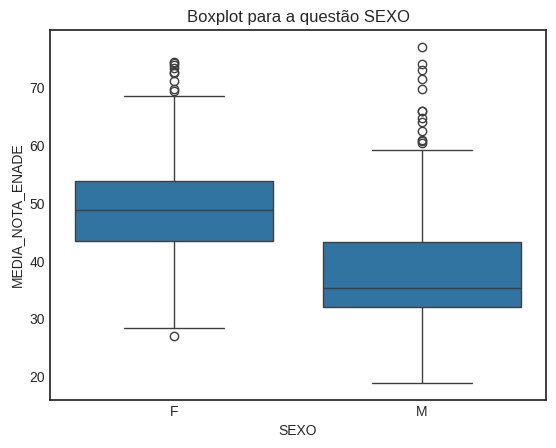

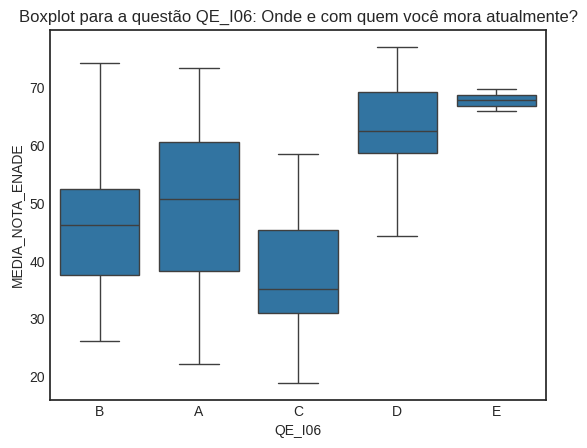

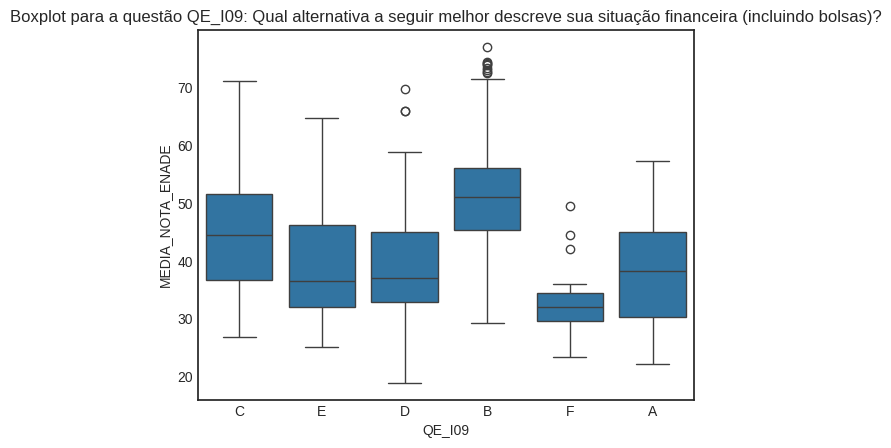

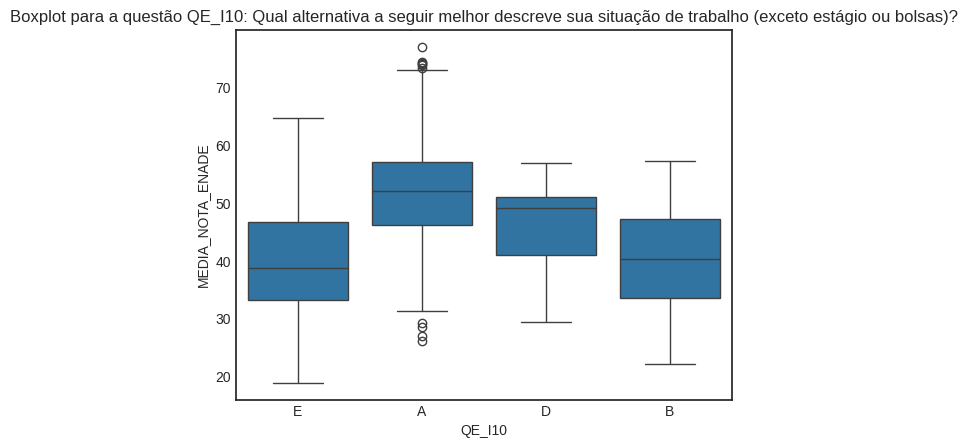

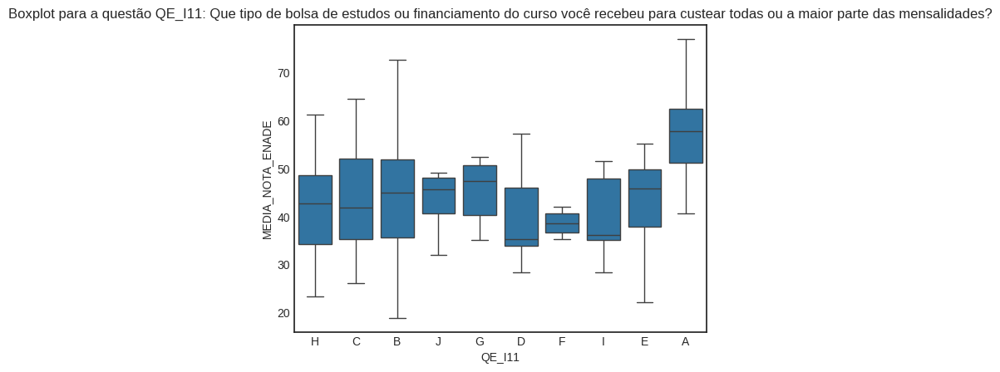

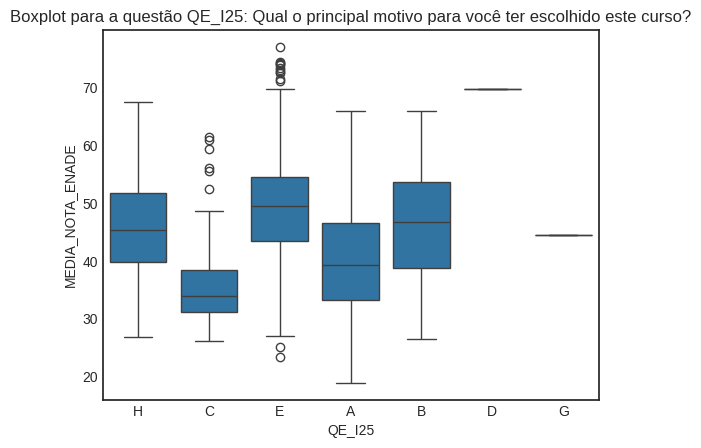

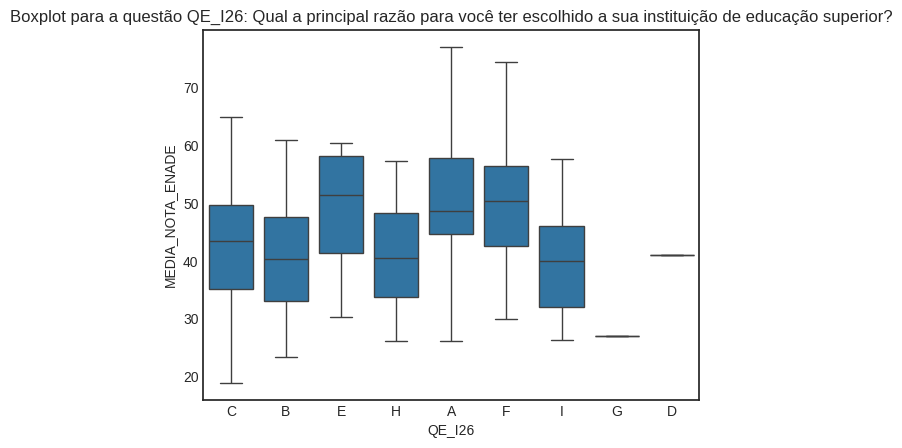

In [ ]:
#import matplotlib.pyplot as plt

variaveis_relevantes = ['SEXO', 'QE_I06', 'QE_I09', 'QE_I10', 'QE_I11', 'QE_I25', 'QE_I26']

for col in variaveis_relevantes:
  sns.boxplot(x=col, y="MEDIA_NOTA_ENADE", data=base_socioec_tratada_3)
  if col not in dic_questoes_socioec:
    plt.title(f"Boxplot para a questão {col}")
  else:
    plt.title(f"Boxplot para a questão {col}: {dic_questoes_socioec[col]}")
  plt.show()

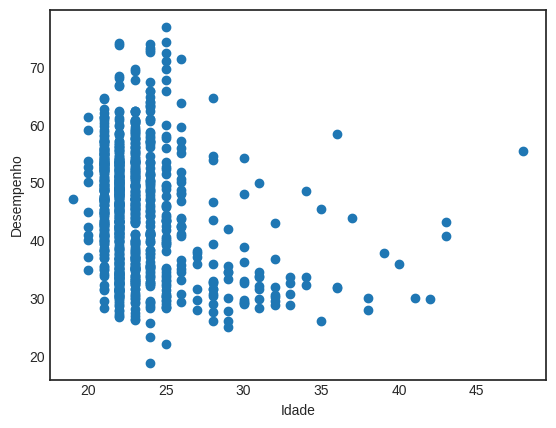

In [ ]:
# Variável quantitativa.

# Spearman.

# Verificar se é uma relação monotônica.
plt.scatter(base_socioec_tratada_3["IDADE"], base_socioec_tratada_3["MEDIA_NOTA_ENADE"])
plt.xlabel("Idade")
plt.ylabel("Desempenho")
plt.show()

In [ ]:
# Calcular Spearman.

from scipy.stats import spearmanr

# Calcula Spearman
coef, p_value = spearmanr(base_socioec_tratada_3["IDADE"], base_socioec_tratada_3["MEDIA_NOTA_ENADE_tratada"])

print("Coeficiente de Spearman:", coef)
print("p-valor:", p_value)

Coeficiente de Spearman: 0.25101277790259
p-valor: 4.807121683487458e-15


In [ ]:
# Idade não tem correlação significativa com o desempenho.

In [ ]:
base_socioec_variaveis_principais_3 = base_socioec_tratada_3[['SEXO', 'QE_I06', 'QE_I09', 'QE_I10', 'QE_I11', 'QE_I25', 'QE_I26', 'MEDIA_NOTA_ENADE', 'MEDIA_NOTA_ENADE_tratada']]

In [ ]:
import os

caminho_pasta = "/content/drive/MyDrive/ETL RP II/etl_v5/"
caminho_arquivo = os.path.join(caminho_pasta, "base_socioec_variaveis_principais_3.csv")

# Agora salvar
base_socioec_variaveis_principais_3.to_csv(
    caminho_arquivo,
    sep=";",
    index=False,
    encoding="utf-8"
)

print("Arquivo salvo em:", caminho_arquivo)

Arquivo salvo em: /content/drive/MyDrive/ETL RP II/etl_v5/base_socioec_variaveis_principais_3.csv


#### Adicionando a chave e salvando o conjunto para que seja possível diferenciar cada um dos registros:

In [ ]:
# 1. Cria uma cópia só com as colunas principais + colunas necessárias para chave
base_socioec_variaveis_principais_com_chave_3 = base_socioec_tratada_3[[
    'SEXO',
    'QE_I06',
    'QE_I09',
    'QE_I10',
    'QE_I11',
    'QE_I25',
    'QE_I26',
    'MEDIA_NOTA_ENADE',
    'MEDIA_NOTA_ENADE_tratada',
    'NO_IES',
    'NO_CURSO',
    'NO_MUNICIPIO',
    'CO_IES'
]].copy()

# 2. Cria a chave concatenada
base_socioec_variaveis_principais_com_chave_3['chave'] = (
    base_socioec_variaveis_principais_com_chave_3['NO_IES'].astype(str) + "_" +
    base_socioec_variaveis_principais_com_chave_3['NO_CURSO'].astype(str) + "_" +
    base_socioec_variaveis_principais_com_chave_3['NO_MUNICIPIO'].astype(str) + "_" +
    base_socioec_variaveis_principais_com_chave_3['CO_IES'].astype(str)
)

# 3. Seleciona apenas as variáveis principais + chave
base_socioec_variaveis_principais_com_chave_3 = base_socioec_variaveis_principais_com_chave_3[[
    'chave',
    'SEXO',
    'QE_I06',
    'QE_I09',
    'QE_I10',
    'QE_I11',
    'QE_I25',
    'QE_I26',
    'MEDIA_NOTA_ENADE',
    'MEDIA_NOTA_ENADE_tratada'
]]

In [ ]:
# 4. Salvar em CSV
import os

caminho_pasta = "/content/drive/MyDrive/ETL RP II/etl_v5/"
caminho_arquivo = os.path.join(caminho_pasta, "base_socioec_variaveis_principais_com_chave_3.csv")

# Criar a pasta, se não existir
os.makedirs(caminho_pasta, exist_ok=True)

# Agora salvar
base_socioec_variaveis_principais_com_chave_3.to_csv(
    caminho_arquivo,
    sep=";",
    index=False,
    encoding="utf-8"
)

print("Arquivo salvo em:", caminho_arquivo)

Arquivo salvo em: /content/drive/MyDrive/ETL RP II/etl_v5/base_socioec_variaveis_principais_com_chave_3.csv


**Árvore de Decisão**

In [ ]:
base_infra_3 = pd.read_csv("/content/drive/MyDrive/ETL RP II/etl_v5/base_infra_variaveis_principais_com_chave_3.csv", sep=";")
base_percepcao_3 = pd.read_csv("/content/drive/MyDrive/ETL RP II/etl_v5/base_percepcao_variaveis_principais_com_chave_3.csv", sep=";")
base_socioec_3 = pd.read_csv("/content/drive/MyDrive/ETL RP II/etl_v5/base_socioec_variaveis_principais_com_chave_3.csv", sep=";")

In [ ]:
print(f'Tamanho da base de infra: {len(base_infra_3)}')
print(f'Tamanho da base de percepção: {len(base_percepcao_3)}')
print(f'Tamanho da base de características socieconômicas: {len(base_socioec_3)}')

Tamanho da base de infra: 945
Tamanho da base de percepção: 937
Tamanho da base de características socieconômicas: 945


A base de questões sobre percepção possui menos registros, uma vez que alunos de alguns cursos não responderam determinadas questões

### Tratando as bases

Removendo a média das notas dos cursos, essa variável é a resposta e não deve ser usada pelos modelos

In [ ]:
base_infra_3.drop('MEDIA_NOTA_ENADE', axis=1, inplace=True)
base_percepcao_3.drop('MEDIA_NOTA_ENADE', axis=1, inplace=True)
base_socioec_3.drop('MEDIA_NOTA_ENADE', axis=1, inplace=True)

Utilizando a chave como índice

In [ ]:
from sklearn.model_selection import train_test_split

# 1. Garantir que a chave é índice em todas as bases
base_percepcao_3 = base_percepcao_3.set_index("chave")
base_infra_3 = base_infra_3.set_index("chave")
base_socioec_3 = base_socioec_3.set_index("chave")

Transformando os campos categóricos pra o tipo "category"

In [ ]:
import pandas as pd

def convert_to_category(df: pd.DataFrame) -> None:
    """
    Converte todas as colunas não numéricas de um DataFrame para dtype 'category'.
    Altera o DataFrame no lugar (não retorna nada).
    """
    for col in df.columns:
        if not pd.api.types.is_numeric_dtype(df[col]):
            df[col] = df[col].astype("category")

In [ ]:
convert_to_category(base_infra_3)
convert_to_category(base_percepcao_3)
convert_to_category(base_socioec_3)

### Divisão estratificada

In [ ]:
from sklearn.model_selection import train_test_split

# 1. Definir índices com estratificação na base de percepção
train_idx, test_idx = train_test_split(
    base_percepcao_3.index,   # usamos a chave como índice
    test_size=0.2,
    stratify=base_percepcao_3["MEDIA_NOTA_ENADE_tratada"],
    random_state=42
)

# 2. Criar os splits em cada base
base_percepcao_train_3, base_percepcao_test_3 = base_percepcao_3.loc[train_idx], base_percepcao_3.loc[test_idx]
base_infra_train_3, base_infra_test_3         = base_infra_3.loc[train_idx], base_infra_3.loc[test_idx]
base_socioec_train_3, base_socioec_test_3     = base_socioec_3.loc[train_idx], base_socioec_3.loc[test_idx]


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
import pandas as pd

def avaliar_arvore_classificacao(base_train, base_test, alvo='MEDIA_NOTA_ENADE_tratada',
                                 max_depth=None, random_state=42,
                                 ordem_classes=None):
    """
    Cria uma árvore de decisão de classificação, treina, faz predição e retorna relatório de classificação.
    """

    # Separar features e target
    X_train = base_train.drop(columns=[alvo])
    y_train = base_train[alvo]
    X_test = base_test.drop(columns=[alvo])
    y_test = base_test[alvo]

    # Converter colunas categóricas para códigos numéricos (apenas features)
    for col in X_train.select_dtypes(["category"]).columns:
        X_train[col] = X_train[col].cat.codes
        X_test[col] = X_test[col].cat.codes

    # Criar e treinar o modelo
    arvore = DecisionTreeClassifier(max_depth=max_depth, random_state=random_state)
    arvore.fit(X_train, y_train)

    # Fazer predição
    y_pred = arvore.predict(X_test)

    # Se o usuário não passar uma ordem de classes, usa as do modelo
    if ordem_classes is None:
        ordem_classes = list(arvore.classes_)

    # Gerar relatório de classificação com ordem definida
    report = classification_report(
        y_test, y_pred,
        labels=ordem_classes,
        target_names=ordem_classes,
        output_dict=True
    )

    return {
        'classification_report': report,
        'modelo': arvore
    }

# Ordem personalizada para melhor interpretabilidade do reporte de classificação
ordem = ["baixo", "alto"]

# Exemplo de uso para cada base
result_percepcao_3 = avaliar_arvore_classificacao(base_percepcao_train_3, base_percepcao_test_3, max_depth=5, ordem_classes=ordem)
result_infra_3 = avaliar_arvore_classificacao(base_infra_train_3, base_infra_test_3, max_depth=5, ordem_classes=ordem)
result_socioec_3 = avaliar_arvore_classificacao(base_socioec_train_3, base_socioec_test_3, max_depth=5, ordem_classes=ordem)

# Para exibir de forma legível
print("Percepção:\n", pd.DataFrame(result_percepcao_3['classification_report']).transpose())
print()
print("Infra:\n", pd.DataFrame(result_infra_3['classification_report']).transpose())
print()
print("Socioeconômico:\n", pd.DataFrame(result_socioec_3['classification_report']).transpose())


Percepção:
               precision    recall  f1-score     support
baixo          0.379310  0.186441  0.250000   59.000000
alto           0.698113  0.860465  0.770833  129.000000
accuracy       0.648936  0.648936  0.648936    0.648936
macro avg      0.538712  0.523453  0.510417  188.000000
weighted avg   0.598063  0.648936  0.607380  188.000000

Infra:
               precision    recall  f1-score     support
baixo          0.800000  0.949153  0.868217   59.000000
alto           0.974576  0.891473  0.931174  129.000000
accuracy       0.909574  0.909574  0.909574    0.909574
macro avg      0.887288  0.920313  0.899696  188.000000
weighted avg   0.919789  0.909574  0.911416  188.000000

Socioeconômico:
               precision    recall  f1-score    support
baixo          0.810345  0.796610  0.803419   59.00000
alto           0.907692  0.914729  0.911197  129.00000
accuracy       0.877660  0.877660  0.877660    0.87766
macro avg      0.859019  0.855669  0.857308  188.00000
weighted avg  

In [ ]:
# Com grid
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
import pandas as pd

def avaliar_arvore_com_gridsearch(base_train, base_test, alvo='MEDIA_NOTA_ENADE_tratada',
                                  ordem_classes=None, random_state=42):
    """
    Aplica GridSearchCV em uma Árvore de Decisão para encontrar os melhores hiperparâmetros.
    Retorna o melhor modelo e o relatório de classificação.
    """

     # Separar features e target
    X_train = base_train.drop(columns=[alvo])
    y_train = base_train[alvo]
    X_test = base_test.drop(columns=[alvo])
    y_test = base_test[alvo]

     # Converter colunas categóricas para códigos numéricos
    for col in X_train.select_dtypes(["category"]).columns:
        X_train[col] = X_train[col].cat.codes
        X_test[col] = X_test[col].cat.codes

     # Definir grade de hiperparâmetros
    param_grid = {
        'criterion': ['gini', 'entropy', 'log_loss'],
        'max_depth': [3, 5, 7, 9, None],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }

     # Criar o modelo base
    arvore = DecisionTreeClassifier(random_state=random_state)

     # Criar o GridSearchCV (usa 5-fold cross validation)
    grid_search = GridSearchCV(
        estimator=arvore,
        param_grid=param_grid,
        cv=5,
        scoring='f1_macro',  # métrica global (boa para classes desbalanceadas)
        n_jobs=-1,
        verbose=1
    )

     # Treinar o GridSearch
    grid_search.fit(X_train, y_train)

     # Obter o melhor modelo
    melhor_modelo = grid_search.best_estimator_

     # Fazer predição
    y_pred = melhor_modelo.predict(X_test)

     # Ajustar ordem de classes
    if ordem_classes is None:
        ordem_classes = list(melhor_modelo.classes_)

     # Gerar relatório de classificação
    report = classification_report(
        y_test, y_pred,
        labels=ordem_classes,
        target_names=ordem_classes,
        output_dict=True
    )

    return {
        'classification_report': report,
        'modelo': melhor_modelo,
        'melhores_parametros': grid_search.best_params_
    }

 # ---- Exemplo de uso ----
ordem = ["baixo", "alto"]

result_percepcao_3 = avaliar_arvore_com_gridsearch(base_percepcao_train_3, base_percepcao_test_3, ordem_classes=ordem)
result_infra_3 = avaliar_arvore_com_gridsearch(base_infra_train_3, base_infra_test_3, ordem_classes=ordem)
result_socioec_3 = avaliar_arvore_com_gridsearch(base_socioec_train_3, base_socioec_test_3, ordem_classes=ordem)

 # Exibir resultados
print("Percepção - Melhores parâmetros:", result_percepcao_3['melhores_parametros'])
print(pd.DataFrame(result_percepcao_3['classification_report']).transpose(), "\n")

print("Infra - Melhores parâmetros:", result_infra_3['melhores_parametros'])
print(pd.DataFrame(result_infra_3['classification_report']).transpose(), "\n")

print("Socioeconômico - Melhores parâmetros:", result_socioec_3['melhores_parametros'])
print(pd.DataFrame(result_socioec_3['classification_report']).transpose(), "\n")

Fitting 5 folds for each of 135 candidates, totalling 675 fits
Fitting 5 folds for each of 135 candidates, totalling 675 fits
Fitting 5 folds for each of 135 candidates, totalling 675 fits
Percepção - Melhores parâmetros: {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 10}
              precision    recall  f1-score     support
baixo          0.393939  0.220339  0.282609   59.000000
alto           0.703226  0.844961  0.767606  129.000000
accuracy       0.648936  0.648936  0.648936    0.648936
macro avg      0.548583  0.532650  0.525107  188.000000
weighted avg   0.606163  0.648936  0.615399  188.000000 

Infra - Melhores parâmetros: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 2}
              precision    recall  f1-score     support
baixo          0.800000  0.949153  0.868217   59.000000
alto           0.974576  0.891473  0.931174  129.000000
accuracy       0.909574  0.909574  0.909574    0.909574
macro avg 

#### Matrizes de confusão

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

ordem_classes = ["baixo", "alto"]

def plotar_matriz_confusao(modelo, X_test, y_test, titulo="Matriz de Confusão"):
    """
    Gera e plota a matriz de confusão para um modelo treinado,
    com ordem personalizada de classes.
    """
    # Converter categóricas se houver
    for col in X_test.select_dtypes(["category"]).columns:
        X_test[col] = X_test[col].cat.codes

    # Predição
    y_pred = modelo.predict(X_test)

    # Definir ordem das classes
    ordem_classes = ["baixo", "alto"]

    # Matriz de confusão na ordem especificada
    cm = confusion_matrix(y_test, y_pred, labels=ordem_classes)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=ordem_classes)

    # Plot
    disp.plot(cmap=plt.cm.Blues, values_format='d')
    plt.title(titulo)
    plt.show()

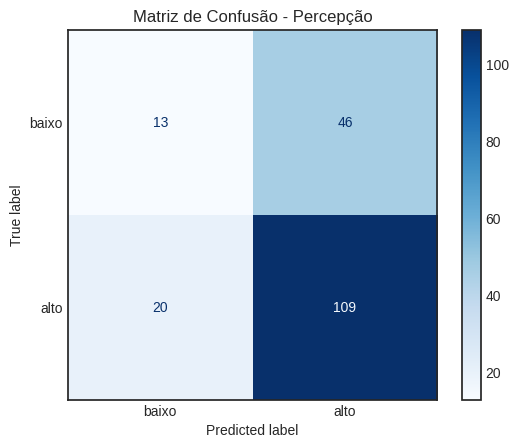

In [ ]:
# Percepção
plotar_matriz_confusao(result_percepcao_3['modelo'],
                       base_percepcao_test_3.drop(columns=['MEDIA_NOTA_ENADE_tratada']),
                       base_percepcao_test_3['MEDIA_NOTA_ENADE_tratada'],
                       titulo="Matriz de Confusão - Percepção")

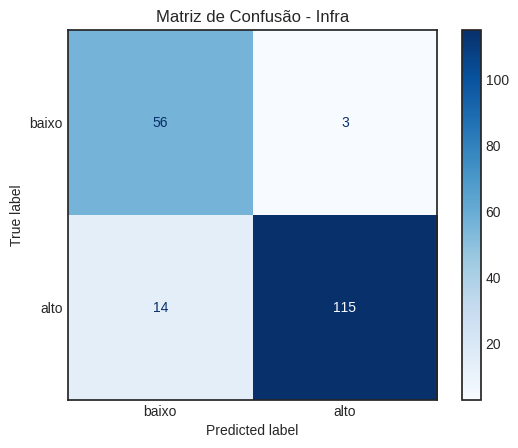

In [ ]:
# Infra
plotar_matriz_confusao(result_infra_3['modelo'],
                       base_infra_test_3.drop(columns=['MEDIA_NOTA_ENADE_tratada']),
                       base_infra_test_3['MEDIA_NOTA_ENADE_tratada'],
                       titulo="Matriz de Confusão - Infra")

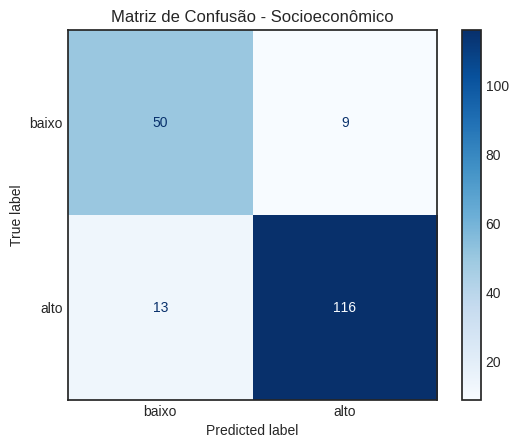

In [ ]:
# Socioeconômico
plotar_matriz_confusao(result_socioec_3['modelo'],
                       base_socioec_test_3.drop(columns=['MEDIA_NOTA_ENADE_tratada']),
                       base_socioec_test_3['MEDIA_NOTA_ENADE_tratada'],
                       titulo="Matriz de Confusão - Socioeconômico")

#### Entendendo quais variáveis são mais relevantes para os modelos

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_feature_importances(modelo, X_train, titulo="Importância das variáveis"):
    """
    Gera gráfico de barras com a importância das variáveis da árvore de decisão.
    """
    importancias = modelo.feature_importances_
    variaveis = X_train.columns

    df_importancias = pd.DataFrame({
        "Variável": variaveis,
        "Importância": importancias
    }).sort_values(by="Importância", ascending=False)

    plt.figure(figsize=(10, 6))
    sns.barplot(x="Importância", y="Variável", data=df_importancias, palette="Blues_r")
    plt.title(titulo)
    plt.show()
    return df_importancias


/tmp/ipython-input-1166543859.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Importância", y="Variável", data=df_importancias, palette="Blues_r")


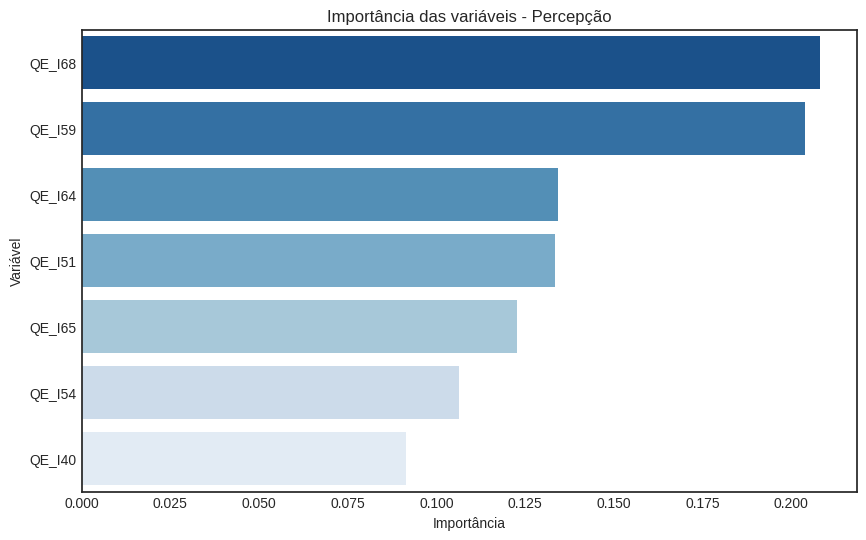

,Variável,Importância
6,QE_I68,0.207990
3,QE_I59,0.203810
4,QE_I64,0.134324
1,QE_I51,0.133402
5,QE_I65,0.122586
2,QE_I54,0.106495
0,QE_I40,0.091394


In [ ]:
# Percepção
plot_feature_importances(
    result_percepcao_3['modelo'],
    base_percepcao_train_3.drop(columns=["MEDIA_NOTA_ENADE_tratada"]),
    titulo="Importância das variáveis - Percepção"
)

/tmp/ipython-input-1166543859.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Importância", y="Variável", data=df_importancias, palette="Blues_r")


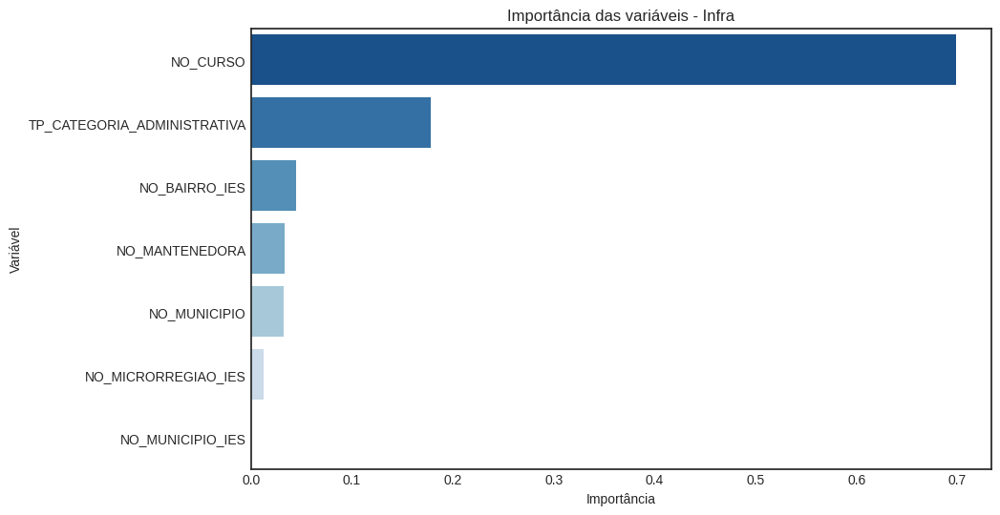

,Variável,Importância
0,NO_CURSO,0.698560
6,TP_CATEGORIA_ADMINISTRATIVA,0.177715
2,NO_BAIRRO_IES,0.044718
1,NO_MANTENEDORA,0.033713
4,NO_MUNICIPIO,0.032647
5,NO_MICRORREGIAO_IES,0.012647
3,NO_MUNICIPIO_IES,0.000000


In [ ]:
# Infra
plot_feature_importances(
    result_infra_3['modelo'],
    base_infra_train_3.drop(columns=["MEDIA_NOTA_ENADE_tratada"]),
    titulo="Importância das variáveis - Infra"
)


/tmp/ipython-input-1166543859.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Importância", y="Variável", data=df_importancias, palette="Blues_r")


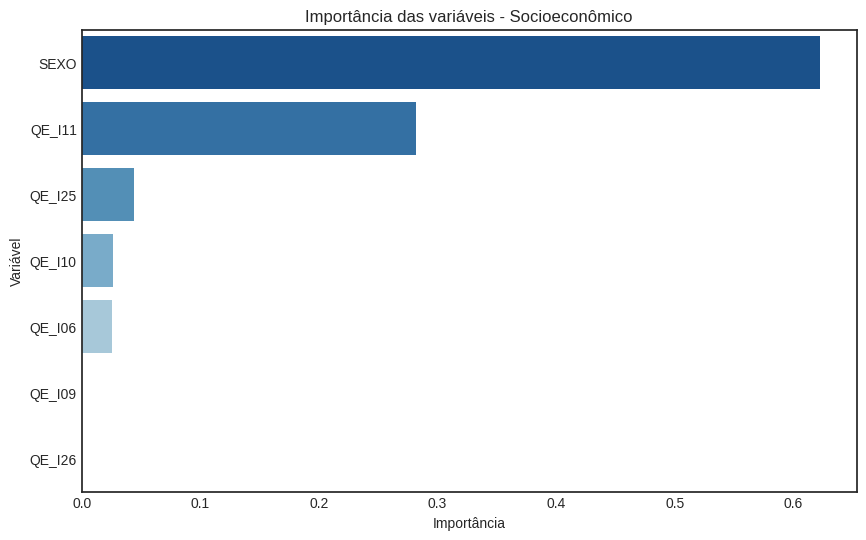

,Variável,Importância
0,SEXO,0.622357
4,QE_I11,0.281916
5,QE_I25,0.044090
3,QE_I10,0.026255
1,QE_I06,0.025381
2,QE_I09,0.000000
6,QE_I26,0.000000


In [ ]:
# Socioeconômico
plot_feature_importances(
    result_socioec_3['modelo'],
    base_socioec_train_3.drop(columns=["MEDIA_NOTA_ENADE_tratada"]),
    titulo="Importância das variáveis - Socioeconômico"
)


#### Exibindo e salvando as árvores de decisão

In [ ]:
from sklearn import tree
import matplotlib.pyplot as plt

def plotar_arvore(modelo, feature_names):
    plt.figure(figsize=(72, 20), dpi=200)  # aumenta bem a resolução
    tree.plot_tree(
        modelo,
        feature_names=feature_names,
        class_names=modelo.classes_.astype(str),
        filled=True,
        rounded=True,
        fontsize=17
    )
    plt.show()

In [ ]:
from sklearn.tree import export_graphviz
import graphviz
import os

def salvar_arvore_pdf(modelo, feature_names, class_names, caminho_arquivo="/content/minha_arvore_3.pdf"):
    # garante que a pasta existe
    os.makedirs(os.path.dirname(caminho_arquivo), exist_ok=True)

    # Exporta a árvore em formato DOT
    dot_data = export_graphviz(
        modelo,
        out_file=None,
        feature_names=feature_names,
        class_names=class_names,
        filled=True,
        rounded=True,
        special_characters=True
    )

    # Cria objeto graphviz
    graph = graphviz.Source(dot_data)

    # Salva no caminho escolhido
    graph.render(caminho_arquivo, format="pdf", cleanup=True)
    print(f"Árvore salva em: {caminho_arquivo}")

In [ ]:
salvar_arvore_pdf(result_percepcao_3['modelo'], base_percepcao_train_3.drop(columns=['MEDIA_NOTA_ENADE_tratada']).columns, result_percepcao_3['modelo'].classes_.astype(str), "/content/drive/MyDrive/ETL RP II/etl_v5/arvore_percepcao")

Árvore salva em: /content/drive/MyDrive/ETL RP II/etl_v5/arvore_percepcao


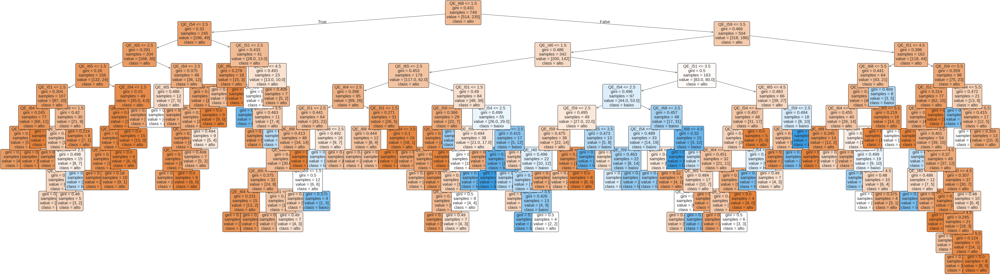

In [ ]:
plotar_arvore(result_percepcao_3['modelo'], base_percepcao_train_3.drop(columns=['MEDIA_NOTA_ENADE_tratada']).columns)

In [ ]:
salvar_arvore_pdf(result_infra_3['modelo'], base_infra_train_3.drop(columns=['MEDIA_NOTA_ENADE_tratada']).columns, result_infra_3['modelo'].classes_.astype(str), "/content/drive/MyDrive/ETL RP II/etl_v5/arvore_infra")

Árvore salva em: /content/drive/MyDrive/ETL RP II/etl_v5/arvore_infra


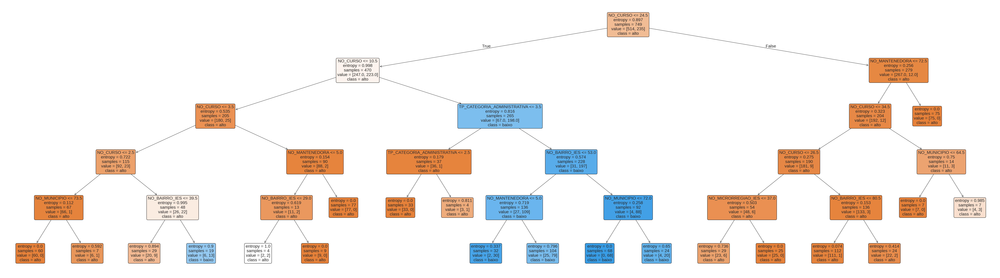

In [ ]:
plotar_arvore(result_infra_3['modelo'], base_infra_train_3.drop(columns=['MEDIA_NOTA_ENADE_tratada']).columns)

In [ ]:
salvar_arvore_pdf(result_socioec_3['modelo'], base_socioec_train_3.drop(columns=['MEDIA_NOTA_ENADE_tratada']).columns, result_socioec_3['modelo'].classes_.astype(str), "/content/drive/MyDrive/ETL RP II/etl_v5/arvore_socioec")

Árvore salva em: /content/drive/MyDrive/ETL RP II/etl_v5/arvore_socioec


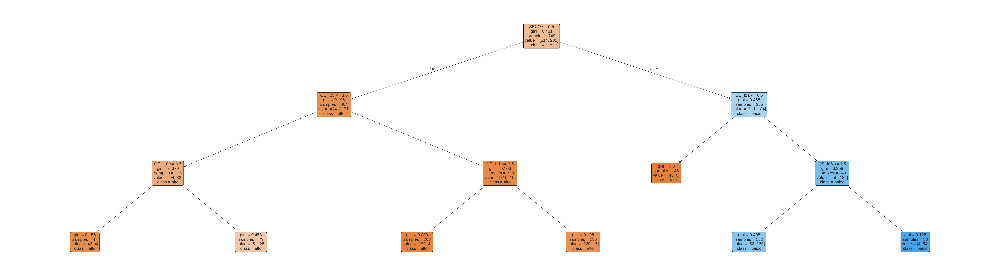

In [ ]:
plotar_arvore(result_socioec_3['modelo'], base_socioec_train_3.drop(columns=['MEDIA_NOTA_ENADE_tratada']).columns)

#### Dicionário com os códigos gerados para as variáveis categóricas

In [ ]:
import pandas as pd

def gerar_de_para_tabela(df: pd.DataFrame, imprimir: bool = True, mostrar_index: bool = False) -> pd.DataFrame:
    """
    Gera um DataFrame com o de-para (Coluna, Code, Categoria) para todas as colunas categóricas
    do DataFrame `df`. Imprime a tabela completa sem truncamento quando imprimir=True.

    Parametros:
    - df: DataFrame com colunas categóricas (pandas.CategoricalDtype)
    - imprimir: se True, faz print da tabela completa (padrão True)
    - mostrar_index: se True, mantém o índice ao imprimir (padrão False)

    Retorna:
    - DataFrame com colunas ['Coluna', 'Code', 'Categoria']
    """
    tabelas = []
    # Seleciona apenas colunas que realmente são categorical
    cat_cols = [c for c in df.columns if pd.api.types.is_categorical_dtype(df[c])]
    for col in cat_cols:
        categories = list(df[col].cat.categories)  # garante lista normal
        mapping = pd.DataFrame({
            "Coluna": [col] * len(categories),
            "Code": list(range(len(categories))),
            "Categoria": categories
        })
        tabelas.append(mapping)

    if not tabelas:
        resultado = pd.DataFrame(columns=["Coluna", "Code", "Categoria"])
        if imprimir:
            print("Nenhuma coluna com dtype 'category' encontrada.")
        return resultado

    de_para_final = pd.concat(tabelas, ignore_index=True)

    if imprimir:
        # Ajustes temporários para não truncar nada
        with pd.option_context(
            'display.max_rows', None,
            'display.max_columns', None,
            'display.max_colwidth', None
        ):
            # to_string garante que nada seja ocultado/formatado internamente pelo notebook
            print(de_para_final.to_string(index=mostrar_index))

    return de_para_final

De-para da base de percepção:

In [ ]:
de_para_percepcao = gerar_de_para_tabela(base_percepcao_train_3)

                  Coluna  Code Categoria
MEDIA_NOTA_ENADE_tratada     0      alto
MEDIA_NOTA_ENADE_tratada     1     baixo


/tmp/ipython-input-4263614687.py:18: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  cat_cols = [c for c in df.columns if pd.api.types.is_categorical_dtype(df[c])]


De-para da base de infraestrutura:

In [ ]:
de_para_infra = gerar_de_para_tabela(base_infra_train_3)

                  Coluna  Code                                                                     Categoria
                NO_CURSO     0                                                                   Agronegócio
                NO_CURSO     1                                                                     Agronomia
                NO_CURSO     2                                                       Arquitetura E Urbanismo
                NO_CURSO     3                                                                   Biomedicina
                NO_CURSO     4                                                           Ciências Biomédicas
                NO_CURSO     5                                                            Controle Ambiental
                NO_CURSO     6                                                                    Enfermagem
                NO_CURSO     7                                                         Engenharia Agronômica
                NO_

/tmp/ipython-input-4263614687.py:18: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  cat_cols = [c for c in df.columns if pd.api.types.is_categorical_dtype(df[c])]


De-para da base de características socioeconômicas:

In [ ]:
de_para_socioec = gerar_de_para_tabela(base_socioec_train_3)

                  Coluna  Code Categoria
                    SEXO     0         F
                    SEXO     1         M
                  QE_I06     0         A
                  QE_I06     1         B
                  QE_I06     2         C
                  QE_I06     3         D
                  QE_I06     4         E
                  QE_I09     0         A
                  QE_I09     1         B
                  QE_I09     2         C
                  QE_I09     3         D
                  QE_I09     4         E
                  QE_I09     5         F
                  QE_I10     0         A
                  QE_I10     1         B
                  QE_I10     2         D
                  QE_I10     3         E
                  QE_I11     0         A
                  QE_I11     1         B
                  QE_I11     2         C
                  QE_I11     3         D
                  QE_I11     4         E
                  QE_I11     5         F
                

/tmp/ipython-input-4263614687.py:18: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  cat_cols = [c for c in df.columns if pd.api.types.is_categorical_dtype(df[c])]


**Criação das florestas aleatórias**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
import pandas as pd

def avaliar_arvore_classificacao(base_train, base_test, alvo='MEDIA_NOTA_ENADE_tratada',
                                 max_depth=None, random_state=42,
                                 ordem_classes=None):
    """
    Cria uma Floresta Aleatória de classificação, treina, faz predição e retorna relatório de classificação.
    """

    # Separar features e target
    X_train = base_train.drop(columns=[alvo])
    y_train = base_train[alvo]
    X_test = base_test.drop(columns=[alvo])
    y_test = base_test[alvo]

    # Converter colunas categóricas para códigos numéricos (apenas features)
    for col in X_train.select_dtypes(["category"]).columns:
        X_train[col] = X_train[col].cat.codes
        X_test[col] = X_test[col].cat.codes

    # Criar e treinar o modelo
    arvore = RandomForestClassifier(max_depth=max_depth, random_state=random_state, n_estimators = 100)
    arvore.fit(X_train, y_train)

    # Fazer predição
    y_pred = arvore.predict(X_test)

    # Se o usuário não passar uma ordem de classes, usa as do modelo
    if ordem_classes is None:
        ordem_classes = list(arvore.classes_)

    # Gerar relatório de classificação com ordem definida
    report = classification_report(
        y_test, y_pred,
        labels=ordem_classes,
        target_names=ordem_classes,
        output_dict=True
    )

    return {
        'classification_report': report,
        'modelo': arvore
    }

# Ordem personalizada para melhor interpretabilidade do reporte de classificação
ordem = ["baixo", "alto"]

# Exemplo de uso para cada base
result_percepcao_3 = avaliar_arvore_classificacao(base_percepcao_train_3, base_percepcao_test_3, max_depth=5, ordem_classes=ordem)
result_infra_3 = avaliar_arvore_classificacao(base_infra_train_3, base_infra_test_3, max_depth=5, ordem_classes=ordem)
result_socioec_3 = avaliar_arvore_classificacao(base_socioec_train_3, base_socioec_test_3, max_depth=5, ordem_classes=ordem)

# Para exibir de forma legível
print("Percepção:\n", pd.DataFrame(result_percepcao_3['classification_report']).transpose())
print()
print("Infra:\n", pd.DataFrame(result_infra_3['classification_report']).transpose())
print()
print("Socioeconômico:\n", pd.DataFrame(result_socioec_3['classification_report']).transpose())

Percepção:
               precision    recall  f1-score     support
baixo          0.333333  0.016949  0.032258   59.000000
alto           0.686486  0.984496  0.808917  129.000000
accuracy       0.680851  0.680851  0.680851    0.680851
macro avg      0.509910  0.500723  0.420588  188.000000
weighted avg   0.575657  0.680851  0.565178  188.000000

Infra:
               precision    recall  f1-score     support
baixo          0.833333  0.847458  0.840336   59.000000
alto           0.929688  0.922481  0.926070  129.000000
accuracy       0.898936  0.898936  0.898936    0.898936
macro avg      0.881510  0.884969  0.883203  188.000000
weighted avg   0.899449  0.898936  0.899164  188.000000

Socioeconômico:
               precision    recall  f1-score     support
baixo          0.819672  0.847458  0.833333   59.000000
alto           0.929134  0.914729  0.921875  129.000000
accuracy       0.893617  0.893617  0.893617    0.893617
macro avg      0.874403  0.881093  0.877604  188.000000
weighted 

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
import pandas as pd

def avaliar_random_forest_com_gridsearch(base_train, base_test, alvo='MEDIA_NOTA_ENADE_tratada',
                                         ordem_classes=None,
                                         param_grid=None,
                                         cv=5,
                                         scoring='f1_macro',
                                         n_jobs=-1,
                                         verbose=0):
    """
    Treina uma Random Forest com validação cruzada via GridSearchCV,
    faz predição no conjunto de teste e retorna o relatório de classificação.
    """

    # Separar features e alvo
    X_train = base_train.drop(columns=[alvo])
    y_train = base_train[alvo]
    X_test = base_test.drop(columns=[alvo])
    y_test = base_test[alvo]

    # Converter colunas categóricas para códigos numéricos (apenas features)
    for col in X_train.select_dtypes(["category"]).columns:
        X_train[col] = X_train[col].cat.codes
        X_test[col] = X_test[col].cat.codes

    # Parâmetros padrão se nenhum grid for passado
    if param_grid is None:
        param_grid = {
            'n_estimators': [100, 200, 300, 400],
            'max_depth': [None, 10, 20, 30],
            'min_samples_split': [2, 5, 10],
            'random_state': [42]
        }

    # Criar classificador base
    modelo_base = RandomForestClassifier()

    # GridSearchCV com validação cruzada
    grid_search = GridSearchCV(
        estimator=modelo_base,
        param_grid=param_grid,
        cv=cv,
        scoring=scoring,
        n_jobs=n_jobs,
        verbose=verbose
    )

    # Treinar com busca de hiperparâmetros
    grid_search.fit(X_train, y_train)

    # Melhor modelo encontrado
    melhor_modelo = grid_search.best_estimator_

    # Fazer predição no conjunto de teste
    y_pred = melhor_modelo.predict(X_test)

    # Definir ordem das classes (se não foi passada)
    if ordem_classes is None:
        ordem_classes = list(melhor_modelo.classes_)

    # Gerar relatório
    report = classification_report(
        y_test,
        y_pred,
        labels=ordem_classes,
        target_names=ordem_classes,
        output_dict=True
    )

    matriz_confusao = pd.DataFrame(
        confusion_matrix(y_test, y_pred, labels=ordem_classes),
        index=[f"Real: {c}" for c in ordem_classes],
        columns=[f"Pred: {c}" for c in ordem_classes]
    )

    return {
        'classification_report': report,
        'melhor_modelo': melhor_modelo,
        'melhores_parametros': grid_search.best_params_,
        'resultados_cv': grid_search.cv_results_,
        'matriz_confusao': matriz_confusao
    }

ordem = ["baixo", "alto"]

result_percepcao_3 = avaliar_random_forest_com_gridsearch(base_percepcao_train_3, base_percepcao_test_3, ordem_classes=ordem)
result_infra_3 = avaliar_random_forest_com_gridsearch(base_infra_train_3, base_infra_test_3, ordem_classes=ordem)
result_socioec_3 = avaliar_random_forest_com_gridsearch(base_socioec_train_3, base_socioec_test_3, ordem_classes=ordem)

# Exibir resultados
print("Percepção:\n", pd.DataFrame(result_percepcao_3['classification_report']).transpose())
print("Melhores parâmetros:", result_percepcao_3['melhores_parametros'])
print()

print("Infra:\n", pd.DataFrame(result_infra_3['classification_report']).transpose())
print("Melhores parâmetros:", result_infra_3['melhores_parametros'])
print()

print("Socioeconômico:\n", pd.DataFrame(result_socioec_3['classification_report']).transpose())
print("Melhores parâmetros:", result_socioec_3['melhores_parametros'])


Percepção:
               precision    recall  f1-score     support
baixo          0.416667  0.169492  0.240964   59.000000
alto           0.701220  0.891473  0.784983  129.000000
accuracy       0.664894  0.664894  0.664894    0.664894
macro avg      0.558943  0.530482  0.512973  188.000000
weighted avg   0.611918  0.664894  0.614254  188.000000
Melhores parâmetros: {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 100, 'random_state': 42}

Infra:
               precision    recall  f1-score     support
baixo          0.852459  0.881356  0.866667   59.000000
alto           0.944882  0.930233  0.937500  129.000000
accuracy       0.914894  0.914894  0.914894    0.914894
macro avg      0.898670  0.905794  0.902083  188.000000
weighted avg   0.915877  0.914894  0.915270  188.000000
Melhores parâmetros: {'max_depth': 10, 'min_samples_split': 10, 'n_estimators': 400, 'random_state': 42}

Socioeconômico:
               precision    recall  f1-score    support
baixo          0.796610  

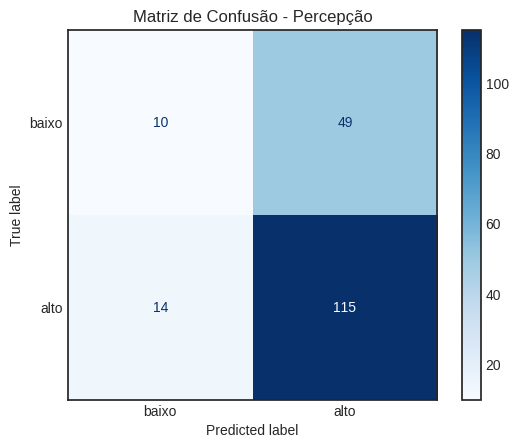

In [ ]:
plotar_matriz_confusao(result_percepcao_3['melhor_modelo'],
                       base_percepcao_test_3.drop(columns=['MEDIA_NOTA_ENADE_tratada']),
                       base_percepcao_test_3['MEDIA_NOTA_ENADE_tratada'],
                       'Matriz de Confusão - Percepção')

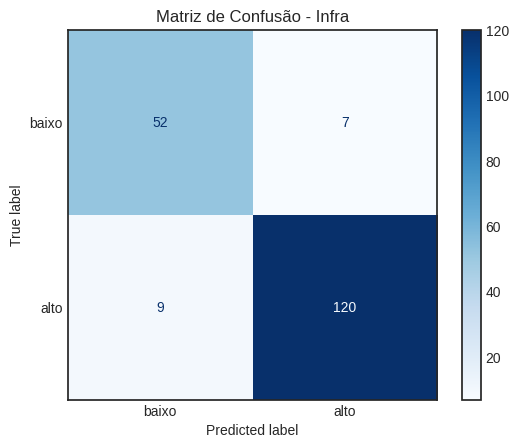

In [ ]:
plotar_matriz_confusao(result_infra_3['melhor_modelo'],
                       base_infra_test_3.drop(columns=['MEDIA_NOTA_ENADE_tratada']),
                       base_infra_test_3['MEDIA_NOTA_ENADE_tratada'],
                       'Matriz de Confusão - Infra')

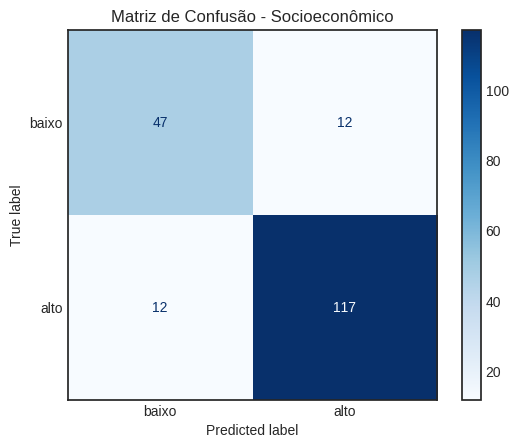

In [ ]:
plotar_matriz_confusao(result_socioec_3['melhor_modelo'],
                       base_socioec_test_3.drop(columns=['MEDIA_NOTA_ENADE_tratada']),
                       base_socioec_test_3['MEDIA_NOTA_ENADE_tratada'],
                       'Matriz de Confusão - Socioeconômico')

/tmp/ipython-input-1166543859.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Importância", y="Variável", data=df_importancias, palette="Blues_r")


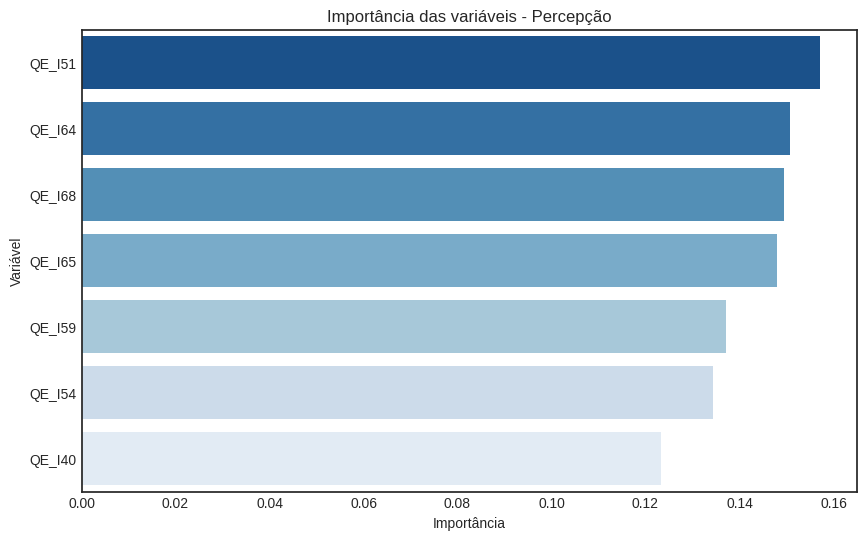

,Variável,Importância
1,QE_I51,0.157063
4,QE_I64,0.150723
6,QE_I68,0.149567
5,QE_I65,0.147935
3,QE_I59,0.137151
2,QE_I54,0.134292
0,QE_I40,0.123268


In [ ]:
plot_feature_importances(result_percepcao_3['melhor_modelo'],
                         base_percepcao_train_3.drop(columns=['MEDIA_NOTA_ENADE_tratada']),
                         'Importância das variáveis - Percepção')

/tmp/ipython-input-1166543859.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Importância", y="Variável", data=df_importancias, palette="Blues_r")


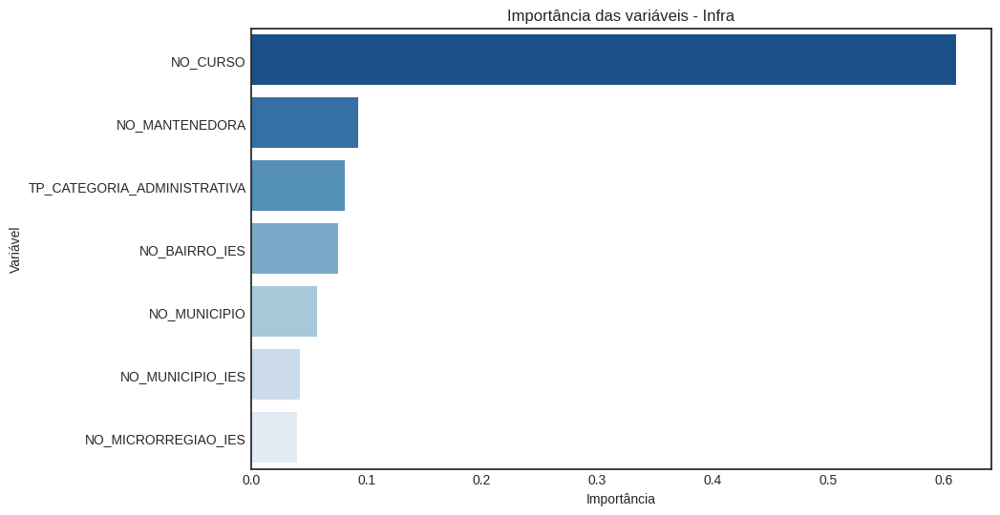

,Variável,Importância
0,NO_CURSO,0.610790
1,NO_MANTENEDORA,0.092730
6,TP_CATEGORIA_ADMINISTRATIVA,0.081234
2,NO_BAIRRO_IES,0.075684
4,NO_MUNICIPIO,0.057253
3,NO_MUNICIPIO_IES,0.042090
5,NO_MICRORREGIAO_IES,0.040219


In [ ]:
plot_feature_importances(result_infra_3['melhor_modelo'],
                         base_infra_train_3.drop(columns=['MEDIA_NOTA_ENADE_tratada']),
                         'Importância das variáveis - Infra')

/tmp/ipython-input-1166543859.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Importância", y="Variável", data=df_importancias, palette="Blues_r")


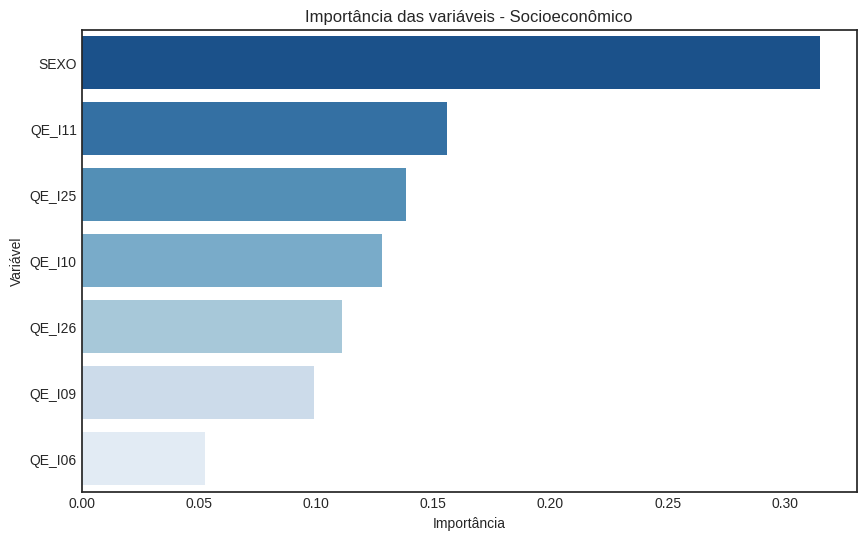

,Variável,Importância
0,SEXO,0.314935
4,QE_I11,0.155876
5,QE_I25,0.138225
3,QE_I10,0.127966
6,QE_I26,0.111140
2,QE_I09,0.099285
1,QE_I06,0.052573


In [ ]:
plot_feature_importances(result_socioec_3['melhor_modelo'],
                         base_socioec_train_3.drop(columns=['MEDIA_NOTA_ENADE_tratada']),
                         'Importância das variáveis - Socioeconômico')